In [1]:
import os
import cv2
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
from keras.layers import Input, Dense, Reshape, Flatten, Dropout
from keras.layers import BatchNormalization, Activation, LeakyReLU, GlobalAveragePooling2D
from keras.layers.convolutional import UpSampling2D, Conv2D, ZeroPadding2D, Conv2DTranspose
from keras.models import Model
from keras.losses import binary_crossentropy
from tensorflow.keras.optimizers import Adam
import keras
import tensorflow as tf

2023-07-31 16:07:21.762215: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-07-31 16:07:24.947571: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; dlerror: libnvinfer.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /home/aaslan/venv-jupyter-310/lib/python3.8/site-packages/cv2/../../lib64:
2023-07-31 16:07:24.947815: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer_plugin.so.7'; dlerror: libnvinfer_plugin.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /home/aaslan/venv-jupyter-310/lib/python3.8/site-packag

In [3]:
#DONTTTTT TOUCHH
import os
import zipfile

output_dir = 'sentetik'
zip_filename = 'sentetik.zip'

# Create a zip file
with zipfile.ZipFile(zip_filename, 'w') as zipf:
    # Iterate over the files in the output directory
    for file_name in os.listdir(output_dir):
        file_path = os.path.join(output_dir, file_name)
        # Add each file to the zip archive
        zipf.write(file_path, file_name)

# Print the path of the created zip file
print(f"Zip file created: {zip_filename}")

Zip file created: sentetik.zip


In [15]:
#DON'T TOUCHHHHHH
import zipfile

zip_file = "sentetik.zip"  # Include the file extension (.zip)
extract_directory = "abc"  # Specify the directory where you want to extract the files

with zipfile.ZipFile(zip_file, "r") as zip_ref:
    zip_ref.extractall(extract_directory)

print("Extraction complete.")

Extraction complete.


In [2]:
SIZE = 256
image_s =[]
dataset_s=[]
image_labels = []
image_directory_2  = 'good/'
good_images_2 = os.listdir(image_directory_2)
for i, image_name in enumerate(good_images_2):
    if (image_name.endswith('png')):
        image_s = cv2.imread(image_directory_2 + image_name)
        image_s = Image.fromarray(image_s,'RGB')
        image_s = image_s.resize((SIZE, SIZE)) 
        dataset_s.append(np.array(image_s))
dataset_s = np.array(dataset_s)
train_x = dataset_s[0:450]
train_x = train_x.astype('float32') / 255.
val_x = dataset_s[450:500]
val_x = val_x.astype('float32') / 255.
test_good_x = dataset_s[450:500]
test_good_x = test_good_x.astype('float32') / 255.

In [3]:
SIZE = 256
aug = []
dirr  = 'augmented_images/'
img = os.listdir(dirr)
for i in (img):
    if i.endswith('jpg'):
        im = Image.open(dirr + i)
        im = im.resize((SIZE, SIZE))
        aug.append(np.array(im))
aug = np.array(aug) 
aug = aug.astype('float32') / 255.
train_x = np.concatenate((train_x, aug),axis=0)

In [3]:
train_x.shape

(450, 256, 256, 3)

In [3]:
img_rows, img_cols, channels = 256, 256, 3
input_shape = (img_rows, img_cols, channels)

In [4]:
latent = 128
def build_encoder():
    model = keras.Sequential()
    model.add(Conv2D(16, kernel_size=3, strides=2, input_shape=input_shape, padding="same", activation='relu'))
    model.add(Conv2D(32, kernel_size=3, strides=2, padding="same", activation='relu'))
    model.add(Conv2D(64, kernel_size=3, strides=2, padding="same", activation='relu'))
    model.add(Conv2D(128, kernel_size=3, strides=2, padding="same", activation='relu'))
    model.add(Flatten())
    model.add(Dense(latent, activation='relu'))
    model.summary()
    img = Input(shape=(256,256,3))
    validity = model(img)
    return Model(img, validity)

def build_decoder():
    model = keras.Sequential()
    model.add(Dense(16 * 16 * 128, activation='relu', input_shape=(latent,)))
    model.add(Reshape((16, 16, 128)))
    model.add(Conv2DTranspose(64, kernel_size=3, strides=2, padding="same", activation='relu'))
    model.add(Conv2DTranspose(32, kernel_size=3, strides=2, padding="same", activation='relu'))
    model.add(Conv2DTranspose(16, kernel_size=3, strides=2, padding="same", activation='relu'))
    model.add(Conv2DTranspose(3, kernel_size=3, strides=2, padding="same", activation='tanh'))
    model.summary()
    encoded_repr = Input(shape=(latent,))
    img = model(encoded_repr)
    return keras.Model(encoded_repr, img)

In [61]:
encoder_2.summary()

Model: "functional_286"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_106 (InputLayer)       [(None, 16, 16, 128)]     0         
_________________________________________________________________
sequential_89 (Sequential)   (None, 1)                 32769     
Total params: 32,769
Trainable params: 32,769
Non-trainable params: 0
_________________________________________________________________


In [5]:
def build_encoder_2():

    model = keras.Sequential()
    model.add(Conv2D(16, kernel_size=3, strides=2, input_shape=input_shape, padding="same", activation='relu'))
    model.add(Conv2D(32, kernel_size=3, strides=2, padding="same", activation='relu'))
    model.add(Conv2D(64, kernel_size=3, strides=2, padding="same", activation='relu'))
    model.add(Conv2D(128, kernel_size=3, strides=2, padding="same", activation='relu'))
    img = Input(shape=(256,256,3))
    validity = model(img)
    return Model(img, validity)

def build_discriminator():
    model = keras.Sequential()
    model.add(Flatten(input_shape=(16, 16, 128)))  # Update input_shape here
    model.add(Dense(1, activation='sigmoid'))
    model.summary()
    img = Input(shape=(16, 16, 128))  # Update input_shape here to match the output shape of encoder_2
    validity = model(img)
    return Model(img, validity)

def D2():
    model = keras.Sequential()
    model.add(Conv2D(16, kernel_size=3, strides=2, input_shape=input_shape, padding="same", activation='relu'))
    model.add(Conv2D(32, kernel_size=3, strides=2, padding="same", activation='relu'))
    model.add(Conv2D(64, kernel_size=3, strides=2, padding="same", activation='relu'))
    model.add(Conv2D(128, kernel_size=3, strides=2, padding="same", activation='relu'))
    model.add(Flatten())
    model.add(Dense(latent, activation='relu'))
    model.summary()
    img = Input(shape=(256,256,3))
    validity = model(img)
    return Model(img, validity)
    

d2_loss = keras.losses.MeanSquaredError()
# Build the autoencoder
encoder = build_encoder()
decoder = build_decoder()
encoder_2 = build_encoder_2()
autoencoder = Model(encoder.input, decoder(encoder.output))
encoder = Model(encoder.input, encoder.output)

# Build the discriminator
discriminator_1 = build_discriminator()
discriminator_2 = D2()
input_img = Input(shape=input_shape)
latent_repr = encoder_2(input_img)
validity3 = discriminator_1(latent_repr)
discriminator_1 = Model(input_img, validity3)
input_img = Input(shape=input_shape)
from keras import backend as K

def adversarial_loss(y_true, y_pred):
    return K.mean(K.square(y_true - K.mean(y_pred, axis = 0)))

def content_loss(y_true, y_pred):
    return K.mean(K.abs(y_pred - y_true))

def encoder_loss(y_true, y_pred):
    return K.mean(K.square(y_pred - y_true))

# discriminator_1 = build_discriminator()
# input_img = Input(shape=input_shape)
# latent_repr = encoder_2(input_img)
# val_3 = discriminator_1(latent_repr)



# # Compile the discriminator
encoder_2.compile(optimizer='adam', loss=adversarial_loss)
discriminator_2.compile(optimizer='adam', loss=encoder_loss)
encoder.compile(optimizer='adam', loss=encoder_loss)
autoencoder.compile(optimizer='adam', loss=content_loss)
discriminator_1.compile(optimizer = 'adam', loss='binary_crossentropy')

# Then when you compile your model, you can use this loss:
# autoencoder.compile(optimizer='adam', loss=ssim_loss)


# Define the combined model
input_img = Input(shape=input_shape)
reconstructed_img = autoencoder(input_img)
validity1 = encoder_2(reconstructed_img)
validity2 = discriminator_2(reconstructed_img) 

combined = Model(input_img, [reconstructed_img, validity1, validity2])
combined.compile(loss=[content_loss,adversarial_loss, encoder_loss], 
                 loss_weights=[50, 1, 1], # same as original paper
                 optimizer='adam')



# combined = Model(input_img, [validity1, validity2])
# combined.compile(loss=['binary_crossentropy', 'mse'], 
#                  loss_weights=[1, 1], 
#                  optimizer='adam')

# combined.summary()

# combined.compile(loss=[ 'mse','binary_crossentropy', 'mse'], 
#                  loss_weights=[100, 1, 1], 
#                  optimizer='adam')



Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 128, 128, 16)      448       
                                                                 
 conv2d_1 (Conv2D)           (None, 64, 64, 32)        4640      
                                                                 
 conv2d_2 (Conv2D)           (None, 32, 32, 64)        18496     
                                                                 
 conv2d_3 (Conv2D)           (None, 16, 16, 128)       73856     
                                                                 
 flatten (Flatten)           (None, 32768)             0         
                                                                 
 dense (Dense)               (None, 128)               4194432   
                                                                 
Total params: 4,291,872
Trainable params: 4,291,872
Non-

In [ ]:
def content_loss(y_true, y_pred):
    return K.mean(K.abs(y_pred - y_true))
autoencoder = tf.keras.models.load_model('auto28orta2.h5')

In [73]:
encoder_2.summary()

Model: "functional_421"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_163 (InputLayer)       [(None, 256, 256, 3)]     0         
_________________________________________________________________
sequential_134 (Sequential)  (None, 16, 16, 128)       97440     
Total params: 97,440
Trainable params: 97,440
Non-trainable params: 0
_________________________________________________________________


In [42]:
input_img = Input(shape=input_shape)
encoded_repr = encoder(input_img)
reconstructed_img = decoder(encoded_repr)
validity1 = discriminator_1(reconstructed_img)
validity2 = discriminator_2(reconstructed_img) 
combined = Model(input_img, [reconstructed_img, validity2])
combined.compile(loss=[ 'mse', 'mse'], 
                 loss_weights=[50,  1], 
                 optimizer='adam')

In [54]:
combined.summary()

Model: "functional_183"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_67 (InputLayer)           [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
functional_175 (Functional)     (None, 256, 256, 3)  8616259     input_67[0][0]                   
__________________________________________________________________________________________________
functional_179 (Functional)     (None, 1)            130209      functional_175[0][0]             
__________________________________________________________________________________________________
functional_181 (Functional)     (None, 128)          4291872     functional_175[0][0]             
Total params: 13,038,340
Trainable params: 13,038,340
Non-trainable params: 0
_______

In [17]:
combined.summary()

Model: "functional_53"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_24 (InputLayer)           [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
functional_43 (Functional)      (None, 256, 256, 3)  8616259     input_24[0][0]                   
__________________________________________________________________________________________________
functional_41 (Functional)      (None, 16, 16, 128)  97440       functional_43[0][0]              
__________________________________________________________________________________________________
functional_49 (Functional)      (None, 128)          4291872     functional_43[0][0]              
Total params: 13,005,571
Trainable params: 13,005,571
Non-trainable params: 0
________

In [7]:
valid = np.ones((train_x.shape[0], 1))
fake = np.zeros((train_x.shape[0], 1))

0 [D loss: 0.662724] [D_2 loss: 3.208796] [G loss: 27.226606]


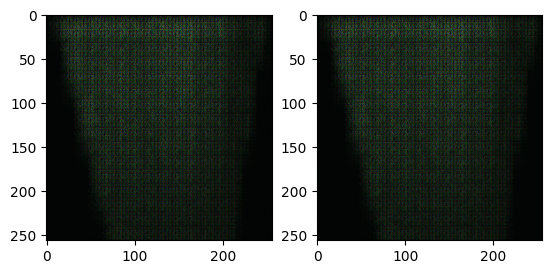

1 [D loss: 0.002132] [D_2 loss: 1.461776] [G loss: 15.592652]
2 [D loss: 0.000000] [D_2 loss: 0.894683] [G loss: 10.281281]
3 [D loss: 122.618454] [D_2 loss: 0.705992] [G loss: 9.496901]
4 [D loss: 0.075228] [D_2 loss: 0.568150] [G loss: 5.744277]
5 [D loss: 2.799196] [D_2 loss: 0.557349] [G loss: 5.131268]
6 [D loss: 21.760265] [D_2 loss: 0.459092] [G loss: 4.707246]
7 [D loss: 16.465538] [D_2 loss: 0.348955] [G loss: 4.075002]
8 [D loss: 3.292723] [D_2 loss: 0.300992] [G loss: 4.263406]
9 [D loss: 5.357265] [D_2 loss: 0.284150] [G loss: 5.745617]
10 [D loss: 27.695072] [D_2 loss: 0.275144] [G loss: 5.094175]


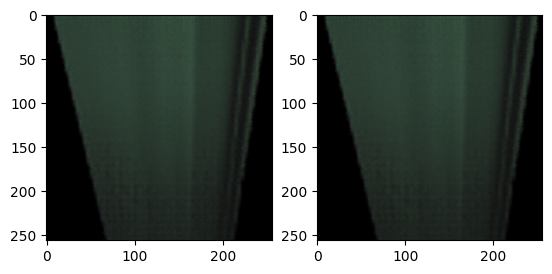

11 [D loss: 3.214741] [D_2 loss: 0.284633] [G loss: 5.311540]
12 [D loss: 0.707865] [D_2 loss: 0.263098] [G loss: 3.693386]
13 [D loss: 1.068615] [D_2 loss: 0.236381] [G loss: 3.147108]
14 [D loss: 0.857904] [D_2 loss: 0.232301] [G loss: 3.283705]
15 [D loss: 0.507985] [D_2 loss: 0.223834] [G loss: 4.118129]
16 [D loss: 6.129046] [D_2 loss: 0.216178] [G loss: 3.909897]
17 [D loss: 5.876065] [D_2 loss: 0.207286] [G loss: 3.388493]
18 [D loss: 4.306645] [D_2 loss: 0.190307] [G loss: 2.982350]
19 [D loss: 2.947800] [D_2 loss: 0.175400] [G loss: 3.658702]
20 [D loss: 3.354357] [D_2 loss: 0.161933] [G loss: 3.858788]


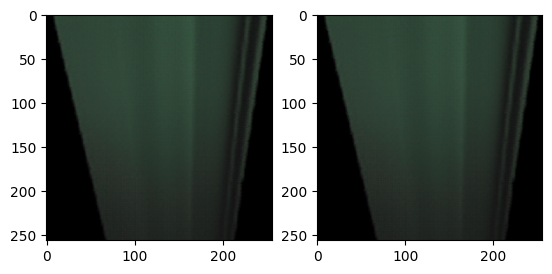

21 [D loss: 0.452405] [D_2 loss: 0.151957] [G loss: 3.149799]
22 [D loss: 5.608180] [D_2 loss: 0.137189] [G loss: 2.624490]
23 [D loss: 0.130353] [D_2 loss: 0.160019] [G loss: 3.095390]
24 [D loss: 1.086040] [D_2 loss: 0.158560] [G loss: 3.339449]
25 [D loss: 0.003482] [D_2 loss: 0.143131] [G loss: 3.204551]
26 [D loss: 0.448892] [D_2 loss: 0.130878] [G loss: 2.869336]
27 [D loss: 0.000790] [D_2 loss: 0.126909] [G loss: 2.737264]
28 [D loss: 0.000180] [D_2 loss: 0.133218] [G loss: 2.907041]
29 [D loss: 0.000292] [D_2 loss: 0.137406] [G loss: 2.708097]
30 [D loss: 0.000251] [D_2 loss: 0.137913] [G loss: 2.698507]


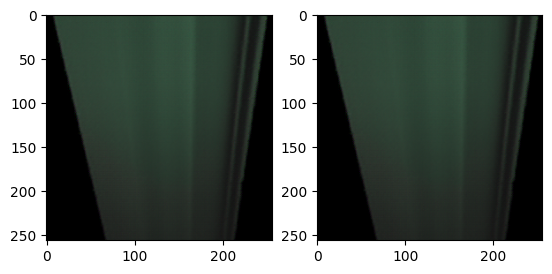

31 [D loss: 0.000189] [D_2 loss: 0.121587] [G loss: 2.240932]
32 [D loss: 0.000744] [D_2 loss: 0.111399] [G loss: 2.339065]
33 [D loss: 0.001133] [D_2 loss: 0.133939] [G loss: 2.447995]
34 [D loss: 5.052016] [D_2 loss: 0.134064] [G loss: 2.505439]
35 [D loss: 1.896506] [D_2 loss: 0.127481] [G loss: 2.237648]
36 [D loss: 2.173674] [D_2 loss: 0.116229] [G loss: 2.238063]
37 [D loss: 1.317075] [D_2 loss: 0.124299] [G loss: 2.501549]
38 [D loss: 0.008315] [D_2 loss: 0.105211] [G loss: 2.357459]
39 [D loss: 3.201096] [D_2 loss: 0.108107] [G loss: 2.207106]
40 [D loss: 13.231439] [D_2 loss: 0.088279] [G loss: 2.092025]


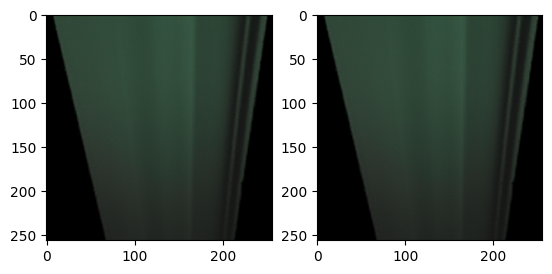

41 [D loss: 0.002446] [D_2 loss: 0.096351] [G loss: 2.207314]
42 [D loss: 0.000000] [D_2 loss: 0.088701] [G loss: 2.527379]
43 [D loss: 0.001724] [D_2 loss: 0.085555] [G loss: 2.333250]
44 [D loss: 0.000342] [D_2 loss: 0.073972] [G loss: 2.325787]
45 [D loss: 1.089809] [D_2 loss: 0.078899] [G loss: 2.107041]
46 [D loss: 2.145834] [D_2 loss: 0.075961] [G loss: 1.970760]
47 [D loss: 0.001016] [D_2 loss: 0.080525] [G loss: 2.143280]
48 [D loss: 0.010115] [D_2 loss: 0.081883] [G loss: 2.070309]
49 [D loss: 0.000013] [D_2 loss: 0.085560] [G loss: 2.118755]
50 [D loss: 2.242379] [D_2 loss: 0.086832] [G loss: 2.053642]


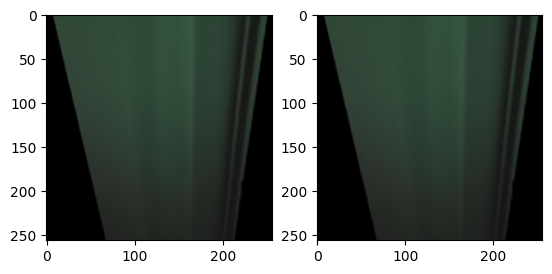

51 [D loss: 2.270231] [D_2 loss: 0.077153] [G loss: 2.294274]
52 [D loss: 0.000234] [D_2 loss: 0.085962] [G loss: 2.071813]
53 [D loss: 0.000007] [D_2 loss: 0.075911] [G loss: 2.116812]
54 [D loss: 0.005912] [D_2 loss: 0.084655] [G loss: 2.108092]
55 [D loss: 3.456531] [D_2 loss: 0.078605] [G loss: 1.888221]
56 [D loss: 0.003162] [D_2 loss: 0.077140] [G loss: 1.671490]
57 [D loss: 3.105574] [D_2 loss: 0.073342] [G loss: 1.902001]
58 [D loss: 0.316052] [D_2 loss: 0.071475] [G loss: 1.893969]
59 [D loss: 0.208853] [D_2 loss: 0.076916] [G loss: 1.707897]
60 [D loss: 0.108032] [D_2 loss: 0.078910] [G loss: 1.905724]


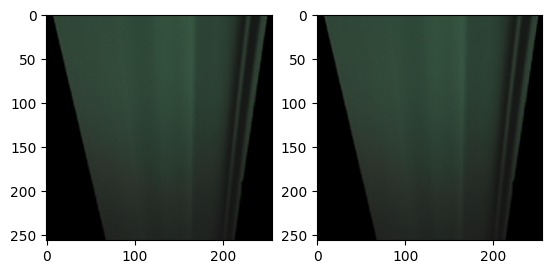

61 [D loss: 0.812224] [D_2 loss: 0.075190] [G loss: 1.735726]
62 [D loss: 0.150320] [D_2 loss: 0.077051] [G loss: 1.710474]
63 [D loss: 0.000368] [D_2 loss: 0.073855] [G loss: 1.720063]
64 [D loss: 0.000052] [D_2 loss: 0.082878] [G loss: 1.816763]
65 [D loss: 2.048136] [D_2 loss: 0.067178] [G loss: 2.159979]
66 [D loss: 17.447010] [D_2 loss: 0.076335] [G loss: 2.459858]
67 [D loss: 0.000130] [D_2 loss: 0.077418] [G loss: 2.116084]
68 [D loss: 0.001077] [D_2 loss: 0.074582] [G loss: 2.625949]
69 [D loss: 0.001081] [D_2 loss: 0.071323] [G loss: 3.222641]
70 [D loss: 0.000428] [D_2 loss: 0.091658] [G loss: 2.261279]


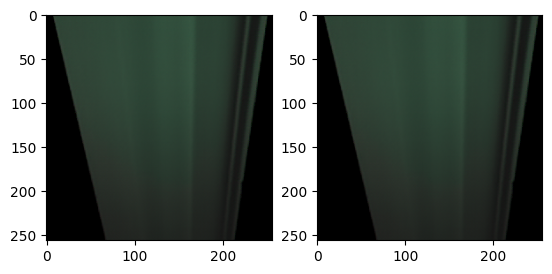

71 [D loss: 1.055250] [D_2 loss: 0.121504] [G loss: 2.594652]
72 [D loss: 0.001309] [D_2 loss: 0.095245] [G loss: 2.356264]
73 [D loss: 0.000057] [D_2 loss: 0.081335] [G loss: 2.559283]
74 [D loss: 2.111105] [D_2 loss: 0.046714] [G loss: 2.180149]
75 [D loss: 0.000001] [D_2 loss: 0.065387] [G loss: 1.834865]
76 [D loss: 4.206050] [D_2 loss: 0.098951] [G loss: 1.629547]
77 [D loss: 1.264664] [D_2 loss: 0.050451] [G loss: 1.708799]
78 [D loss: 0.007430] [D_2 loss: 0.052879] [G loss: 1.603369]
79 [D loss: 8.336555] [D_2 loss: 0.041607] [G loss: 1.672982]
80 [D loss: 0.337185] [D_2 loss: 0.039430] [G loss: 1.776551]


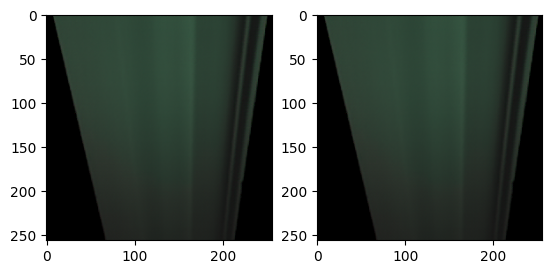

81 [D loss: 5.195123] [D_2 loss: 0.036440] [G loss: 1.609150]
82 [D loss: 0.000016] [D_2 loss: 0.035187] [G loss: 1.646139]
83 [D loss: 0.322736] [D_2 loss: 0.033683] [G loss: 1.635396]
84 [D loss: 0.002060] [D_2 loss: 0.032650] [G loss: 1.809528]
85 [D loss: 16.966564] [D_2 loss: 0.033611] [G loss: 1.640087]
86 [D loss: 13.196190] [D_2 loss: 0.032312] [G loss: 1.663760]
87 [D loss: 17.300034] [D_2 loss: 0.033032] [G loss: 1.643220]
88 [D loss: 2.946810] [D_2 loss: 0.032281] [G loss: 1.615768]
89 [D loss: 0.554222] [D_2 loss: 0.032104] [G loss: 1.665247]
90 [D loss: 0.145529] [D_2 loss: 0.032299] [G loss: 1.715842]


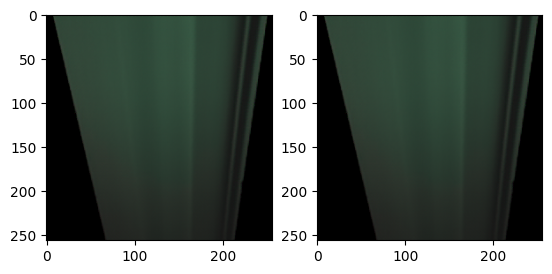

91 [D loss: 22.234940] [D_2 loss: 0.033248] [G loss: 1.643694]
92 [D loss: 0.925793] [D_2 loss: 0.036823] [G loss: 1.632042]
93 [D loss: 2.132813] [D_2 loss: 0.035094] [G loss: 1.655597]
94 [D loss: 6.137593] [D_2 loss: 0.032260] [G loss: 1.691684]
95 [D loss: 2.290632] [D_2 loss: 0.030531] [G loss: 1.709915]
96 [D loss: 1.592842] [D_2 loss: 0.028393] [G loss: 1.969316]
97 [D loss: 0.000008] [D_2 loss: 0.029878] [G loss: 1.803753]
98 [D loss: 27.151585] [D_2 loss: 0.027622] [G loss: 2.056173]
99 [D loss: 7.316377] [D_2 loss: 0.029177] [G loss: 1.615726]
100 [D loss: 0.108110] [D_2 loss: 0.029125] [G loss: 1.817884]


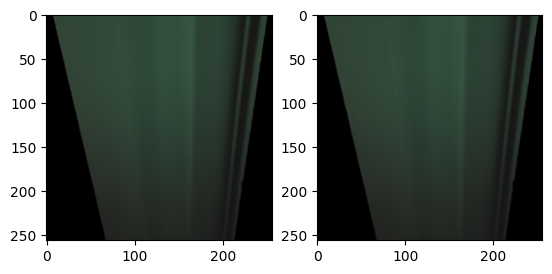

101 [D loss: 15.449778] [D_2 loss: 0.027581] [G loss: 1.538879]
102 [D loss: 0.000194] [D_2 loss: 0.027778] [G loss: 1.528012]
103 [D loss: 0.000000] [D_2 loss: 0.027773] [G loss: 1.688979]
104 [D loss: 0.001301] [D_2 loss: 0.026227] [G loss: 1.676602]
105 [D loss: 0.007772] [D_2 loss: 0.026240] [G loss: 1.627697]
106 [D loss: 18.444813] [D_2 loss: 0.025756] [G loss: 1.706130]
107 [D loss: 9.129355] [D_2 loss: 0.025254] [G loss: 1.777943]
108 [D loss: 0.000001] [D_2 loss: 0.024948] [G loss: 1.828844]
109 [D loss: 0.507308] [D_2 loss: 0.024935] [G loss: 1.708139]
110 [D loss: 2.928819] [D_2 loss: 0.025531] [G loss: 1.734662]


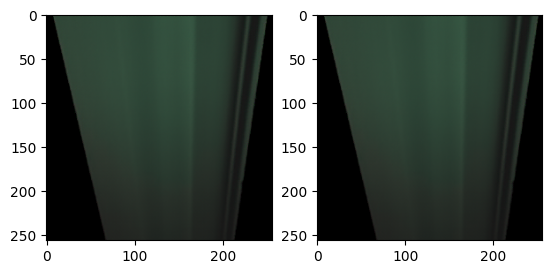

111 [D loss: 0.000684] [D_2 loss: 0.025531] [G loss: 1.733024]
112 [D loss: 0.000000] [D_2 loss: 0.024411] [G loss: 1.785383]
113 [D loss: 0.000000] [D_2 loss: 0.026643] [G loss: 1.687279]
114 [D loss: 7.753292] [D_2 loss: 0.025623] [G loss: 1.901032]
115 [D loss: 9.798547] [D_2 loss: 0.025068] [G loss: 1.920223]
116 [D loss: 0.555950] [D_2 loss: 0.023621] [G loss: 2.264979]
117 [D loss: 9.128757] [D_2 loss: 0.021669] [G loss: 1.869206]
118 [D loss: 0.001907] [D_2 loss: 0.021115] [G loss: 1.766991]
119 [D loss: 0.000025] [D_2 loss: 0.020728] [G loss: 1.635875]
120 [D loss: 2.082487] [D_2 loss: 0.020968] [G loss: 1.634340]


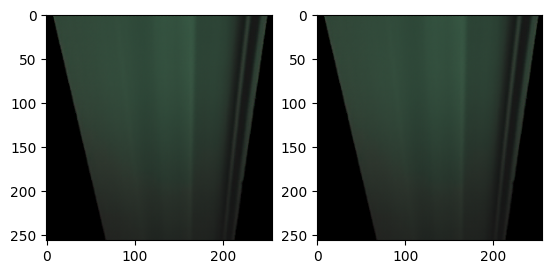

121 [D loss: 0.000002] [D_2 loss: 0.021020] [G loss: 1.653151]
122 [D loss: 0.000002] [D_2 loss: 0.019153] [G loss: 1.537676]
123 [D loss: 0.000219] [D_2 loss: 0.018894] [G loss: 1.648456]
124 [D loss: 6.316965] [D_2 loss: 0.018302] [G loss: 1.807886]
125 [D loss: 13.399241] [D_2 loss: 0.016072] [G loss: 2.371430]
126 [D loss: 0.000001] [D_2 loss: 0.015027] [G loss: 1.632103]
127 [D loss: 0.000023] [D_2 loss: 0.014239] [G loss: 1.719931]
128 [D loss: 0.000015] [D_2 loss: 0.014821] [G loss: 1.978940]
129 [D loss: 0.761140] [D_2 loss: 0.014584] [G loss: 1.781989]
130 [D loss: 0.000000] [D_2 loss: 0.014397] [G loss: 1.743162]


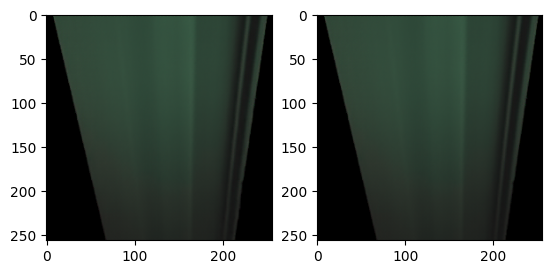

131 [D loss: 3.446110] [D_2 loss: 0.015150] [G loss: 2.547539]
132 [D loss: 9.401422] [D_2 loss: 0.014629] [G loss: 2.394021]
133 [D loss: 19.982588] [D_2 loss: 0.014480] [G loss: 2.266443]
134 [D loss: 0.000107] [D_2 loss: 0.013845] [G loss: 1.639979]
135 [D loss: 0.009581] [D_2 loss: 0.012610] [G loss: 1.921820]
136 [D loss: 4.099583] [D_2 loss: 0.013736] [G loss: 1.734517]
137 [D loss: 0.011653] [D_2 loss: 0.013150] [G loss: 1.738745]
138 [D loss: 0.000000] [D_2 loss: 0.013390] [G loss: 1.948300]
139 [D loss: 0.000000] [D_2 loss: 0.013462] [G loss: 2.033221]
140 [D loss: 0.807524] [D_2 loss: 0.013577] [G loss: 2.069221]


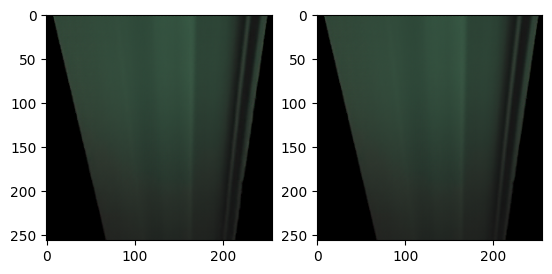

141 [D loss: 3.975321] [D_2 loss: 0.013767] [G loss: 1.528785]
142 [D loss: 6.078493] [D_2 loss: 0.013552] [G loss: 1.640667]
143 [D loss: 0.000000] [D_2 loss: 0.014339] [G loss: 1.655079]
144 [D loss: 0.000012] [D_2 loss: 0.013829] [G loss: 1.798798]
145 [D loss: 1.536830] [D_2 loss: 0.015716] [G loss: 1.896690]
146 [D loss: 0.000209] [D_2 loss: 0.015641] [G loss: 1.813344]
147 [D loss: 1.661258] [D_2 loss: 0.020975] [G loss: 1.791300]
148 [D loss: 3.795780] [D_2 loss: 0.008590] [G loss: 1.945579]
149 [D loss: 0.000000] [D_2 loss: 0.006857] [G loss: 1.716590]
150 [D loss: 0.004274] [D_2 loss: 0.011102] [G loss: 1.975023]


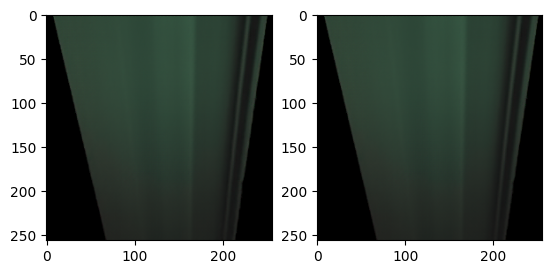

151 [D loss: 18.100910] [D_2 loss: 0.007070] [G loss: 1.823907]
152 [D loss: 10.359518] [D_2 loss: 0.011792] [G loss: 1.884726]
153 [D loss: 0.000000] [D_2 loss: 0.017047] [G loss: 1.852668]
154 [D loss: 6.904175] [D_2 loss: 0.001704] [G loss: 1.788948]
155 [D loss: 0.798842] [D_2 loss: 0.001501] [G loss: 1.635770]
156 [D loss: 0.000407] [D_2 loss: 0.001038] [G loss: 1.762083]
157 [D loss: 8.756013] [D_2 loss: 0.000851] [G loss: 1.610436]
158 [D loss: 0.004607] [D_2 loss: 0.001211] [G loss: 1.543153]
159 [D loss: 0.000000] [D_2 loss: 0.001220] [G loss: 1.586783]
160 [D loss: 0.000000] [D_2 loss: 0.001266] [G loss: 1.594083]


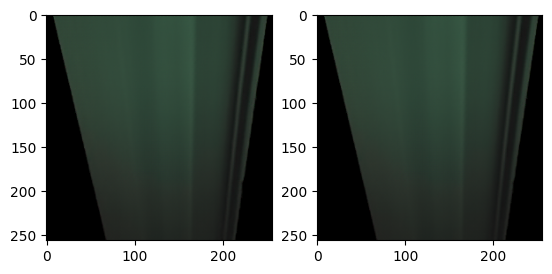

161 [D loss: 29.916063] [D_2 loss: 0.001188] [G loss: 1.643189]
162 [D loss: 8.102676] [D_2 loss: 0.001574] [G loss: 1.825512]
163 [D loss: 0.000001] [D_2 loss: 0.001972] [G loss: 1.767106]
164 [D loss: 0.125034] [D_2 loss: 0.001988] [G loss: 2.063097]
165 [D loss: 0.000000] [D_2 loss: 0.002315] [G loss: 2.067087]
166 [D loss: 0.000004] [D_2 loss: 0.003477] [G loss: 1.822687]
167 [D loss: 0.065108] [D_2 loss: 0.005225] [G loss: 1.801498]
168 [D loss: 0.000000] [D_2 loss: 0.008272] [G loss: 1.770684]
169 [D loss: 8.159925] [D_2 loss: 0.012367] [G loss: 1.738167]
170 [D loss: 0.000003] [D_2 loss: 0.013804] [G loss: 1.737929]


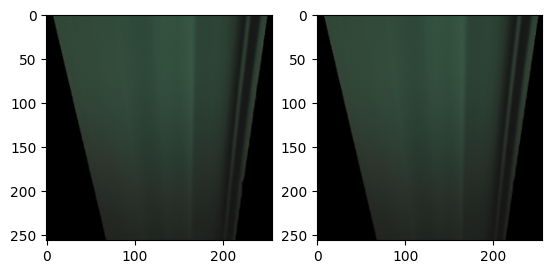

171 [D loss: 0.000000] [D_2 loss: 0.010499] [G loss: 1.849623]
172 [D loss: 0.047248] [D_2 loss: 0.007834] [G loss: 1.962114]
173 [D loss: 17.715498] [D_2 loss: 0.007854] [G loss: 1.442328]
174 [D loss: 0.023400] [D_2 loss: 0.004014] [G loss: 1.454567]
175 [D loss: 0.000079] [D_2 loss: 0.004674] [G loss: 1.472471]
176 [D loss: 2.358082] [D_2 loss: 0.010205] [G loss: 1.689595]
177 [D loss: 1.062581] [D_2 loss: 0.016291] [G loss: 1.412697]
178 [D loss: 0.000027] [D_2 loss: 0.012410] [G loss: 1.541504]
179 [D loss: 2.171589] [D_2 loss: 0.008596] [G loss: 1.670672]
180 [D loss: 0.995402] [D_2 loss: 0.003596] [G loss: 1.505862]


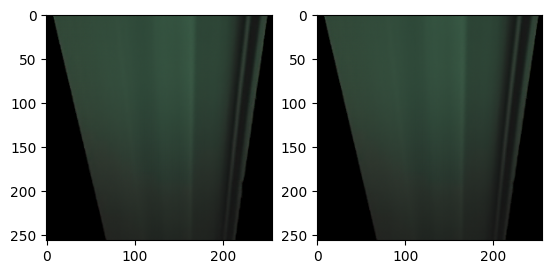

181 [D loss: 0.000051] [D_2 loss: 0.008077] [G loss: 1.641134]
182 [D loss: 0.000004] [D_2 loss: 0.003218] [G loss: 1.508778]
183 [D loss: 0.000024] [D_2 loss: 0.012947] [G loss: 1.558592]
184 [D loss: 0.000000] [D_2 loss: 0.002698] [G loss: 1.757172]
185 [D loss: 0.031034] [D_2 loss: 0.001508] [G loss: 1.524587]
186 [D loss: 0.000007] [D_2 loss: 0.001580] [G loss: 1.509543]
187 [D loss: 10.157806] [D_2 loss: 0.001458] [G loss: 1.559882]
188 [D loss: 1.582211] [D_2 loss: 0.002386] [G loss: 1.686322]
189 [D loss: 0.000002] [D_2 loss: 0.007169] [G loss: 1.537868]
190 [D loss: 0.000041] [D_2 loss: 0.018022] [G loss: 2.092934]


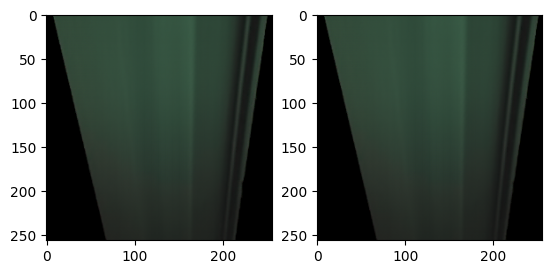

191 [D loss: 24.139713] [D_2 loss: 0.007739] [G loss: 1.688024]
192 [D loss: 0.643964] [D_2 loss: 0.006720] [G loss: 1.517862]
193 [D loss: 0.000001] [D_2 loss: 0.004010] [G loss: 1.561709]
194 [D loss: 3.413850] [D_2 loss: 0.001871] [G loss: 1.430370]
195 [D loss: 1.106143] [D_2 loss: 0.001719] [G loss: 1.411799]
196 [D loss: 0.000000] [D_2 loss: 0.001668] [G loss: 1.433512]
197 [D loss: 0.000000] [D_2 loss: 0.001775] [G loss: 1.560945]
198 [D loss: 0.000000] [D_2 loss: 0.001756] [G loss: 1.544269]
199 [D loss: 16.992348] [D_2 loss: 0.002528] [G loss: 1.490759]
total time =  2184.5146210193634


In [28]:
import time
start_time = time.time()
batch_size =32
for epoch in range(200):
    for i in range(0, len(train_x), batch_size):
        # Get a batch of real images
        discriminator_1.trainable = True
        discriminator_2.trainable = True
        real_imgs = train_x[i:i+batch_size]
        
        # Generate a batch of fake images
        fake_imgs = autoencoder.predict(real_imgs)

        # Train the discriminator
        # Real images - true
        d_loss_real = discriminator_1.train_on_batch(real_imgs, np.ones((real_imgs.shape[0], 1)))
        # Fake images - false
        d_loss_fake = discriminator_1.train_on_batch(fake_imgs, np.zeros((real_imgs.shape[0], 1)))
        d_loss = 0.5 * np.add(d_loss_real, d_loss_fake)
        d2_loss = discriminator_2.train_on_batch(fake_imgs, encoder.predict(real_imgs))
        # Train the generator (through the combined model,
        # for which the discriminator's weights are frozen)
        discriminator_1.trainable = False
        discriminator_2.trainable = False
        g_loss = combined.train_on_batch(real_imgs, [real_imgs, encoder_2.predict(real_imgs), encoder.predict(real_imgs)])

    print ("%d [D loss: %f] [D_2 loss: %f] [G loss: %f]" % (epoch, d_loss, d2_loss, g_loss[0]))
    if epoch % 10 == 0:
        gen_imgs = autoencoder.predict(val_x)  
        fig, axs = plt.subplots(1, 2)
        for i in range(2):
            axs[i].imshow(gen_imgs[i])
            axs[i].axis
        plt.show()
finish = time.time()
print('total time = ', finish-start_time)

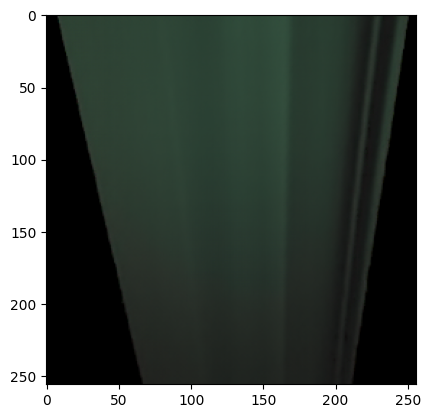

In [29]:
x = autoencoder.predict(bad_dataset)
plt.imshow(x[0])

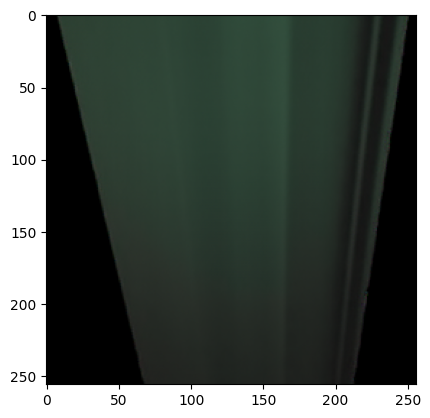

In [25]:
x = autoencoder.predict(bad_dataset)
plt.imshow(x[0])

In [30]:
autoencoder.save('auto28orta2.h5')

In [11]:
autoencoder = keras.models.load_model('auto23.h5')
encoder = keras.models.load_model('en.h5')
discriminator_1 = keras.models.load_model('d1.h5')
discriminator_2 = keras.models.load_model('d2.h5')

In [19]:
input_img = Input(shape=input_shape)
reconstructed_img = autoencoder(input_img)
validity1 = discriminator_1(reconstructed_img)
validity2 = discriminator_2(reconstructed_img) 
combined = Model(input_img, [reconstructed_img, validity1, validity2])
combined.compile(loss=[ 'mse', 'binary_crossentropy', 'mse'], 
                 loss_weights=[50, 1, 1], 
                 optimizer='adam')

In [ ]:

batch_size = 32
for epoch in range(200):
    # Select a random batch of images
    idx = np.random.randint(0, train_x.shape[0], batch_size)
    imgs = train_x[idx]
    discriminator_1.trainable = True
    discriminator_2.trainable = True
    # Generate a batch of new images
    gen_imgs = autoencoder.predict(imgs)
    latent_fake = encoder.predict(gen_imgs)
    latent_real = encoder.predict(imgs)
    d1_loss_real = discriminator_1.train_on_batch(imgs, np.ones((batch_size, 1)))
    d1_loss_fake = discriminator_1.train_on_batch(gen_imgs, np.zeros((batch_size, 1)))
    d1_loss = 0.5 * np.add(d1_loss_real, d1_loss_fake)

    d2_loss = discriminator_2.train_on_batch(gen_imgs, latent_real)
    gl = autoencoder.train_on_batch(train_x,train_x)
    
    if epoch%10 ==0:
        discriminator_1.trainable = False
        discriminator_2.trainable = False
        # Train the generator (The discriminators are not trainable)

        g_loss = combined.train_on_batch(imgs, [imgs, np.ones((batch_size, 1)), latent_real])
#         g_loss = combined.train_on_batch(imgs, [np.ones((batch_size, 1)), latent_real])
#         gl = autoencoder.evaluate(val_x,val_x,verbose = 0)
    # Print the progress
    print ("%d [D1 loss: %f] [D2 loss: %f]  [gloss loss: %f] " % (epoch, d1_loss, d2_loss, gl ))
    if epoch % 5 == 0:
        gen_imgs = autoencoder.predict(val_x)  
        fig, axs = plt.subplots(1, 2)
        for i in range(2):
            axs[i].imshow(gen_imgs[i])
            axs[i].axis
        plt.show()


In [ ]:
x =autoencoder.predict(val_x)
plt.imshow(x[0])

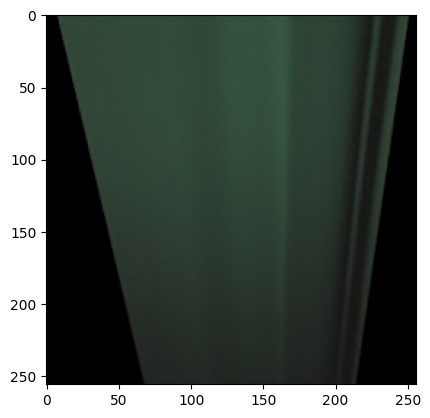

In [37]:
x =autoencoder.predict(val_x)
plt.imshow(x[0])

In [28]:
# Hyperparameters
batch_size = 32
epochs = 100
real_label = 1
fake_label = 0
w_adv = 1.0  # Weight for adversarial loss
w_con = 1.0  # Weight for contextual loss
w_enc = 1.0  # Weight for encoder loss

# Define the optimizer
optimizer = tf.keras.optimizers.Adam()

# Training loop
for epoch in range(epochs):
    for i in range(len(train_x) // batch_size):
        # Select a random batch of images
        idx = np.random.randint(0, train_x.shape[0], batch_size)
        imgs = train_x[idx]

        # Open a GradientTape to record the operations run
        # during the forward pass, which enables auto-differentiation.
        with tf.GradientTape() as tape:
            latent_fake = encoder(imgs, training=True)  # Forward pass
            gen_imgs = decoder(latent_fake, training=True)

            # Compute the loss value for this minibatch.
            # Adversarial loss
            d1_loss_fake = discriminator_1.train_on_batch(gen_imgs, fake)
            d2_loss_fake = discriminator_2.train_on_batch(encoder.predict(gen_imgs), fake)
            g_loss_adv = d1_loss_fake + d2_loss_fake

            # Contextual loss
            g_loss_con = tf.reduce_mean(tf.abs(imgs - gen_imgs))

            # Encoder loss
            g_loss_enc = tf.reduce_mean(tf.square(latent_fake - encoder(gen_imgs, training=True)))

            # Total generator loss
            g_loss = w_adv * g_loss_adv + w_con * g_loss_con + w_enc * g_loss_enc

        # Use the gradient tape to automatically retrieve
        # the gradients of the trainable variables with respect to the loss.
        grads = tape.gradient(g_loss, autoencoder.trainable_weights)

        # Run one step of gradient descent by updating
        # the value of the variables to minimize the loss.
        optimizer.apply_gradients(zip(grads, autoencoder.trainable_weights))

        # Log details
        print ("%d [G loss: %f]" % (epoch, g_loss))
        

NameError: name 'fake' is not defined

In [29]:
d_loss_list = []
d2_loss_list = []
g_loss_list = []

for epoch in range(100):
    for i in range(0, len(train_x), 32):
        real_imgs = train_x[i:i+32]
        fake_imgs = autoencoder.predict(train_x[i:i+32])
        d_loss_real = discriminator_1.train_on_batch(real_imgs, valid[i:i+32])
        d_loss_fake = discriminator_1.train_on_batch(fake_imgs, fake[i:i+32])
        d_loss = 0.5 * np.add(d_loss_real, d_loss_fake)
        d2_loss = discriminator_2.train_on_batch(fake_imgs, encoder.predict(real_imgs))
        g_loss = autoencoder.train_on_batch(real_imgs, real_imgs)
    vall = autoencoder.evaluate(val_x,val_x)
    d_loss_list.append(d_loss)
    d2_loss_list.append(d2_loss)
    g_loss_list.append(g_loss)
    
    print(f'epoch: {epoch+1}, d_loss: {d_loss}, d2_loss: {d2_loss}, g_loss: {g_loss},')
    

2/2 [==============================] - 0s 28ms/step - loss: 0.0248
epoch: 1, d_loss: 1.3557359693550097e-05, d2_loss: 7.288231427082792e-05, g_loss: 0.023430010303854942,
2/2 [==============================] - 0s 26ms/step - loss: 0.0103
epoch: 2, d_loss: 3.5301816274124694e-12, d2_loss: 0.13142305612564087, g_loss: 0.010603219270706177,
2/2 [==============================] - 0s 27ms/step - loss: 0.0033
epoch: 3, d_loss: 0.8839746464509517, d2_loss: 0.10393638908863068, g_loss: 0.0032082954421639442,
2/2 [==============================] - 0s 24ms/step - loss: 0.0013
epoch: 4, d_loss: 0.006038265244569629, d2_loss: 0.043801240622997284, g_loss: 0.001186175039038062,
2/2 [==============================] - 0s 31ms/step - loss: 6.1713e-04
epoch: 5, d_loss: 0.011440158355981112, d2_loss: 0.03967955708503723, g_loss: 0.0005716632585972548,
2/2 [==============================] - 0s 25ms/step - loss: 4.2670e-04
epoch: 6, d_loss: 0.0073366237338632345, d2_loss: 0.04072742164134979, g_loss: 0.00

epoch: 95, d_loss: 0.0017575584934093058, d2_loss: 0.05023447051644325, g_loss: 5.24873539688997e-05,
2/2 [==============================] - 0s 25ms/step - loss: 6.3057e-05
epoch: 96, d_loss: 0.001743491506204009, d2_loss: 0.046342406421899796, g_loss: 5.177366983843967e-05,
2/2 [==============================] - 0s 27ms/step - loss: 5.9477e-05
epoch: 97, d_loss: 0.0017581565771251917, d2_loss: 0.04821163788437843, g_loss: 4.922424705000594e-05,
2/2 [==============================] - 0s 31ms/step - loss: 5.8132e-05
epoch: 98, d_loss: 0.0017251766985282302, d2_loss: 0.04886496812105179, g_loss: 4.906144749838859e-05,
2/2 [==============================] - 0s 46ms/step - loss: 5.7477e-05
epoch: 99, d_loss: 0.001693276921287179, d2_loss: 0.04945771396160126, g_loss: 4.895733218290843e-05,
2/2 [==============================] - 0s 29ms/step - loss: 5.6385e-05
epoch: 100, d_loss: 0.001656344160437584, d2_loss: 0.05081213265657425, g_loss: 4.7784858907107264e-05,


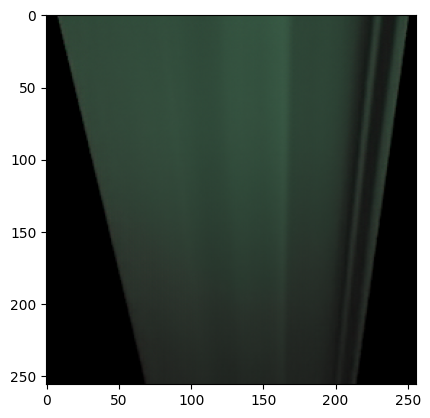

In [30]:
x = (autoencoder.predict(train_x))
plt.imshow(x[0])

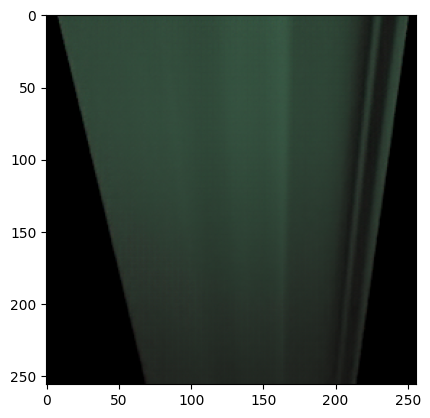

In [39]:
x = (autoencoder.predict(train_x))
plt.imshow(x[0])


In [10]:
SIZE = 256
image_s2 =[]
dataset_s2=[]
image_labels2 = []

image_directory_22  = 'bad/'
bad_images = os.listdir(image_directory_22)
for i, image_name in enumerate(bad_images):
    if (image_name.endswith('png')):
        image_s2 = cv2.imread(image_directory_22 + image_name)
        image_s2 = Image.fromarray(image_s2,'RGB')
        image_s2 = image_s2.resize((SIZE, SIZE))
        dataset_s2.append(np.array(image_s2))
        
bad_dataset = np.array(dataset_s2)
bad_dataset = bad_dataset.astype('float32') / 255.

In [167]:
SIZE = 256
groundt = []
grdt = []
dirr  = 'ground_t/deneme/'
ground = os.listdir(dirr)
for i in (ground):
    if i.endswith('jpg'):
        gr = Image.open(dirr + i)
        gr = gr.resize((SIZE, SIZE))
        grdt.append(np.array(gr))
gr = np.array(grdt) 



In [39]:
SIZE = 256
groundt = []
grdt = []
dirr  = 'sentetik/'
ground = os.listdir(dirr)
for i in (ground):
    if i.endswith('jpg'):
        gr = Image.open(dirr + i)
        gr = gr.resize((SIZE, SIZE))
        grdt.append(np.array(gr))
gr = np.array(grdt)
gr = gr.astype('float32') / 255.

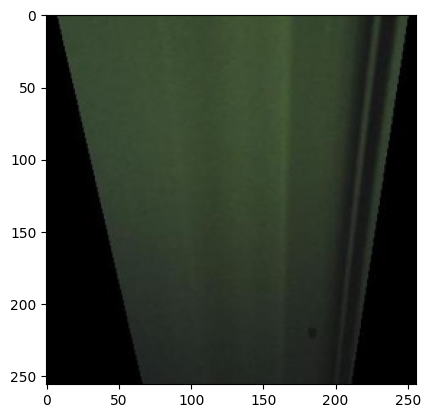

In [20]:
plt.imshow(gr[2])

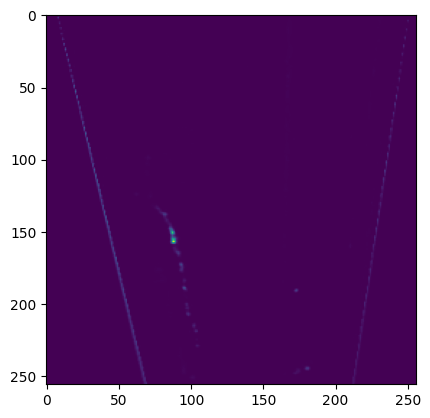

In [83]:
plt.imshow(anomaly_map[6])

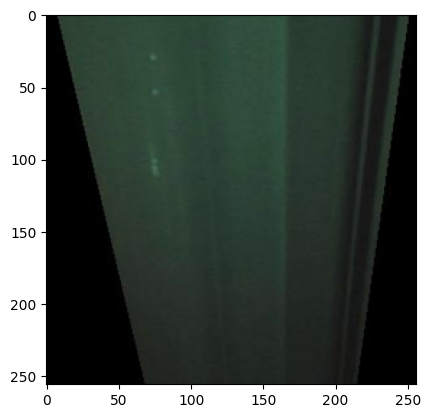

In [30]:
plt.imshow(ground[2]*255)

In [34]:
train_x.shape

(550, 256, 256, 3)

In [21]:
valid = np.ones((train_x.shape[0], 1))
fake = np.zeros((train_x.shape[0], 1))

In [22]:
autoencoder.save('autoencoder_624.h5')

In [5]:
import numpy as np
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.layers import Input, Conv2D, Conv2DTranspose, Flatten, Dense, Reshape

# Model hyperparameters
latent_dim = 128
input_shape = (256, 256, 3)

# Define the models
def build_encoder():
    model = keras.Sequential()
    model.add(Conv2D(16, kernel_size=3, strides=2, input_shape=input_shape, padding="same", activation='relu'))
    model.add(Conv2D(32, kernel_size=3, strides=2, padding="same", activation='relu'))
    model.add(Conv2D(64, kernel_size=3, strides=2, padding="same", activation='relu'))
    model.add(Conv2D(128, kernel_size=3, strides=2, padding="same", activation='relu'))
    model.add(Flatten())
    model.add(Dense(latent_dim, activation='relu'))
    return model

def build_decoder():
    model = keras.Sequential()
    model.add(Dense(16 * 16 * 128, activation='relu', input_shape=(latent_dim,)))
    model.add(Reshape((16, 16, 128)))
    model.add(Conv2DTranspose(64, kernel_size=3, strides=2, padding="same", activation='relu'))
    model.add(Conv2DTranspose(32, kernel_size=3, strides=2, padding="same", activation='relu'))
    model.add(Conv2DTranspose(16, kernel_size=3, strides=2, padding="same", activation='relu'))
    model.add(Conv2DTranspose(3, kernel_size=3, strides=2, padding="same", activation='relu'))
    return model

def build_discriminator_1():
    model = keras.Sequential()
    model.add(Conv2D(16, kernel_size=3, strides=2, input_shape=input_shape, padding="same", activation='relu'))
    model.add(Conv2D(32, kernel_size=3, strides=2, padding="same", activation='relu'))
    model.add(Conv2D(64, kernel_size=3, strides=2, padding="same", activation='relu'))
    model.add(Conv2D(128, kernel_size=3, strides=2, padding="same", activation='relu'))
    model.add(Flatten())
    model.add(Dense(latent_dim, activation='relu'))
    model.add(Dense(1, activation='sigmoid'))
    return model

def build_discriminator_2():
    model = keras.Sequential()
    model.add(Conv2D(16, kernel_size=3, strides=2, input_shape=input_shape, padding="same", activation='relu'))
    model.add(Conv2D(32, kernel_size=3, strides=2, padding="same", activation='relu'))
    model.add(Conv2D(64, kernel_size=3, strides=2, padding="same", activation='relu'))
    model.add(Conv2D(128, kernel_size=3, strides=2, padding="same", activation='relu'))
    model.add(Flatten())
    model.add(Dense(latent_dim, activation='relu'))
    model.add(Dense(1, activation='sigmoid'))
    return model

# Build the models
encoder = build_encoder()
decoder = build_decoder()
autoencoder = keras.Sequential([encoder, decoder])
discriminator_1 = build_discriminator_1()
discriminator_2 = build_discriminator_2()

# Define the loss functions
d_loss_fn = keras.losses.BinaryCrossentropy()
d2_loss_fn = keras.losses.MeanSquaredError()
g_loss_fn = keras.losses.MeanSquaredError()

# Define the optimizers
d_optimizer = keras.optimizers.Adam()
d2_optimizer = keras.optimizers.Adam()
g_optimizer = keras.optimizers.Adam()

@tf.function
def train_step(real_images):
    batch_size = real_images.shape[0]  # Get the actual batch size
    valid = np.ones((batch_size, 1))
    fake = np.zeros((batch_size, 1))
    with tf.GradientTape(persistent=True) as tape:
        # Encode and decode the real images
        encoded_imgs = encoder(real_images, training=True)
        decoded_imgs = decoder(encoded_imgs, training=True)
        
        # Generate fake images
        fake_imgs = autoencoder(real_images, training=True)
        
        # Compute the discriminator losses
        d_loss_real = d_loss_fn(valid, discriminator_1(real_images, training=True))
        d_loss_fake = d_loss_fn(fake, discriminator_1(fake_imgs, training=True))
        d_loss = 0.5 * (d_loss_real + d_loss_fake)
        
        # Compute the discriminator 2 loss
        d2_loss = d2_loss_fn(valid, discriminator_2(fake_imgs, training=True))
        
        # Compute the generator loss
        g_loss = g_loss_fn(real_images, decoded_imgs)
        
    # Compute the gradients
    d_grads = tape.gradient(d_loss, discriminator_1.trainable_variables)
    d2_grads = tape.gradient(d2_loss, discriminator_2.trainable_variables)
    g_grads = tape.gradient(g_loss, autoencoder.trainable_variables)
    
    # Update the weights of the discriminators
    d_optimizer.apply_gradients(zip(d_grads, discriminator_1.trainable_variables))
    d2_optimizer.apply_gradients(zip(d2_grads, discriminator_2.trainable_variables))
    
    # Update the weights of the autoencoder
    g_optimizer.apply_gradients(zip(g_grads, autoencoder.trainable_variables))
#     val_loss = (val_x, autoencoder(val_x, training = False))
    
    return d_loss, d2_loss, g_loss

# Training loop
num_epochs = 600
batch_size = 32

d_loss_list = []
d2_loss_list = []
g_loss_list = []
val_loss_list = []
for epoch in range(num_epochs):
    for i in range(0, len(train_x), batch_size):
        real_imgs = train_x[i:i+batch_size]
        d_loss, d2_loss, g_loss= train_step(real_imgs)
        
        d_loss_list.append(d_loss)
        d2_loss_list.append(d2_loss)
        g_loss_list.append(g_loss)
#         val_loss_list.append(val_loss)
    print(f"Epoch {epoch+1}/{num_epochs}, d_loss: {np.mean(d_loss_list)}, d2_loss: {np.mean(d2_loss_list)}, g_loss: {np.mean(g_loss_list)}")


Epoch 1/600, d_loss: 0.2362036257982254, d2_loss: 0.06252742558717728, g_loss: 0.028334034606814384
Epoch 2/600, d_loss: 0.22930552065372467, d2_loss: 0.03126371279358864, g_loss: 0.022912105545401573
Epoch 3/600, d_loss: 0.15507785975933075, d2_loss: 0.020842473953962326, g_loss: 0.018123837187886238
Epoch 4/600, d_loss: 0.3822031319141388, d2_loss: 0.01563185639679432, g_loss: 0.01429741457104683
Epoch 5/600, d_loss: 0.3312723636627197, d2_loss: 0.012505484744906425, g_loss: 0.011684119701385498
Epoch 6/600, d_loss: 0.31916502118110657, d2_loss: 0.010421236976981163, g_loss: 0.009843975305557251
Epoch 7/600, d_loss: 0.28299370408058167, d2_loss: 0.008932488970458508, g_loss: 0.008503202348947525
Epoch 8/600, d_loss: 0.24918676912784576, d2_loss: 0.00781592819839716, g_loss: 0.007486610673367977
Epoch 9/600, d_loss: 0.22223268449306488, d2_loss: 0.006947491317987442, g_loss: 0.006689828354865313
Epoch 10/600, d_loss: 0.20029231905937195, d2_loss: 0.006252742372453213, g_loss: 0.006048

Epoch 80/600, d_loss: 0.07630210369825363, d2_loss: 0.0007815927965566516, g_loss: 0.0008804528042674065
Epoch 81/600, d_loss: 0.07536014169454575, d2_loss: 0.0007719434797763824, g_loss: 0.0008704913780093193
Epoch 82/600, d_loss: 0.07444116473197937, d2_loss: 0.0007625295547768474, g_loss: 0.0008607703493908048
Epoch 83/600, d_loss: 0.07354430854320526, d2_loss: 0.0007533424068242311, g_loss: 0.0008512696949765086
Epoch 84/600, d_loss: 0.07266881316900253, d2_loss: 0.0007443740614689887, g_loss: 0.0008419795776717365
Epoch 85/600, d_loss: 0.07181389629840851, d2_loss: 0.0007356167188845575, g_loss: 0.0008329310803674161
Epoch 86/600, d_loss: 0.07097887992858887, d2_loss: 0.0007270630449056625, g_loss: 0.0008240516763180494
Epoch 87/600, d_loss: 0.0701630488038063, d2_loss: 0.0007187059964053333, g_loss: 0.0008153899107128382
Epoch 88/600, d_loss: 0.06936575472354889, d2_loss: 0.0007105388795025647, g_loss: 0.0008069132454693317
Epoch 89/600, d_loss: 0.06858637928962708, d2_loss: 0.00

Epoch 158/600, d_loss: 0.03863441199064255, d2_loss: 0.0003957431763410568, g_loss: 0.00047288648784160614
Epoch 159/600, d_loss: 0.03839142993092537, d2_loss: 0.00039325421676039696, g_loss: 0.00047019822522997856
Epoch 160/600, d_loss: 0.03815148398280144, d2_loss: 0.0003907963982783258, g_loss: 0.00046752806520089507
Epoch 161/600, d_loss: 0.037914521992206573, d2_loss: 0.0003883690806105733, g_loss: 0.00046489154919981956
Epoch 162/600, d_loss: 0.037680480629205704, d2_loss: 0.0003859717398881912, g_loss: 0.00046229749568738043
Epoch 163/600, d_loss: 0.03744931519031525, d2_loss: 0.0003836038231384009, g_loss: 0.0004597259685397148
Epoch 164/600, d_loss: 0.037220969796180725, d2_loss: 0.0003812647773884237, g_loss: 0.0004571825556922704
Epoch 165/600, d_loss: 0.03699538856744766, d2_loss: 0.0003789540787693113, g_loss: 0.00045466620940715075
Epoch 166/600, d_loss: 0.03677252680063248, d2_loss: 0.0003766712034121156, g_loss: 0.00045217893784865737
Epoch 167/600, d_loss: 0.0365523360

Epoch 235/600, d_loss: 0.02597552165389061, d2_loss: 0.0002660741447471082, g_loss: 0.0003317080554552376
Epoch 236/600, d_loss: 0.025865457952022552, d2_loss: 0.0002649466914590448, g_loss: 0.0003304598794784397
Epoch 237/600, d_loss: 0.025756319984793663, d2_loss: 0.0002638287842273712, g_loss: 0.00032922159880399704
Epoch 238/600, d_loss: 0.025648098438978195, d2_loss: 0.0002627202484291047, g_loss: 0.000327992660459131
Epoch 239/600, d_loss: 0.0255407877266407, d2_loss: 0.0002616210258565843, g_loss: 0.000326774112181738
Epoch 240/600, d_loss: 0.02543436735868454, d2_loss: 0.0002605309127829969, g_loss: 0.00032556470250710845
Epoch 241/600, d_loss: 0.025328829884529114, d2_loss: 0.000259449880104512, g_loss: 0.0003243650426156819
Epoch 242/600, d_loss: 0.025224167853593826, d2_loss: 0.0002583777823019773, g_loss: 0.00032317492878064513
Epoch 243/600, d_loss: 0.025120362639427185, d2_loss: 0.00025731450296007097, g_loss: 0.00032199450652115047
Epoch 244/600, d_loss: 0.02501741051673

Epoch 312/600, d_loss: 0.019564906135201454, d2_loss: 0.00020040840900037438, g_loss: 0.0002591517404653132
Epoch 313/600, d_loss: 0.019502397626638412, d2_loss: 0.00019976812473032624, g_loss: 0.00025843409821391106
Epoch 314/600, d_loss: 0.019440287724137306, d2_loss: 0.00019913191499654204, g_loss: 0.00025772294611670077
Epoch 315/600, d_loss: 0.019378572702407837, d2_loss: 0.00019849975069519132, g_loss: 0.0002570180222392082
Epoch 316/600, d_loss: 0.019317252561450005, d2_loss: 0.0001978715881705284, g_loss: 0.0002563142916187644
Epoch 317/600, d_loss: 0.019256314262747765, d2_loss: 0.00019724738376680762, g_loss: 0.0002556166728027165
Epoch 318/600, d_loss: 0.019195757806301117, d2_loss: 0.00019662710838019848, g_loss: 0.0002549312775954604
Epoch 319/600, d_loss: 0.01913558319211006, d2_loss: 0.00019601073290687054, g_loss: 0.00025424844352528453
Epoch 320/600, d_loss: 0.01907578483223915, d2_loss: 0.0001953981991391629, g_loss: 0.0002535607200115919
Epoch 321/600, d_loss: 0.0190

Epoch 388/600, d_loss: 0.01573261059820652, d2_loss: 0.00016115314792841673, g_loss: 0.00021516946435440332
Epoch 389/600, d_loss: 0.01569216698408127, d2_loss: 0.00016073886945378035, g_loss: 0.00021470301726367325
Epoch 390/600, d_loss: 0.01565193198621273, d2_loss: 0.00016032673011068255, g_loss: 0.00021424096485134214
Epoch 391/600, d_loss: 0.015611899085342884, d2_loss: 0.00015991668624337763, g_loss: 0.00021377764642238617
Epoch 392/600, d_loss: 0.015572072938084602, d2_loss: 0.00015950872329995036, g_loss: 0.00021331565221771598
Epoch 393/600, d_loss: 0.015532447956502438, d2_loss: 0.00015910285583231598, g_loss: 0.00021285917318891734
Epoch 394/600, d_loss: 0.015493026003241539, d2_loss: 0.0001586990401847288, g_loss: 0.00021240416390355676
Epoch 395/600, d_loss: 0.015453802421689034, d2_loss: 0.00015829727635718882, g_loss: 0.0002119480341207236
Epoch 396/600, d_loss: 0.015414778143167496, d2_loss: 0.00015789753524586558, g_loss: 0.00021149545500520617
Epoch 397/600, d_loss: 0

Epoch 464/600, d_loss: 0.013155718334019184, d2_loss: 0.00013475737068802118, g_loss: 0.00018525261839386076
Epoch 465/600, d_loss: 0.01312742568552494, d2_loss: 0.00013446756929624826, g_loss: 0.0001849210384534672
Epoch 466/600, d_loss: 0.013099254108965397, d2_loss: 0.00013417901936918497, g_loss: 0.00018459110287949443
Epoch 467/600, d_loss: 0.013071204535663128, d2_loss: 0.00013389169180300087, g_loss: 0.00018426234601065516
Epoch 468/600, d_loss: 0.013043276034295559, d2_loss: 0.00013360560114961118, g_loss: 0.0001839352335082367
Epoch 469/600, d_loss: 0.013015464879572392, d2_loss: 0.00013332073285710067, g_loss: 0.00018360954709351063
Epoch 470/600, d_loss: 0.0129877720028162, d2_loss: 0.0001330370723735541, g_loss: 0.00018328530131839216
Epoch 471/600, d_loss: 0.012960195541381836, d2_loss: 0.00013275460514705628, g_loss: 0.00018296233611181378
Epoch 472/600, d_loss: 0.012932738289237022, d2_loss: 0.0001324733457295224, g_loss: 0.00018264084064867347
Epoch 473/600, d_loss: 0.0

Epoch 540/600, d_loss: 0.011304172687232494, d2_loss: 0.00011579152487684041, g_loss: 0.00016393428086303174
Epoch 541/600, d_loss: 0.011283277533948421, d2_loss: 0.00011557748803170398, g_loss: 0.00016368503565900028
Epoch 542/600, d_loss: 0.011262460611760616, d2_loss: 0.00011536424426594749, g_loss: 0.00016343663446605206
Epoch 543/600, d_loss: 0.011241719126701355, d2_loss: 0.00011515179357957095, g_loss: 0.0001631891936995089
Epoch 544/600, d_loss: 0.011221053078770638, d2_loss: 0.00011494011414470151, g_loss: 0.00016294264059979469
Epoch 545/600, d_loss: 0.011200464330613613, d2_loss: 0.00011472921323729679, g_loss: 0.00016269709158223122
Epoch 546/600, d_loss: 0.011179950088262558, d2_loss: 0.00011451909085735679, g_loss: 0.00016245241567958146
Epoch 547/600, d_loss: 0.011159512214362621, d2_loss: 0.00011430973245296627, g_loss: 0.0001622088602744043
Epoch 548/600, d_loss: 0.01113914791494608, d2_loss: 0.00011410113802412525, g_loss: 0.00016196629439946264
Epoch 549/600, d_loss:

Epoch: 1, d_loss: 0.00010612825280986818, d2_loss: 0.001727339462377131, g_loss: 0.022747458890080452, val_loss: 0.02396211586892605


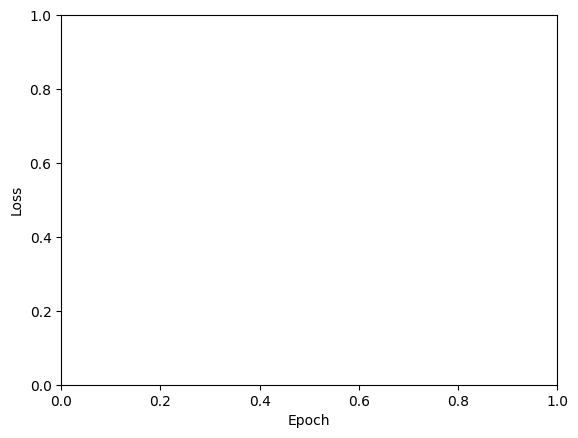

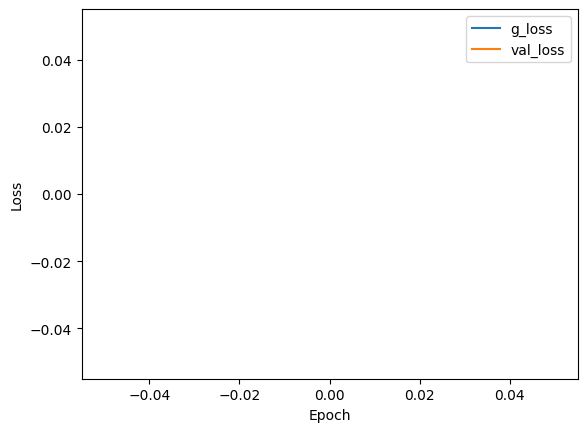

Epoch: 2, d_loss: 3.951345206620219e-07, d2_loss: 0.6148601174354553, g_loss: 0.009548541158437729, val_loss: 0.01002876553684473


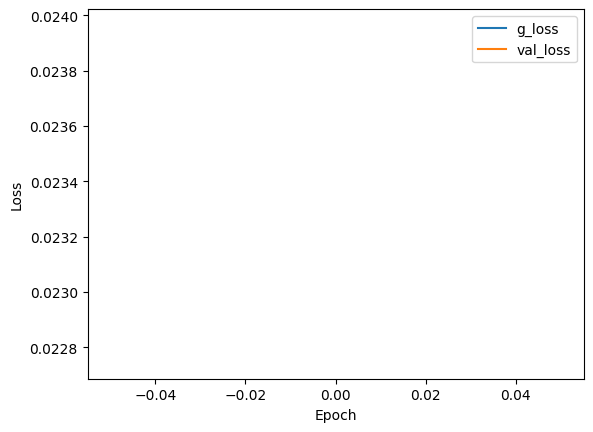

Epoch: 3, d_loss: 0.001102172420360148, d2_loss: 0.7110573649406433, g_loss: 0.0038219818379729986, val_loss: 0.003875303314998746


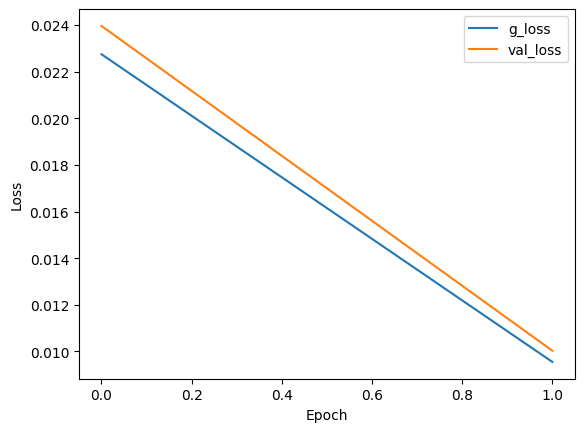

Epoch: 4, d_loss: 0.0009684706456027925, d2_loss: 0.5726999640464783, g_loss: 0.0018058837158605456, val_loss: 0.0017422923119738698


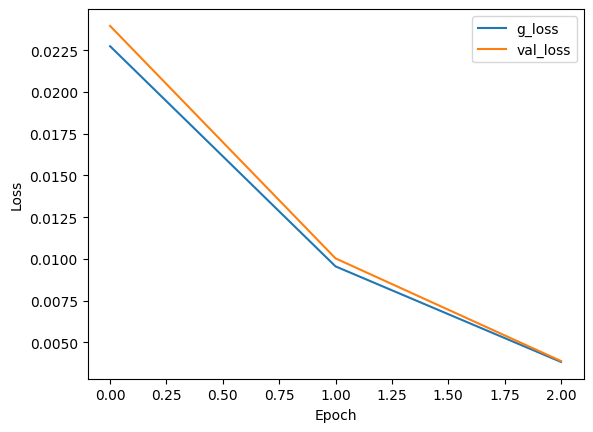

Epoch: 5, d_loss: 1.667832181090489, d2_loss: 0.5527686476707458, g_loss: 0.0007691887440159917, val_loss: 0.000745070050470531


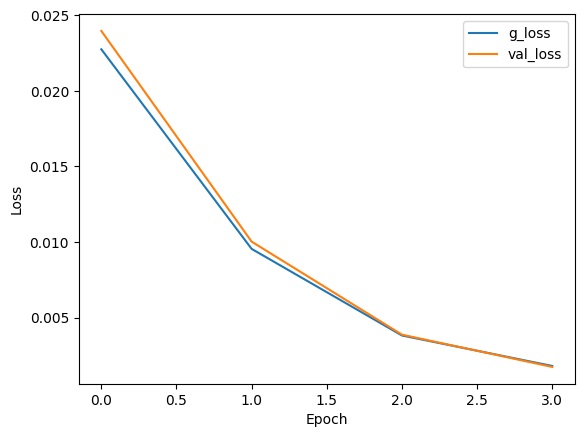

Epoch: 6, d_loss: 0.03730521909892559, d2_loss: 0.5369688272476196, g_loss: 0.0004730714426841587, val_loss: 0.00047404970973730087


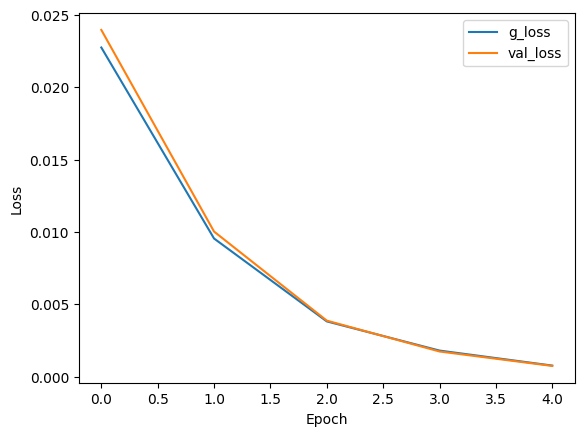

Epoch: 7, d_loss: 0.07603863254189491, d2_loss: 0.5438017845153809, g_loss: 0.0003871190710924566, val_loss: 0.00041410073754377663


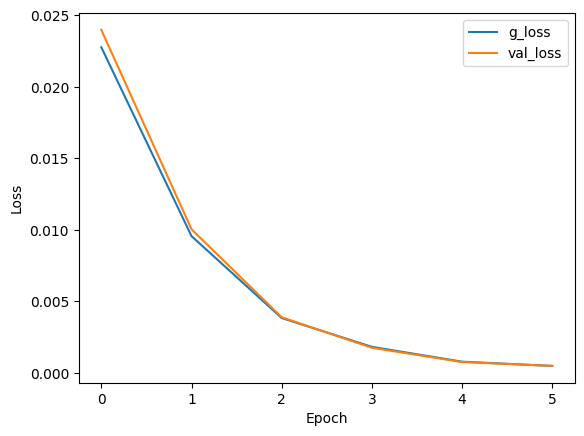

Epoch: 8, d_loss: 0.04247144237160683, d2_loss: 0.5340078473091125, g_loss: 0.00032843436929397285, val_loss: 0.00040600288775749505


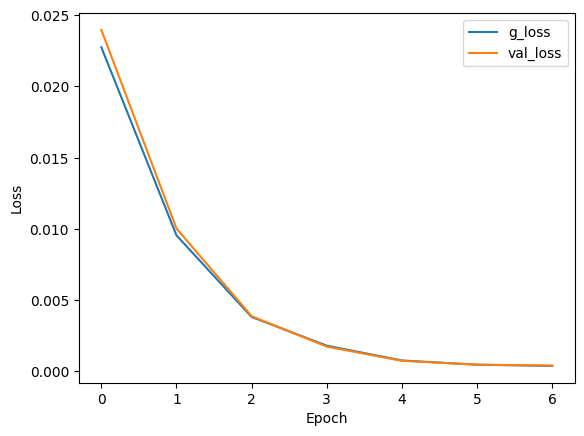

Epoch: 9, d_loss: 0.0007379537564702332, d2_loss: 0.5173479914665222, g_loss: 0.0002860202803276479, val_loss: 0.0003924911725334823


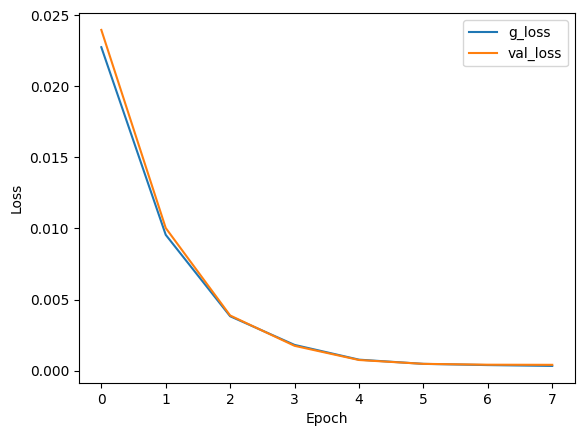

Epoch: 10, d_loss: 0.00016007350131985731, d2_loss: 0.5087611675262451, g_loss: 0.00026164023438468575, val_loss: 0.00035713412216864526


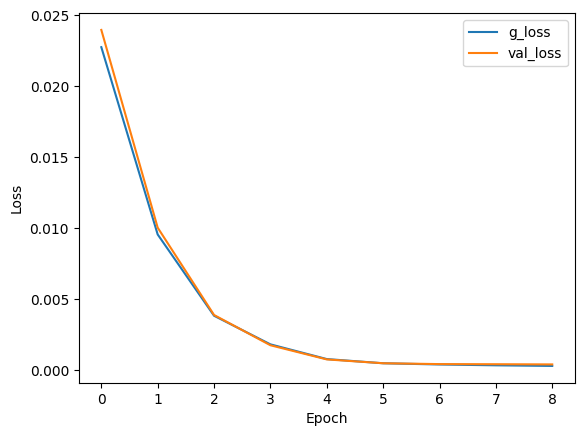

Epoch: 11, d_loss: 8.056316801230423e-05, d2_loss: 0.5126115083694458, g_loss: 0.000244475289946422, val_loss: 0.0003184843808412552


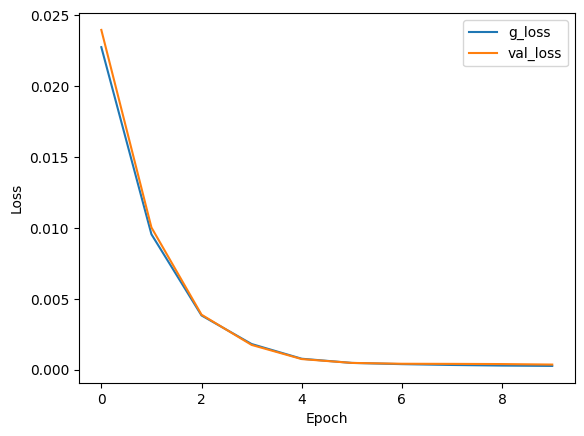

Epoch: 12, d_loss: 4.2704377847258e-05, d2_loss: 0.5220788717269897, g_loss: 0.0002319012419320643, val_loss: 0.0002943002909887582


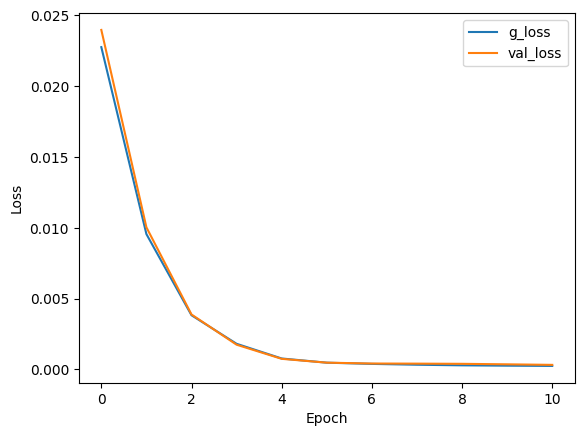

Epoch: 13, d_loss: 2.392035639786627e-05, d2_loss: 0.526890754699707, g_loss: 0.0002199646842200309, val_loss: 0.00028153994935564697


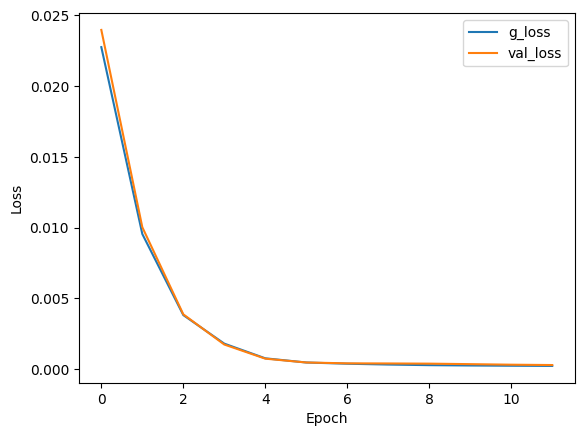

Epoch: 14, d_loss: 1.4778505828871857e-05, d2_loss: 0.5313853025436401, g_loss: 0.00020912814943585545, val_loss: 0.0002692171256057918


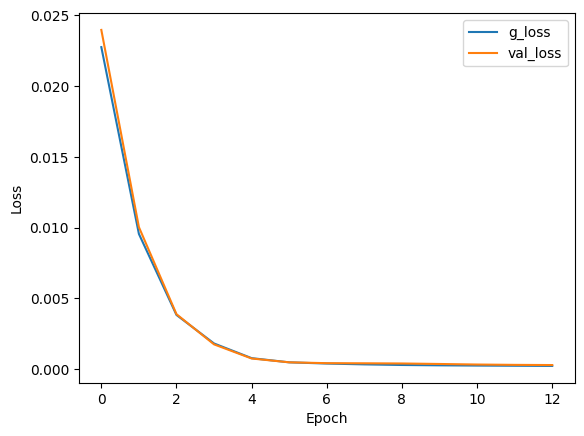

Epoch: 15, d_loss: 1.0640402706485474e-05, d2_loss: 0.5348957180976868, g_loss: 0.00019949408306274563, val_loss: 0.00026343046920374036


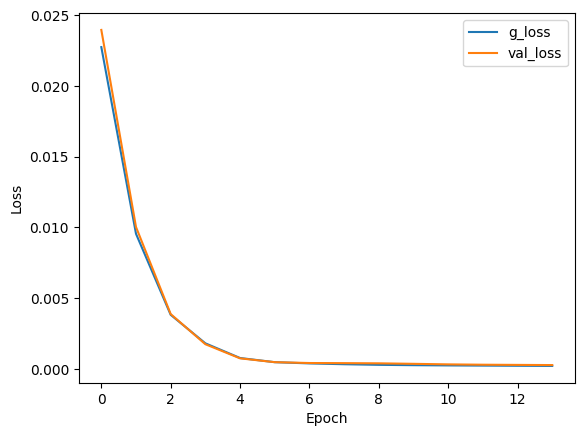

Epoch: 16, d_loss: 7.87249268796586e-06, d2_loss: 0.5355802774429321, g_loss: 0.00019013156997971237, val_loss: 0.00025967590045183897


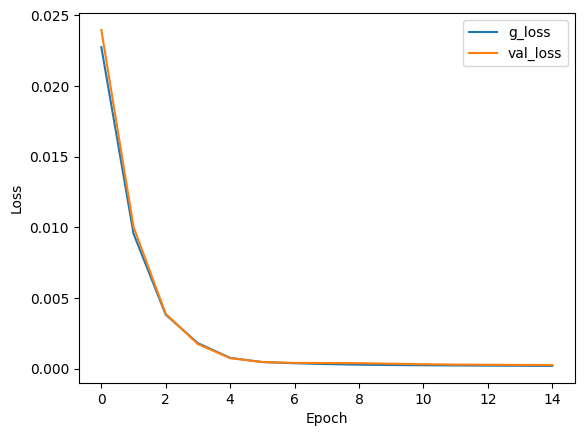

Epoch: 17, d_loss: 6.434300985347363e-06, d2_loss: 0.5323126316070557, g_loss: 0.00018003530567511916, val_loss: 0.00025822644238360226


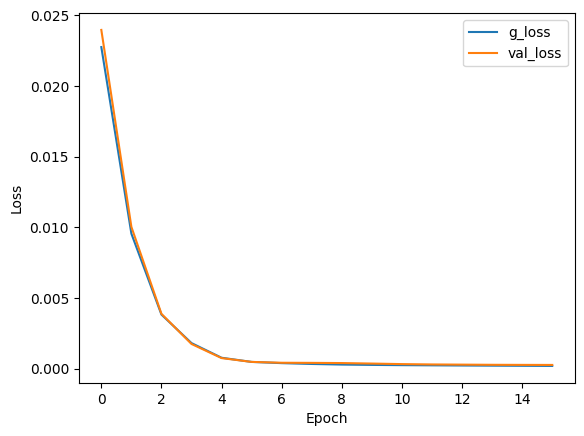

Epoch: 18, d_loss: 5.3119633776077535e-06, d2_loss: 0.5245717763900757, g_loss: 0.0001690354838501662, val_loss: 0.0002592971723061055


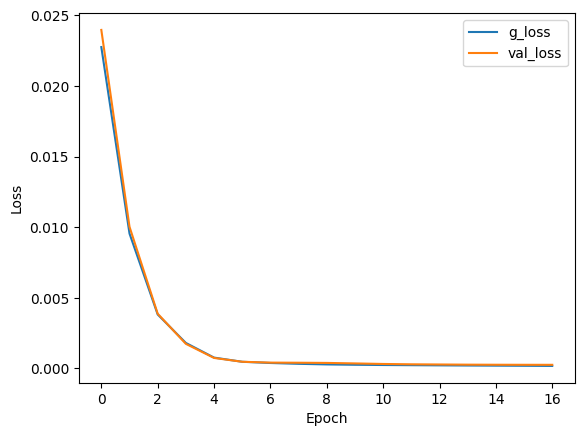

Epoch: 19, d_loss: 4.549130835584947e-06, d2_loss: 0.5142147541046143, g_loss: 0.00015920140140224248, val_loss: 0.00026005200925283134


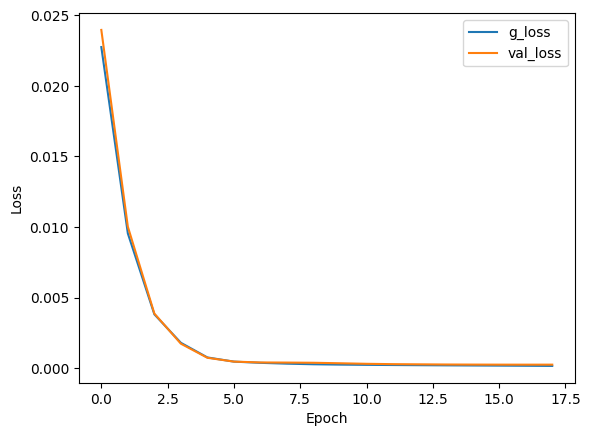

Epoch: 20, d_loss: 3.9219719383254414e-06, d2_loss: 0.5029281377792358, g_loss: 0.0001513002789579332, val_loss: 0.0002581706503406167


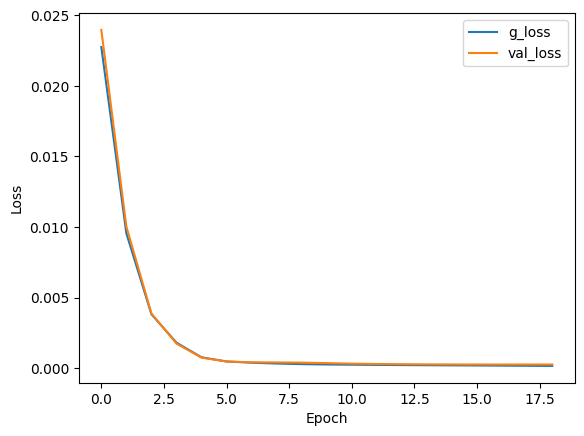

Epoch: 21, d_loss: 3.3611916023801314e-06, d2_loss: 0.4928286075592041, g_loss: 0.00014519454271066934, val_loss: 0.00025320975692011416


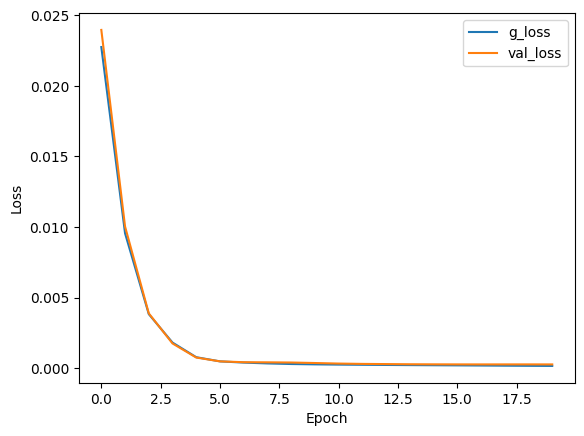

Epoch: 22, d_loss: 2.8369820483931107e-06, d2_loss: 0.4834935963153839, g_loss: 0.00013979105278849602, val_loss: 0.00024666174431331456


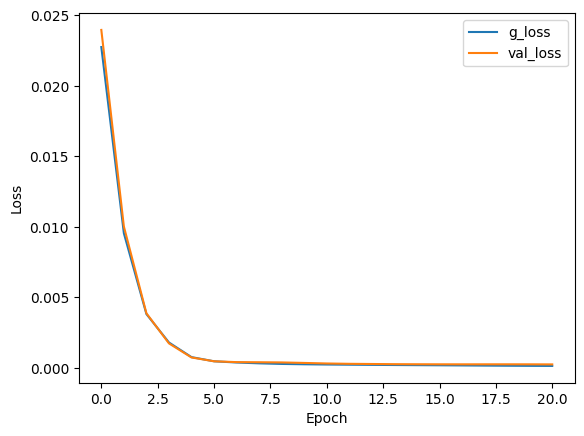

Epoch: 23, d_loss: 2.2239477175389766e-06, d2_loss: 0.47286105155944824, g_loss: 0.0001341870374744758, val_loss: 0.00023956125369295478


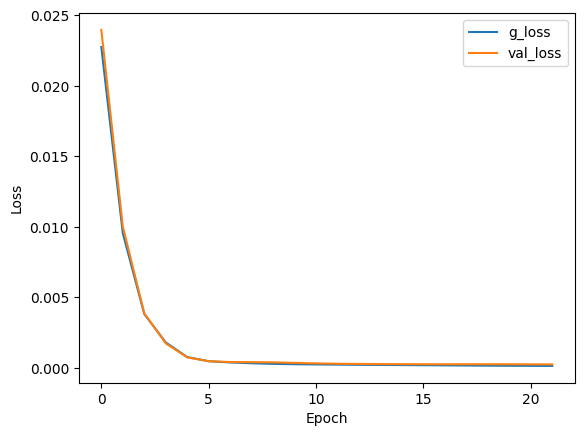

Epoch: 24, d_loss: 1.7413786963516031e-06, d2_loss: 0.46170711517333984, g_loss: 0.0001284888421650976, val_loss: 0.0002344971289858222


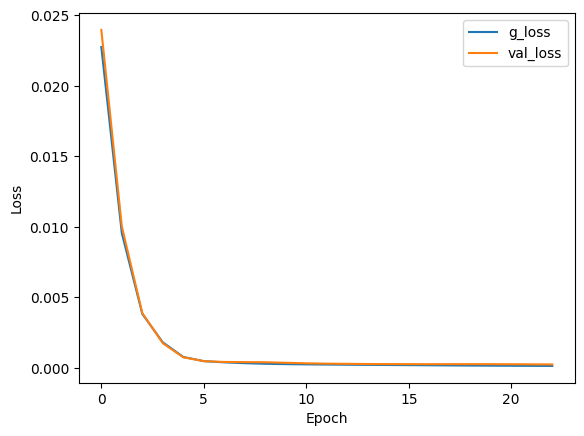

Epoch: 25, d_loss: 2.124505499523366e-06, d2_loss: 0.45013728737831116, g_loss: 0.00012353358033578843, val_loss: 0.00022972961596678942


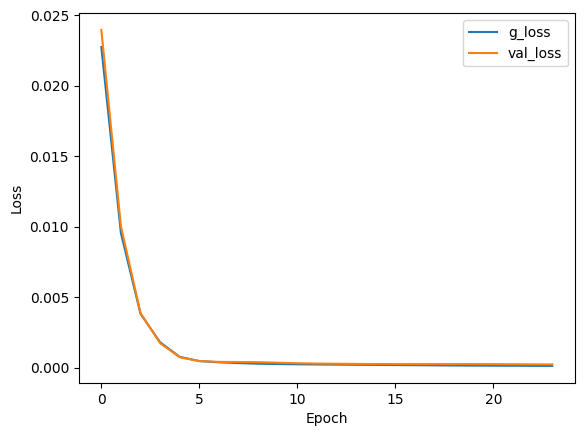

Epoch: 26, d_loss: 1.0783684274429106e-06, d2_loss: 0.43868428468704224, g_loss: 0.00011897229705937207, val_loss: 0.00022450457618106157


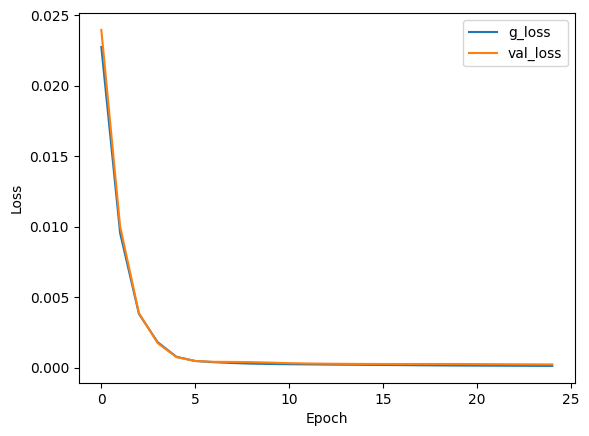

Epoch: 27, d_loss: 3.637629930608455e-07, d2_loss: 0.4272705316543579, g_loss: 0.0001149564195657149, val_loss: 0.0002196929563069716


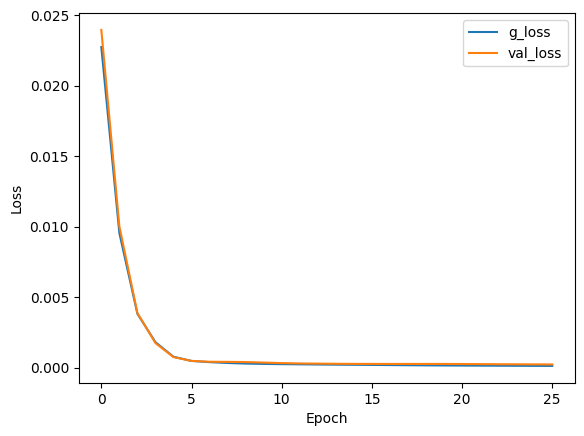

Epoch: 28, d_loss: 0.7149472534656525, d2_loss: 0.41646522283554077, g_loss: 0.00011137838009744883, val_loss: 0.00021565210772678256


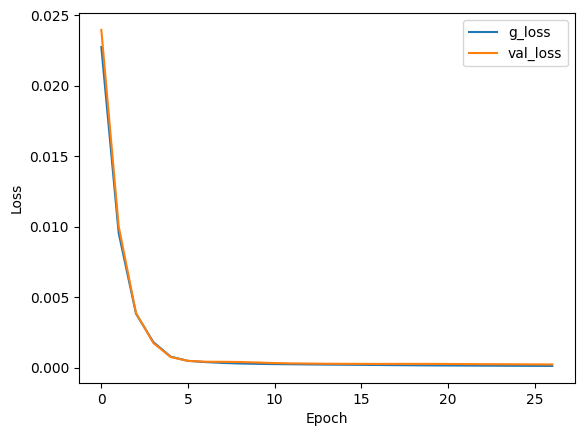

Epoch: 29, d_loss: 0.6944208741188049, d2_loss: 0.4059469699859619, g_loss: 0.00010819088493008167, val_loss: 0.00021134130656719208


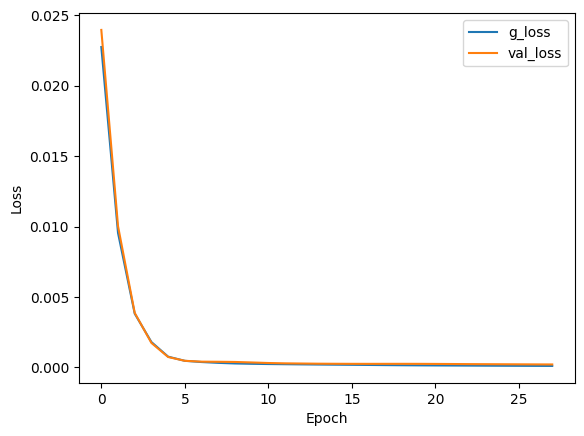

Epoch: 30, d_loss: 0.6934037208557129, d2_loss: 0.3958622217178345, g_loss: 0.0001052031948347576, val_loss: 0.00020621764997486025


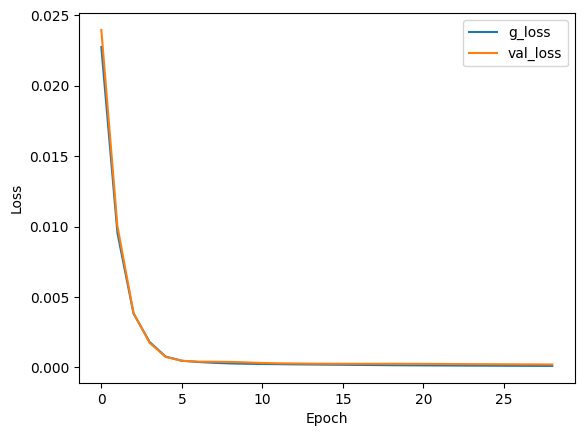

Epoch: 31, d_loss: 0.6930982768535614, d2_loss: 0.3857182562351227, g_loss: 0.00010231816122541204, val_loss: 0.0002020733809331432


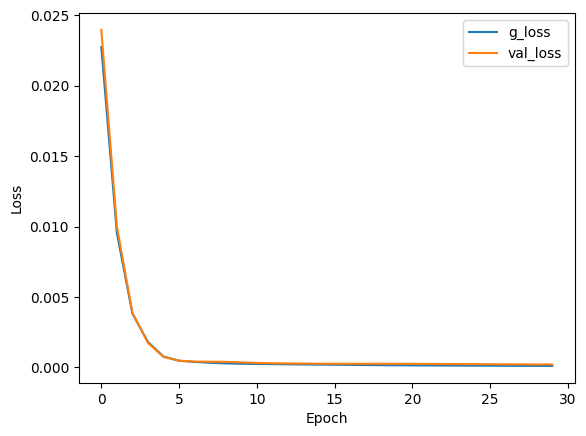

Epoch: 32, d_loss: 0.6923152506351471, d2_loss: 0.37530407309532166, g_loss: 9.962239710148424e-05, val_loss: 0.00019858773157466203


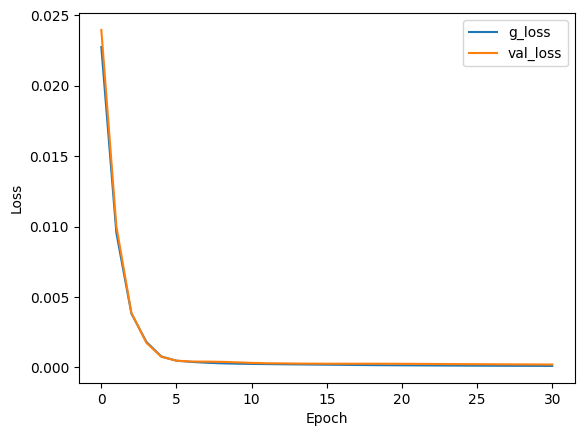

Epoch: 33, d_loss: 0.6909157335758209, d2_loss: 0.3646773099899292, g_loss: 9.728746226755902e-05, val_loss: 0.00019501220958773047


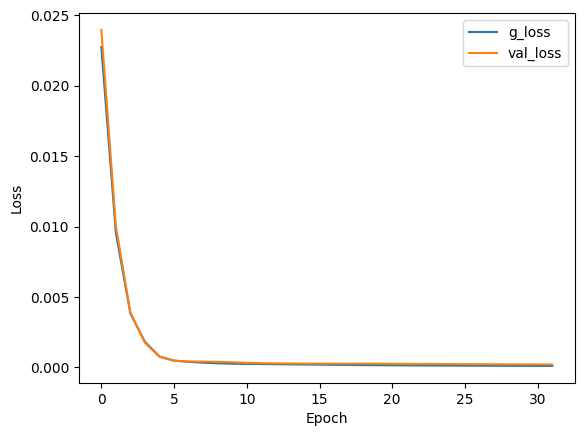

Epoch: 34, d_loss: 0.6863363981246948, d2_loss: 0.3547061085700989, g_loss: 9.535407298244536e-05, val_loss: 0.00018910731887444854


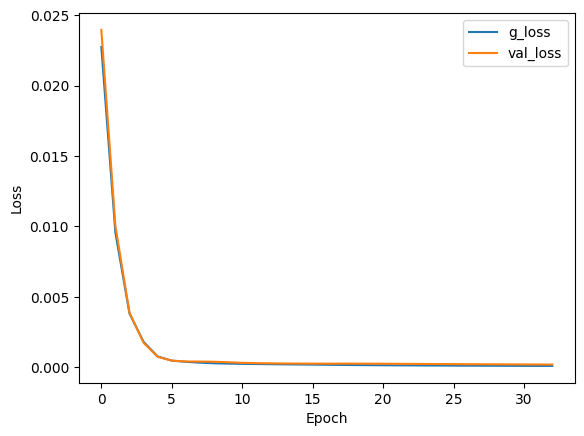

Epoch: 35, d_loss: 0.6775498986244202, d2_loss: 0.3462197780609131, g_loss: 9.350596519652754e-05, val_loss: 0.00018509890651330352


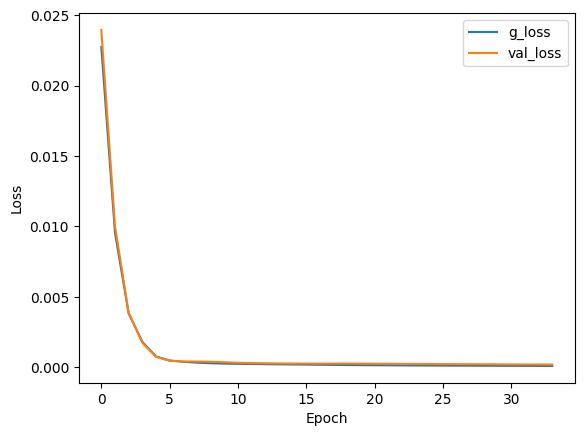

Epoch: 36, d_loss: 0.5791999399662018, d2_loss: 0.3376815617084503, g_loss: 9.186756506096572e-05, val_loss: 0.00018092583923134953


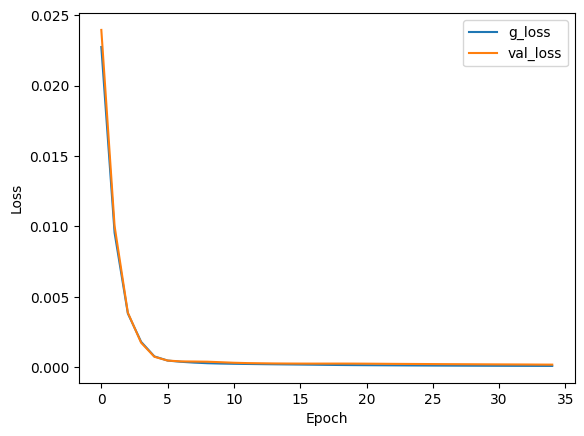

Epoch: 37, d_loss: 0.39565931260585785, d2_loss: 0.3289374113082886, g_loss: 9.051820234162733e-05, val_loss: 0.0001761658932082355


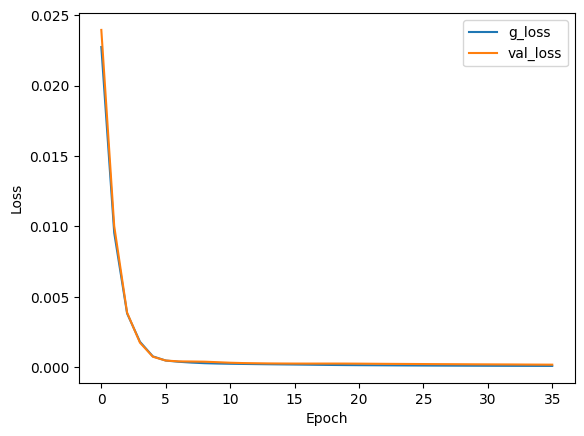

Epoch: 38, d_loss: 0.34810397028923035, d2_loss: 0.32088905572891235, g_loss: 8.93337419256568e-05, val_loss: 0.00017054873751476407


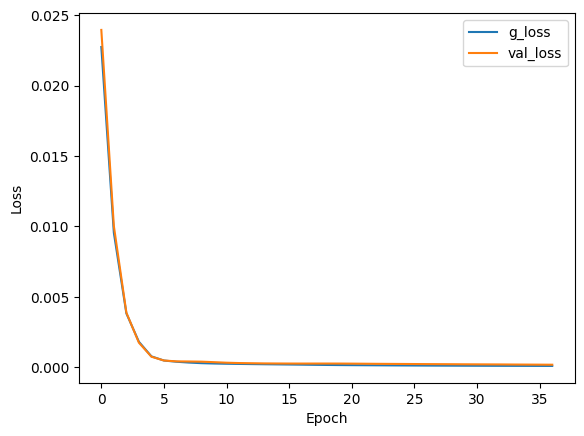

Epoch: 39, d_loss: 0.3306722429115325, d2_loss: 0.3132728338241577, g_loss: 8.836667984724045e-05, val_loss: 0.00016468745889142156


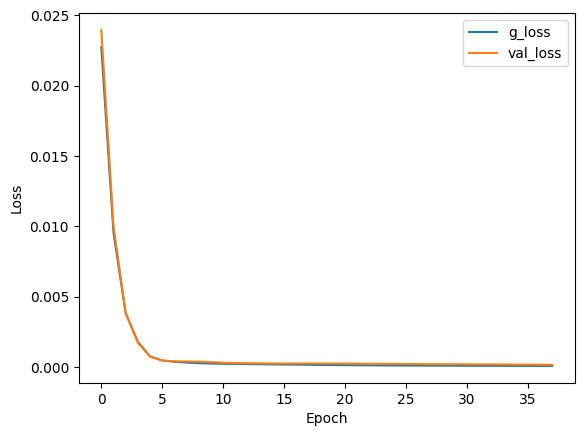

Epoch: 40, d_loss: 0.3238817715027835, d2_loss: 0.30629509687423706, g_loss: 8.742071804590523e-05, val_loss: 0.0001581194665050134


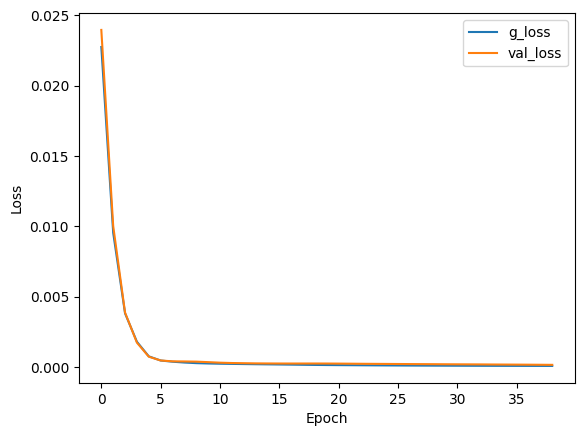

Epoch: 41, d_loss: 0.3183545632055029, d2_loss: 0.29978814721107483, g_loss: 8.631415403215215e-05, val_loss: 0.0001507216802565381


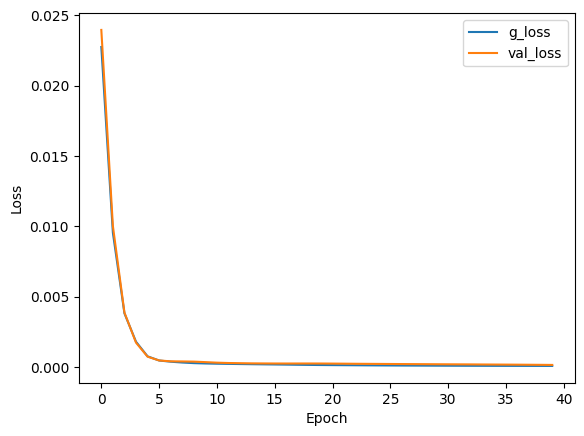

Epoch: 42, d_loss: 0.3131493559485534, d2_loss: 0.29482632875442505, g_loss: 8.458348747808486e-05, val_loss: 0.00014288884995039552


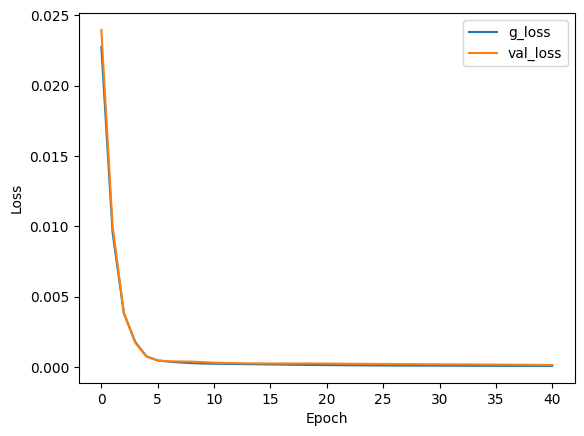

Epoch: 43, d_loss: 0.30806395305262413, d2_loss: 0.2925102114677429, g_loss: 8.196744602173567e-05, val_loss: 0.00013707806647289544


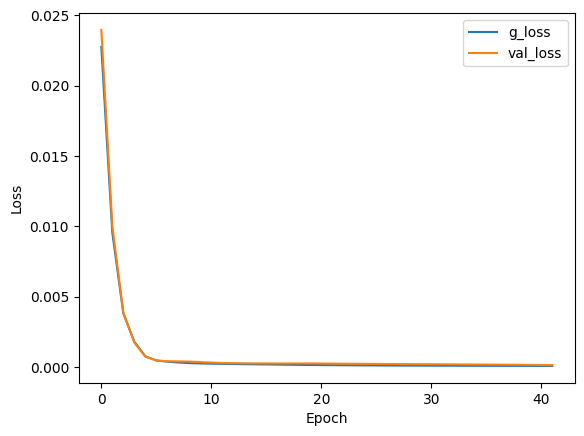

Epoch: 44, d_loss: 0.303124336154724, d2_loss: 0.2927713096141815, g_loss: 7.959969661897048e-05, val_loss: 0.0001336030545644462


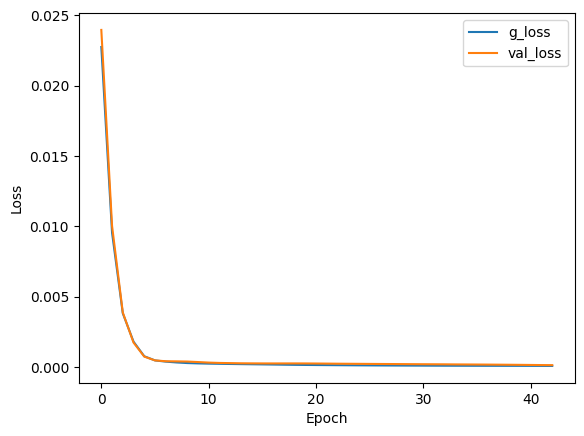

Epoch: 45, d_loss: 0.29829444648930803, d2_loss: 0.2944144904613495, g_loss: 7.996054773684591e-05, val_loss: 0.0001332680112682283


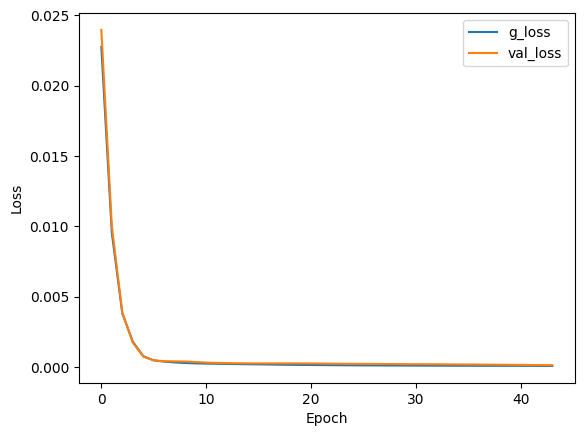

Epoch: 46, d_loss: 0.293629395942844, d2_loss: 0.2917020618915558, g_loss: 7.938842463772744e-05, val_loss: 0.00013305831816978753


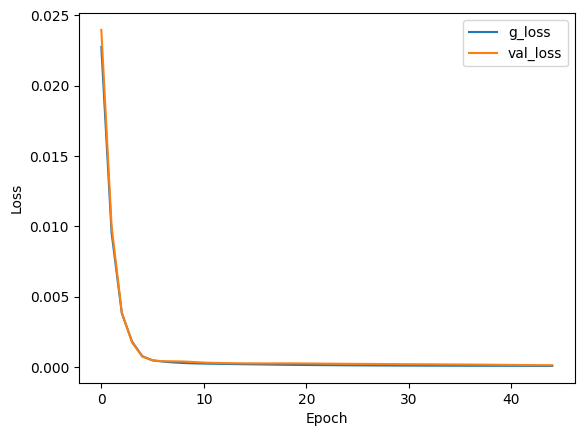

Epoch: 47, d_loss: 0.28907183703267947, d2_loss: 0.28974729776382446, g_loss: 8.042149420361966e-05, val_loss: 0.00013389476225711405


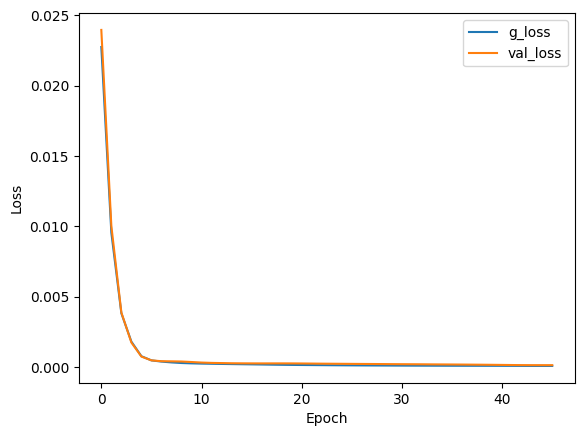

Epoch: 48, d_loss: 0.28451474350731587, d2_loss: 0.2878333330154419, g_loss: 8.107448957161978e-05, val_loss: 0.00013564963592216372


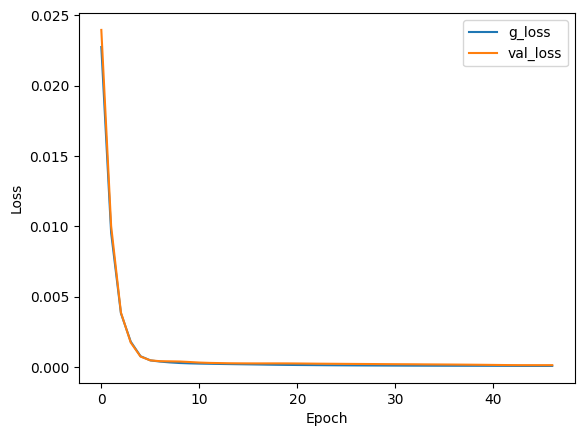

Epoch: 49, d_loss: 0.2801929155684775, d2_loss: 0.2844770550727844, g_loss: 8.088390313787386e-05, val_loss: 0.00013700316776521504


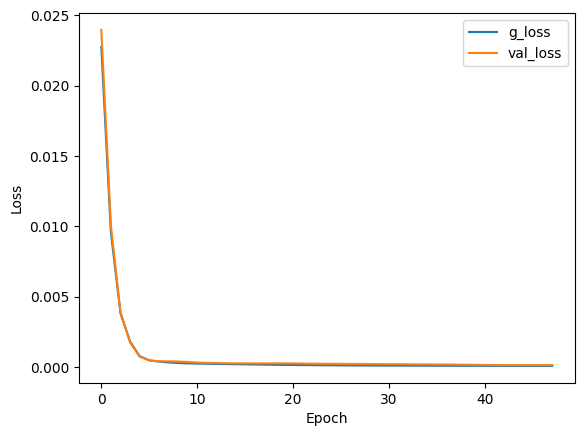

Epoch: 50, d_loss: 0.27585871423070785, d2_loss: 0.27989643812179565, g_loss: 7.893792644608766e-05, val_loss: 0.000137729846755974


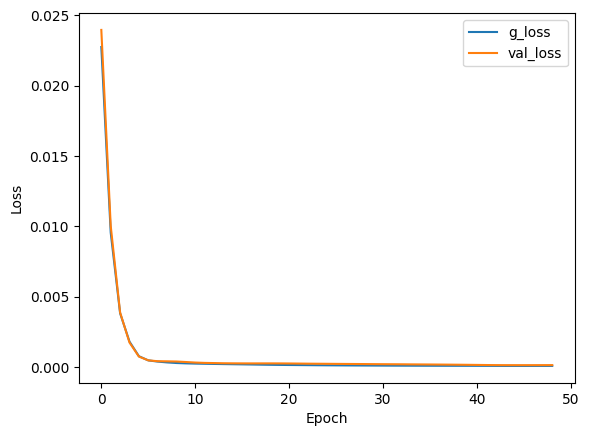

Epoch: 51, d_loss: 0.2715805471307249, d2_loss: 0.27047353982925415, g_loss: 7.42068950785324e-05, val_loss: 0.00012974486162420362


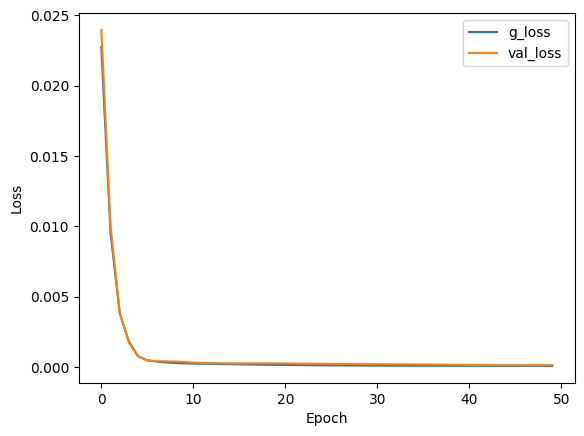

Epoch: 52, d_loss: 0.2732655303552747, d2_loss: 0.26535114645957947, g_loss: 7.411000842694193e-05, val_loss: 0.0001143876215792261


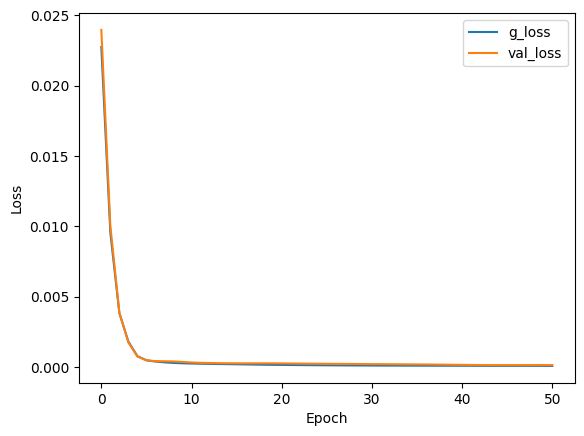

Epoch: 53, d_loss: 0.26350530592389987, d2_loss: 0.27068352699279785, g_loss: 7.609717431478202e-05, val_loss: 0.00011425920092733577


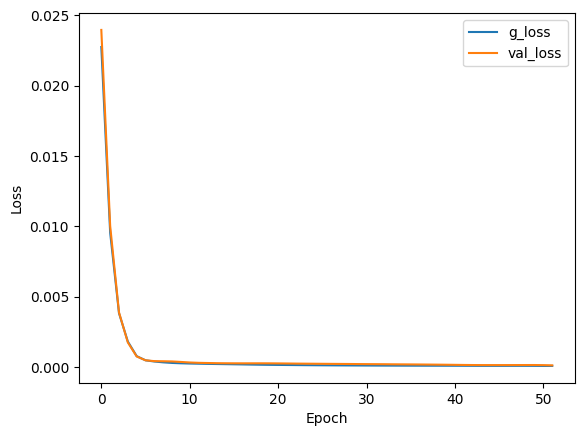

Epoch: 54, d_loss: 0.2597350497089792, d2_loss: 0.2678554952144623, g_loss: 7.507464033551514e-05, val_loss: 0.00011124818411190063


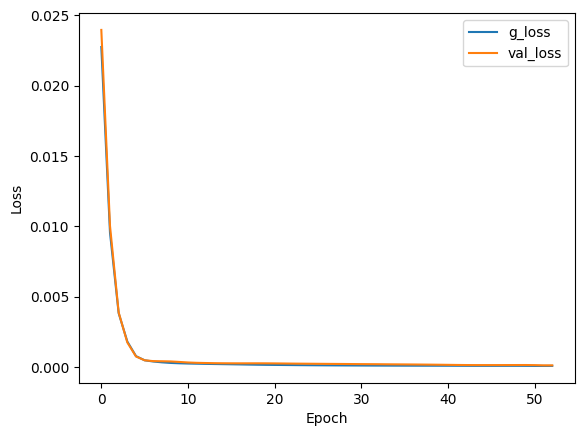

Epoch: 55, d_loss: 0.25573367287870497, d2_loss: 0.26384371519088745, g_loss: 7.243691652547568e-05, val_loss: 0.00010853925778064877


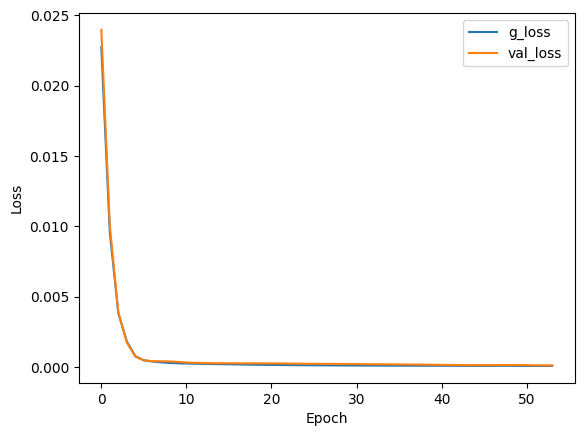

Epoch: 56, d_loss: 0.2520028176368214, d2_loss: 0.2629357576370239, g_loss: 7.202188135124743e-05, val_loss: 0.00010406319051980972


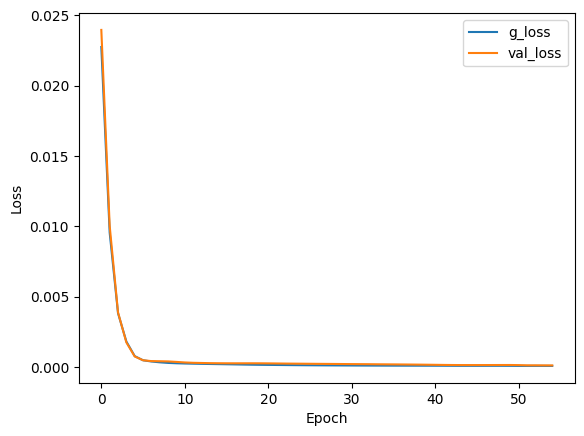

Epoch: 57, d_loss: 0.2481664996885229, d2_loss: 0.2586151957511902, g_loss: 6.894451507832855e-05, val_loss: 9.792538185138255e-05


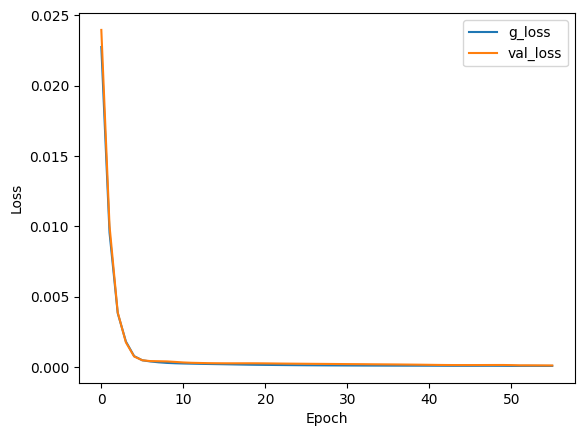

Epoch: 58, d_loss: 0.24667036219034344, d2_loss: 0.2524598240852356, g_loss: 6.686704000458121e-05, val_loss: 9.240226791007444e-05


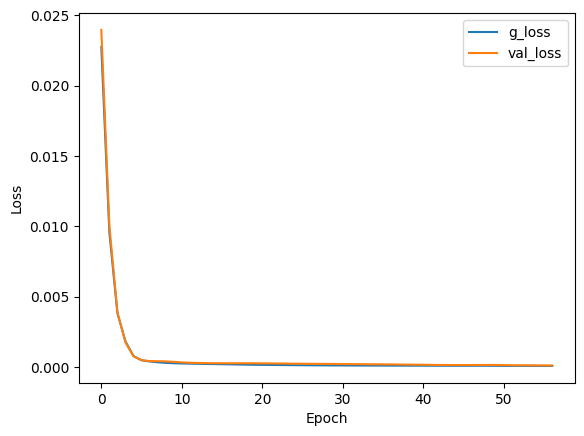

Epoch: 59, d_loss: 0.24178451133775525, d2_loss: 0.2553819417953491, g_loss: 6.610691343666986e-05, val_loss: 9.511521056992933e-05


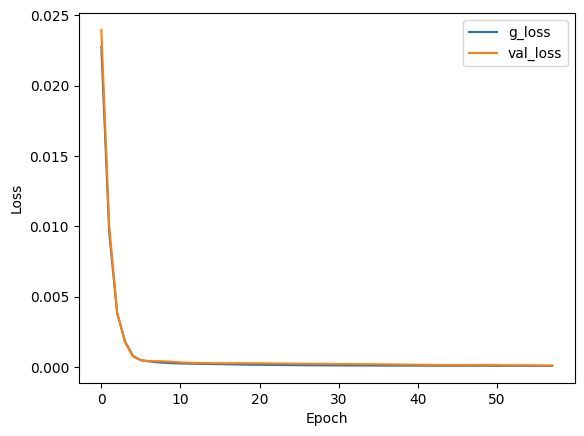

Epoch: 60, d_loss: 0.25128059182316065, d2_loss: 0.25966376066207886, g_loss: 6.854197999928147e-05, val_loss: 9.367342136101797e-05


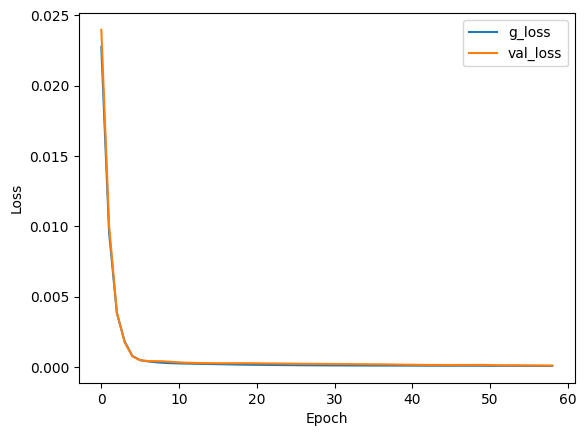

Epoch: 61, d_loss: 0.2352038698772958, d2_loss: 0.25856053829193115, g_loss: 6.754903733963147e-05, val_loss: 8.93708856892772e-05


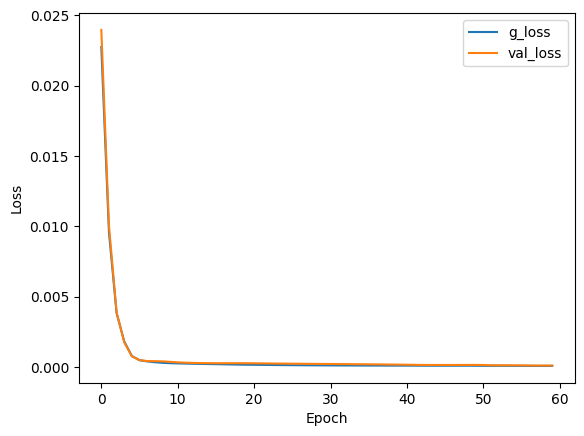

Epoch: 62, d_loss: 0.23187627772858832, d2_loss: 0.2543383836746216, g_loss: 6.44972751615569e-05, val_loss: 8.684413478476927e-05


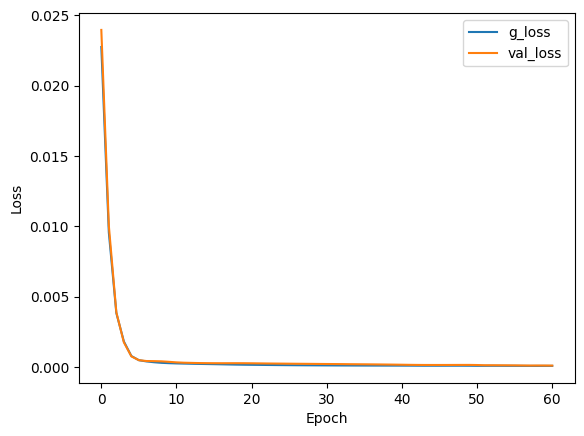

Epoch: 63, d_loss: 0.22905118396738544, d2_loss: 0.24484801292419434, g_loss: 6.361299165291712e-05, val_loss: 8.140446880133823e-05


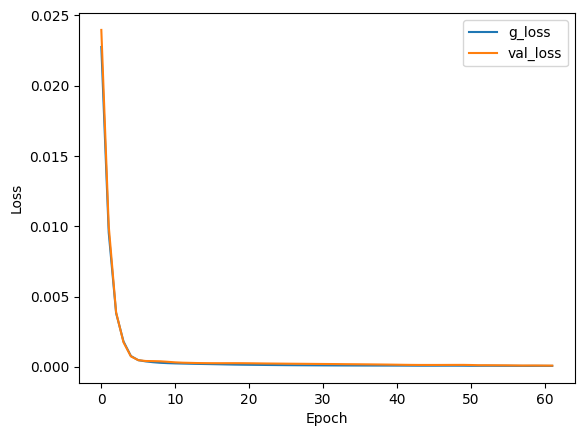

Epoch: 64, d_loss: 0.22525280559057137, d2_loss: 0.2447534203529358, g_loss: 6.280459638219327e-05, val_loss: 8.058868115767837e-05


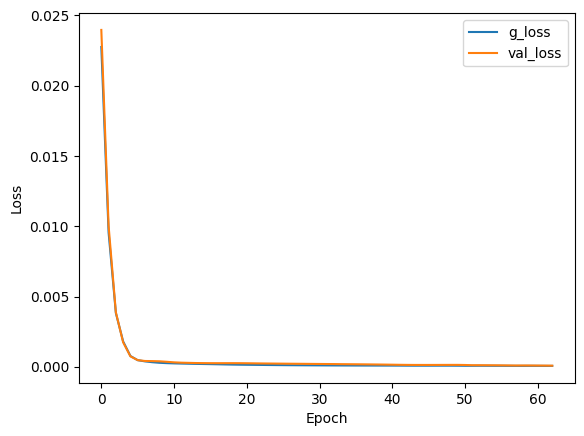

Epoch: 65, d_loss: 0.22321707347873598, d2_loss: 0.2516753375530243, g_loss: 6.282934918999672e-05, val_loss: 8.069763134699315e-05


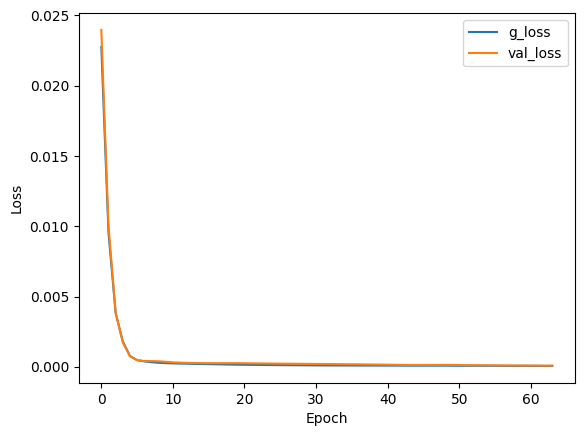

Epoch: 66, d_loss: 0.22255242872051895, d2_loss: 0.242989182472229, g_loss: 6.146995292510837e-05, val_loss: 7.966702833073214e-05


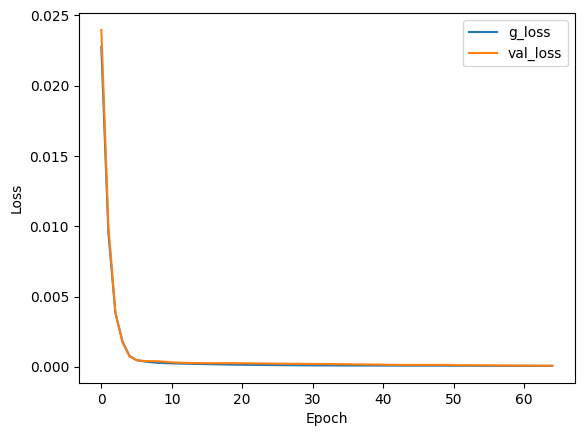

Epoch: 67, d_loss: 0.21649798593716696, d2_loss: 0.24059563875198364, g_loss: 6.081353421905078e-05, val_loss: 7.81877533881925e-05


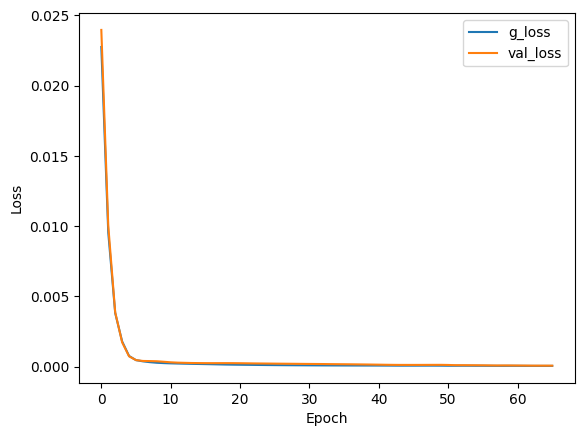

Epoch: 68, d_loss: 0.2911859527230263, d2_loss: 0.24040210247039795, g_loss: 6.02743421040941e-05, val_loss: 7.724631723249331e-05


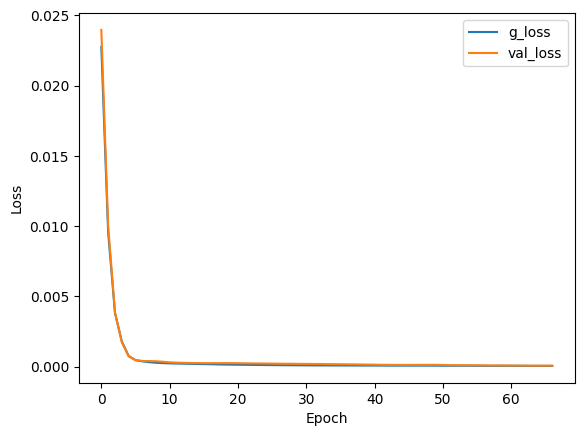

Epoch: 69, d_loss: 0.2126668095588684, d2_loss: 0.2390899360179901, g_loss: 5.962672730674967e-05, val_loss: 7.578229997307062e-05


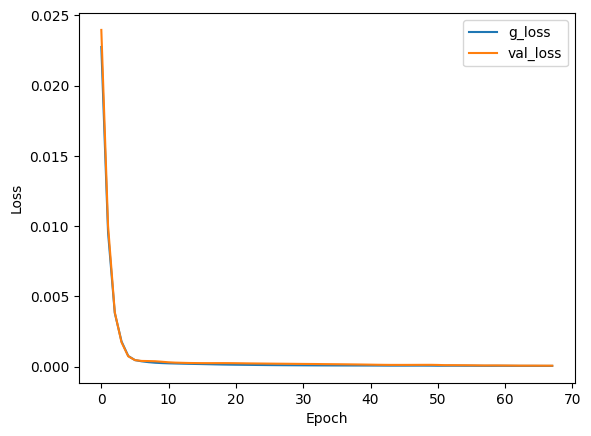

Epoch: 70, d_loss: 0.20848588121589273, d2_loss: 0.24980708956718445, g_loss: 7.082364027155563e-05, val_loss: 7.555074262199923e-05


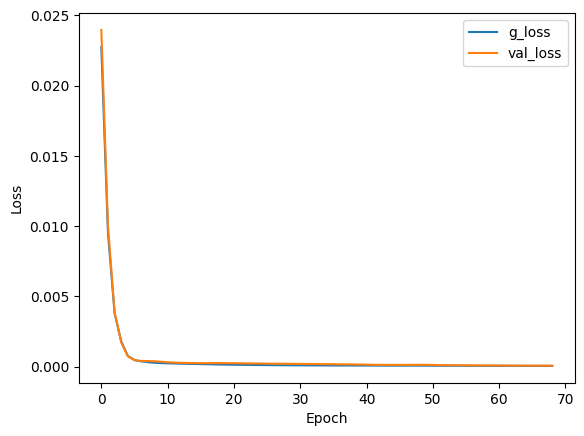

Epoch: 71, d_loss: 0.2041635949690317, d2_loss: 0.23777814209461212, g_loss: 6.043063331162557e-05, val_loss: 7.595495117129758e-05


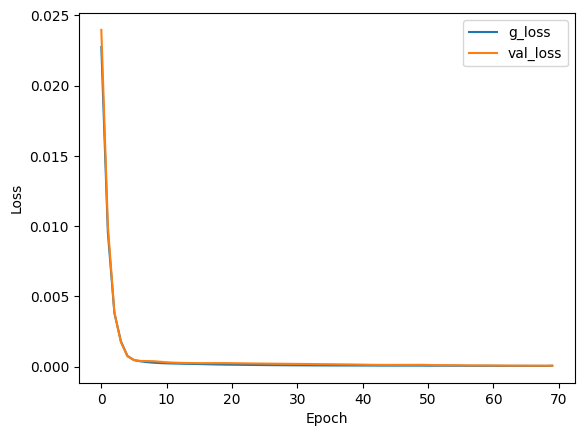

Epoch: 72, d_loss: 0.20141647357377224, d2_loss: 0.22733214497566223, g_loss: 6.188424595165998e-05, val_loss: 7.210423063952476e-05


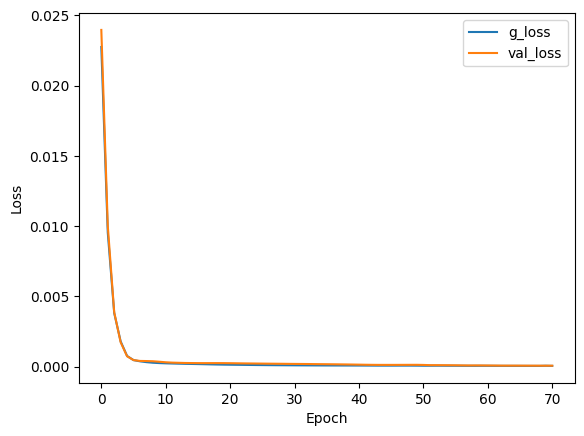

Epoch: 73, d_loss: 0.19859190106581082, d2_loss: 0.22925332188606262, g_loss: 5.9565390984062105e-05, val_loss: 6.983379716984928e-05


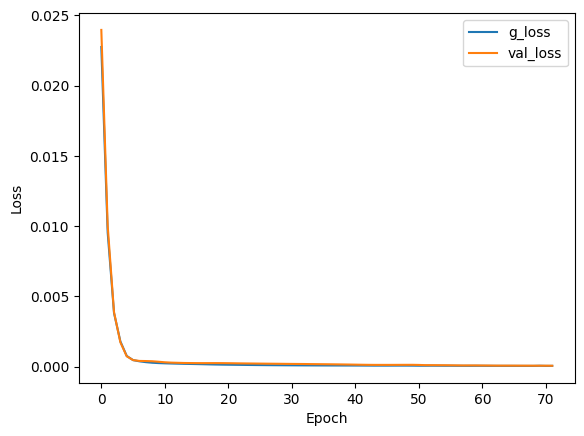

Epoch: 74, d_loss: 0.19584984369430458, d2_loss: 0.23145243525505066, g_loss: 5.715103179682046e-05, val_loss: 6.7649751144927e-05


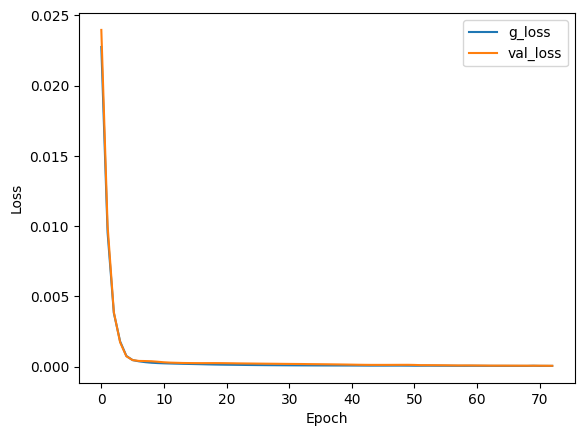

Epoch: 75, d_loss: 0.193134101031319, d2_loss: 0.23700356483459473, g_loss: 5.602243254543282e-05, val_loss: 6.772289634682238e-05


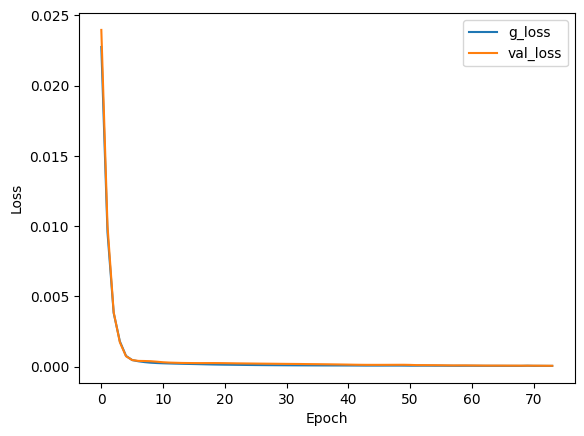

Epoch: 76, d_loss: 0.19051962926641863, d2_loss: 0.2281516045331955, g_loss: 5.707214950234629e-05, val_loss: 6.625140667892992e-05


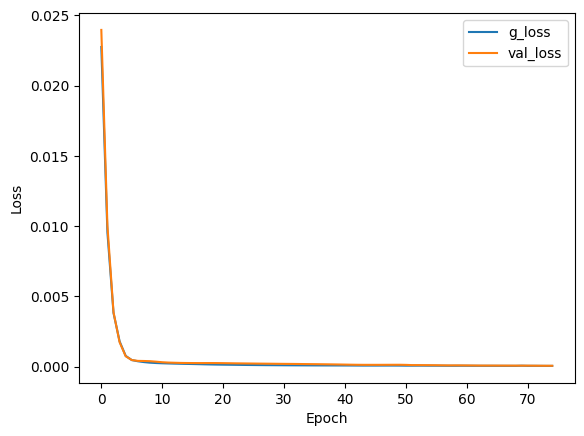

Epoch: 77, d_loss: 0.1884714417392388, d2_loss: 0.25192105770111084, g_loss: 7.709892088314518e-05, val_loss: 8.707887172931805e-05


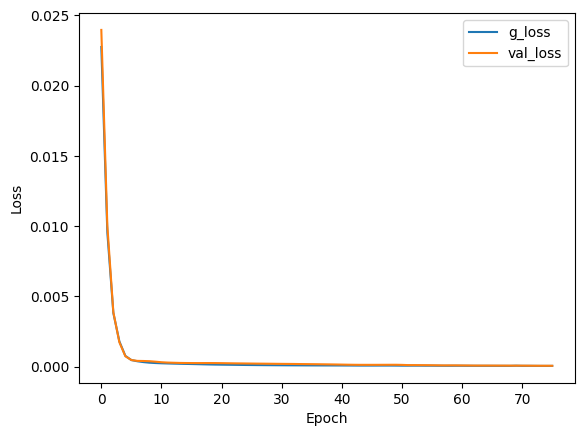

Epoch: 78, d_loss: 0.21175525896251202, d2_loss: 0.21655701100826263, g_loss: 6.334672798402607e-05, val_loss: 6.585037044715136e-05


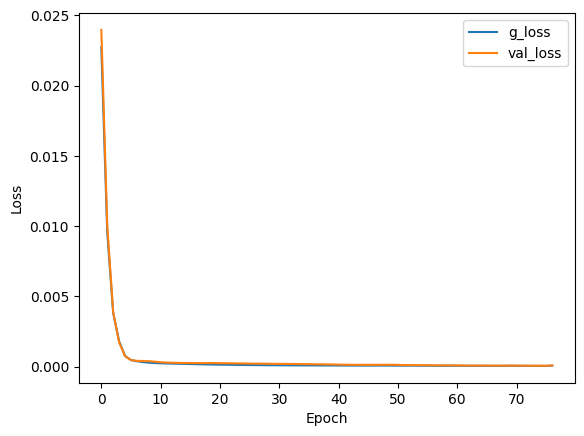

Epoch: 79, d_loss: 0.1837201509915758, d2_loss: 0.2244577407836914, g_loss: 5.585956751019694e-05, val_loss: 6.725488492520526e-05


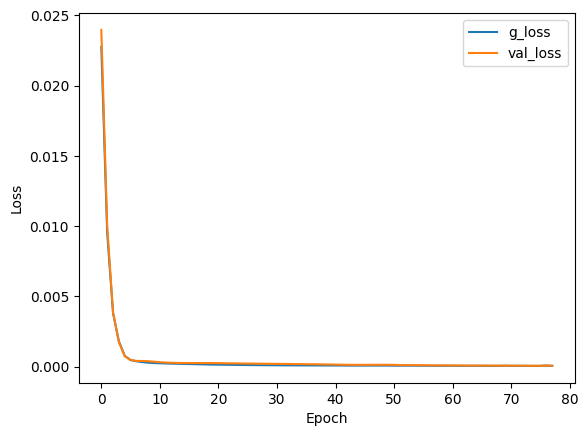

Epoch: 80, d_loss: 0.28943799436092377, d2_loss: 0.23212388157844543, g_loss: 5.5241813242901117e-05, val_loss: 7.977842324180529e-05


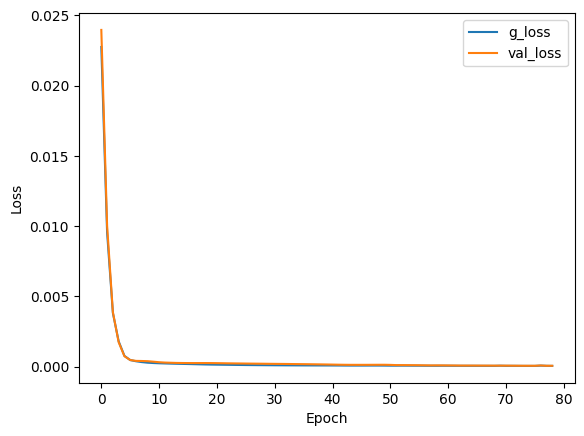

Epoch: 81, d_loss: 0.1801859448896721, d2_loss: 0.23465676605701447, g_loss: 6.087224028306082e-05, val_loss: 6.777373346267268e-05


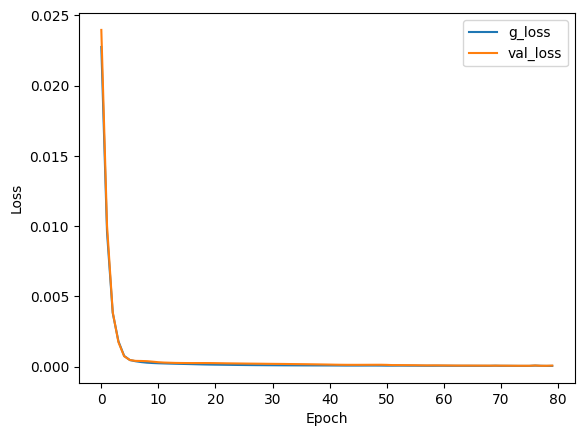

Epoch: 82, d_loss: 0.17632199588479125, d2_loss: 0.2241186499595642, g_loss: 5.324137237039395e-05, val_loss: 6.170454435050488e-05


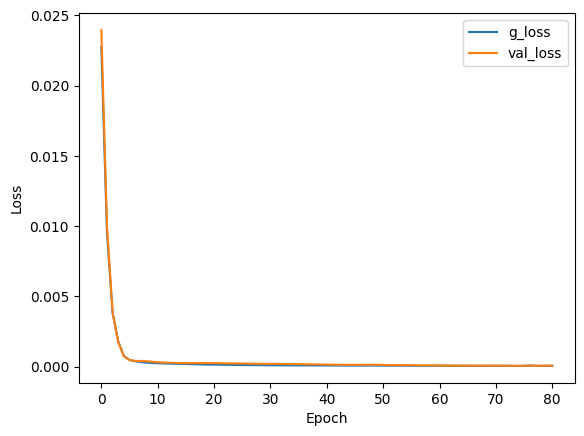

Epoch: 83, d_loss: 0.17394715568661923, d2_loss: 0.22418054938316345, g_loss: 5.234046693658456e-05, val_loss: 6.138520984677598e-05


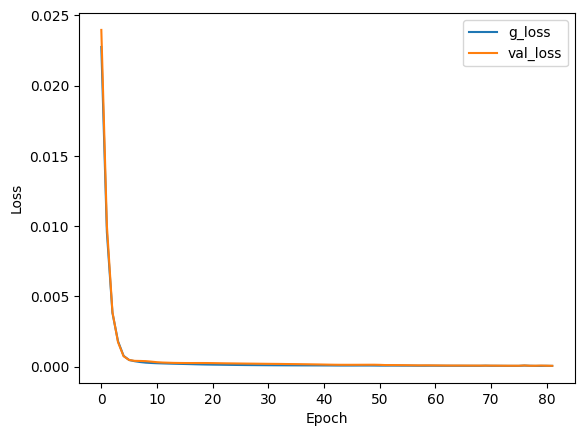

Epoch: 84, d_loss: 0.17157449005753733, d2_loss: 0.22622999548912048, g_loss: 5.19566165166907e-05, val_loss: 6.079223021515645e-05


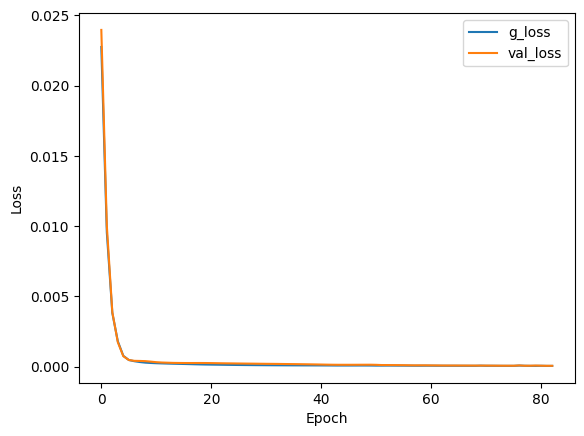

Epoch: 85, d_loss: 0.16928859872496105, d2_loss: 0.22600775957107544, g_loss: 5.2600713388528675e-05, val_loss: 6.086274515837431e-05


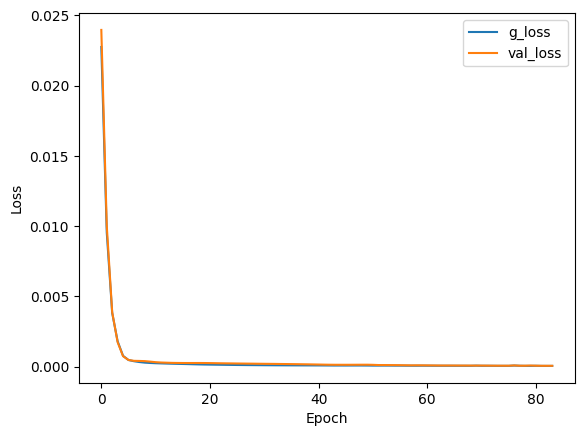

Epoch: 86, d_loss: 0.16699844074355497, d2_loss: 0.23068980872631073, g_loss: 5.092262654216029e-05, val_loss: 6.059852603357285e-05


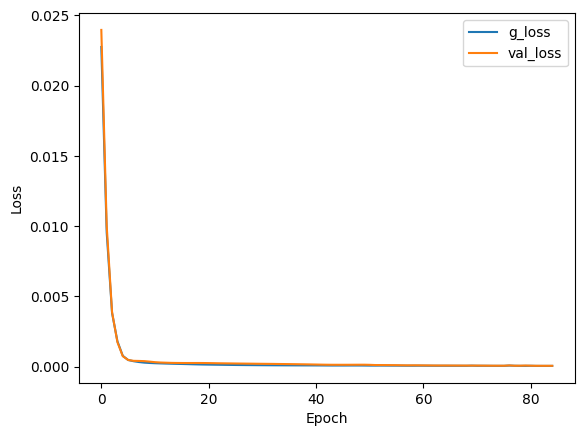

Epoch: 87, d_loss: 0.16475084313788102, d2_loss: 0.22799013555049896, g_loss: 5.1707818784052506e-05, val_loss: 6.071473762858659e-05


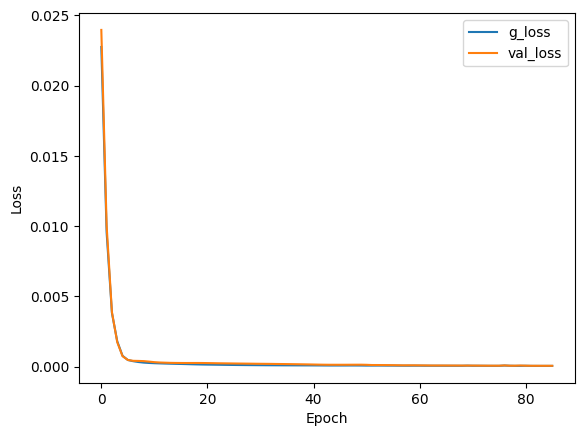

Epoch: 88, d_loss: 0.162575293215923, d2_loss: 0.22447837889194489, g_loss: 5.193668766878545e-05, val_loss: 6.001098154229112e-05


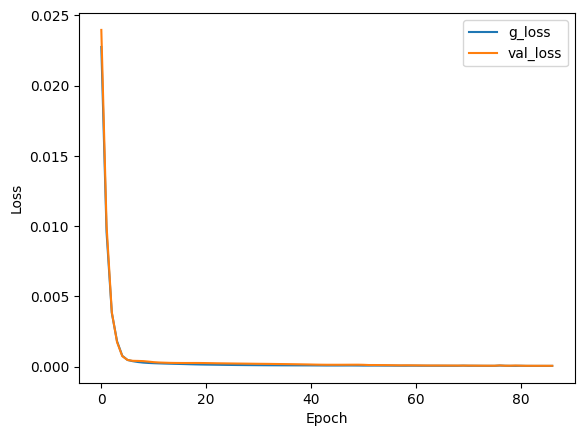

Epoch: 89, d_loss: 0.16041603490157286, d2_loss: 0.22482514381408691, g_loss: 5.076850356999785e-05, val_loss: 5.9721227444242686e-05


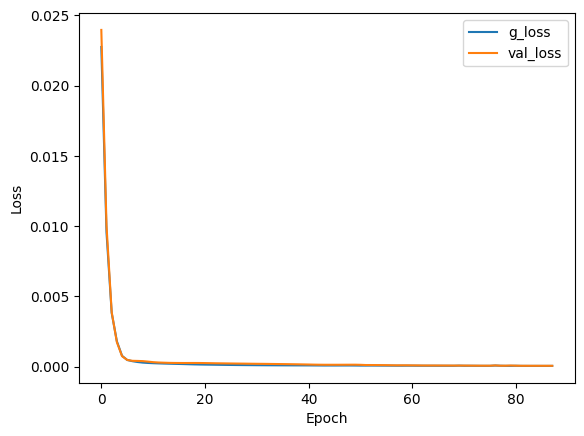

Epoch: 90, d_loss: 0.15828558801058534, d2_loss: 0.22496023774147034, g_loss: 5.006459468859248e-05, val_loss: 5.901972690480761e-05


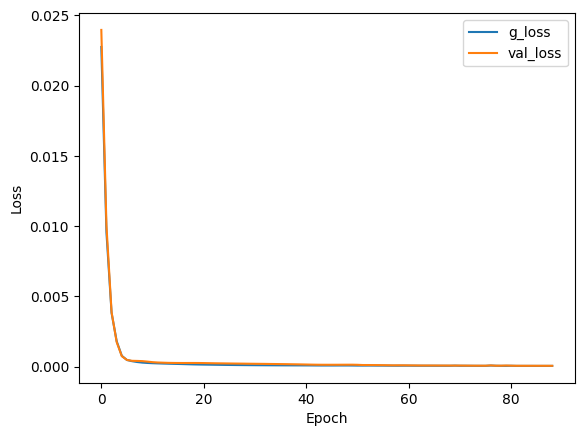

Epoch: 91, d_loss: 0.15618440090975128, d2_loss: 0.22630169987678528, g_loss: 4.96114807901904e-05, val_loss: 5.862009129486978e-05


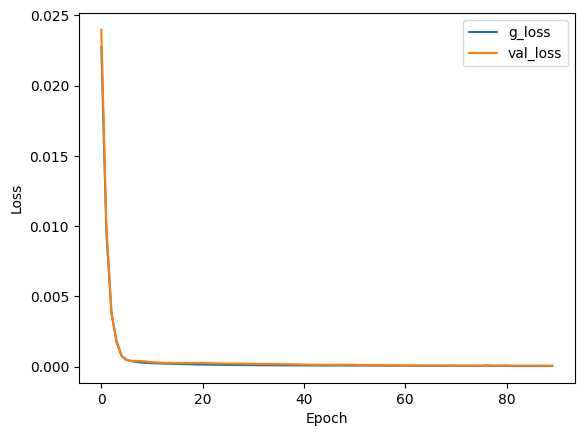

Epoch: 92, d_loss: 0.15411152721480903, d2_loss: 0.22559857368469238, g_loss: 5.023473204346374e-05, val_loss: 5.8601046475814655e-05


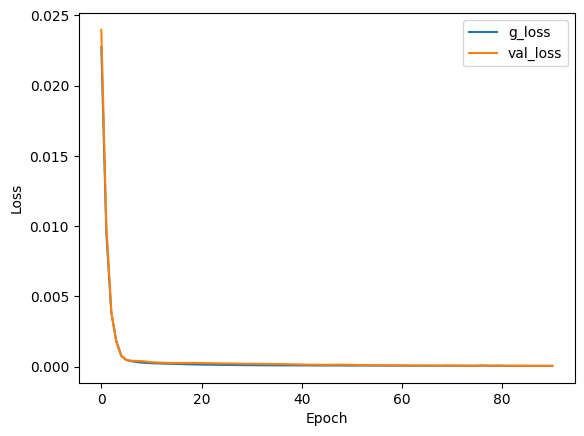

Epoch: 93, d_loss: 0.1520726137650854, d2_loss: 0.21828360855579376, g_loss: 5.097332177683711e-05, val_loss: 5.8181733038509265e-05


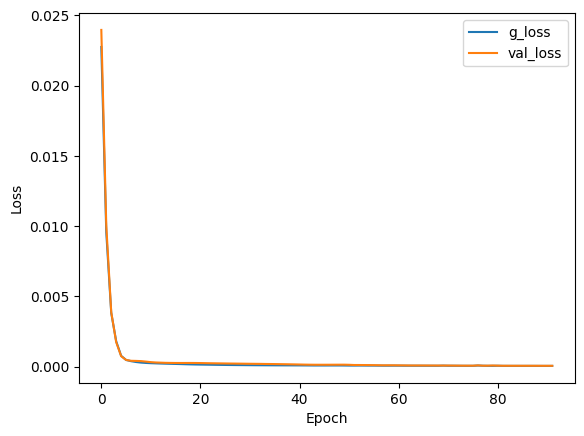

Epoch: 94, d_loss: 0.15006301196444838, d2_loss: 0.21895302832126617, g_loss: 4.954327596351504e-05, val_loss: 5.775002864538692e-05


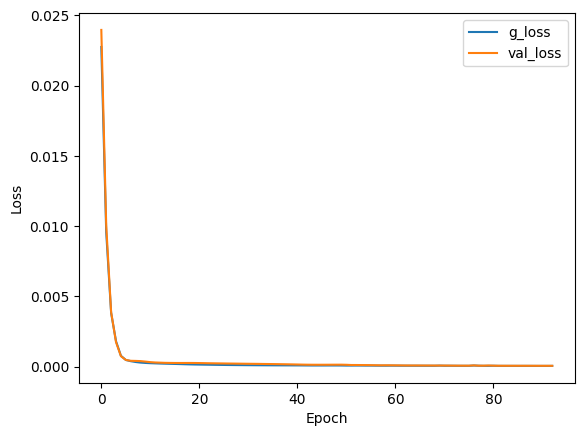

Epoch: 95, d_loss: 0.14808966679083824, d2_loss: 0.21694539487361908, g_loss: 5.0172413466498256e-05, val_loss: 5.81434323976282e-05


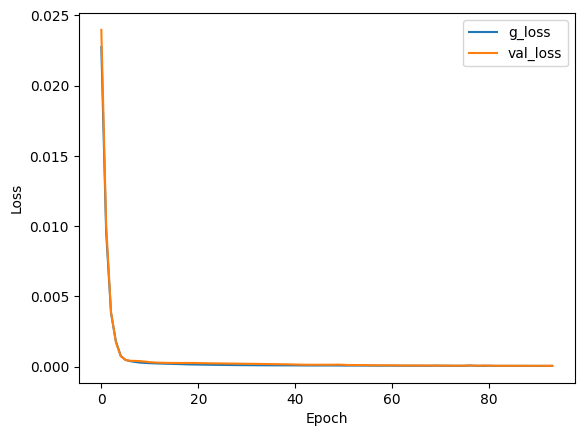

Epoch: 96, d_loss: 0.14613588621523377, d2_loss: 0.21655139327049255, g_loss: 5.1115079259034246e-05, val_loss: 5.786034307675436e-05


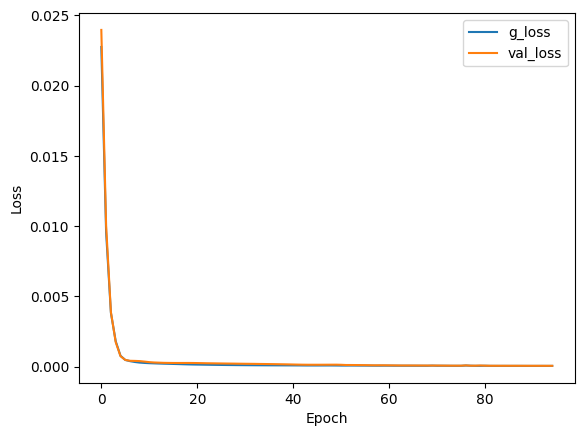

Epoch: 97, d_loss: 0.1587259154766798, d2_loss: 0.22032150626182556, g_loss: 4.885717498837039e-05, val_loss: 5.751259595854208e-05


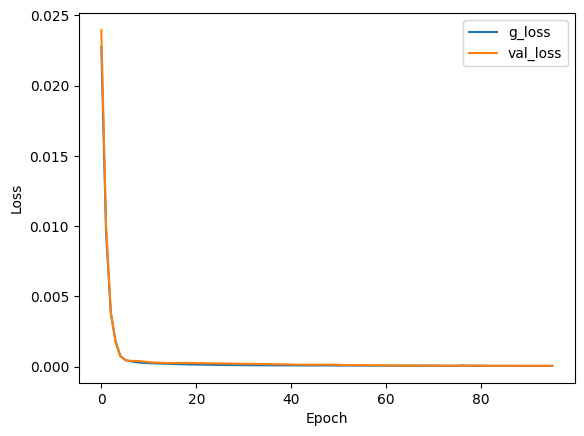

Epoch: 98, d_loss: 0.8394087553024292, d2_loss: 0.2092185616493225, g_loss: 5.180414154892787e-05, val_loss: 5.7044300774578005e-05


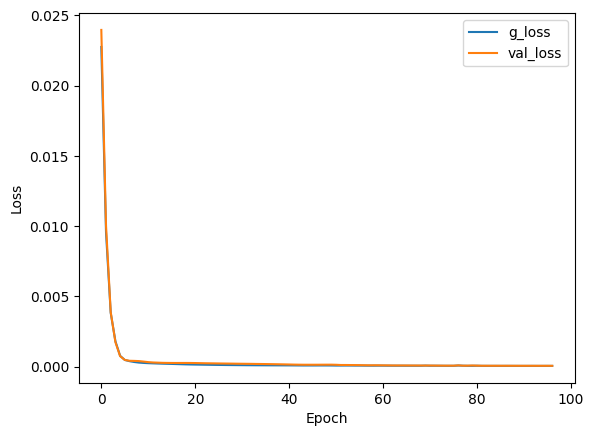

Epoch: 99, d_loss: 0.8342091888189316, d2_loss: 0.2143498957157135, g_loss: 4.826964868698269e-05, val_loss: 7.021678902674466e-05


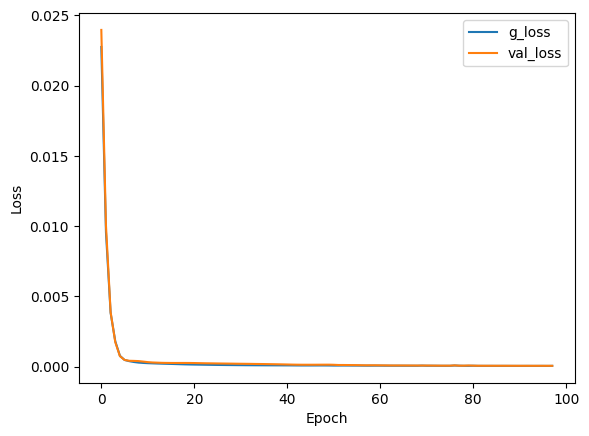

Epoch: 100, d_loss: 0.8275754749774933, d2_loss: 0.21874269843101501, g_loss: 5.691942715202458e-05, val_loss: 6.903232133481652e-05


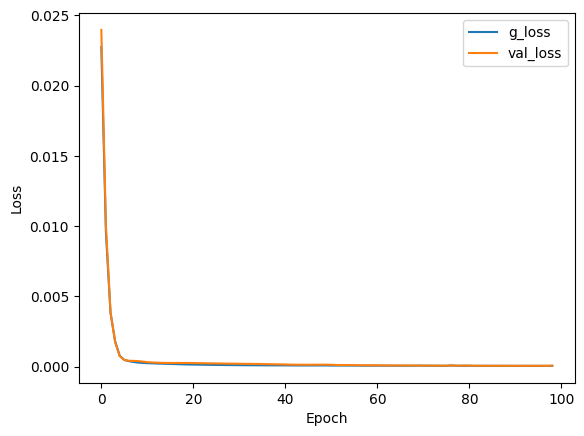

Epoch: 101, d_loss: 0.8214333057403564, d2_loss: 0.20307976007461548, g_loss: 4.833869752474129e-05, val_loss: 5.6191951443906873e-05


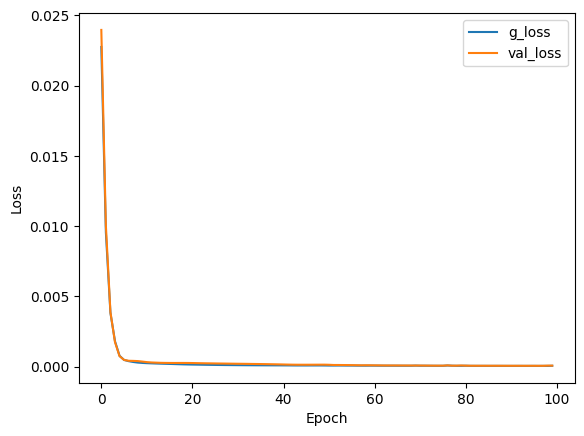

Epoch: 102, d_loss: 0.8157736659049988, d2_loss: 0.2074594497680664, g_loss: 4.753924804390408e-05, val_loss: 5.8282854297431186e-05


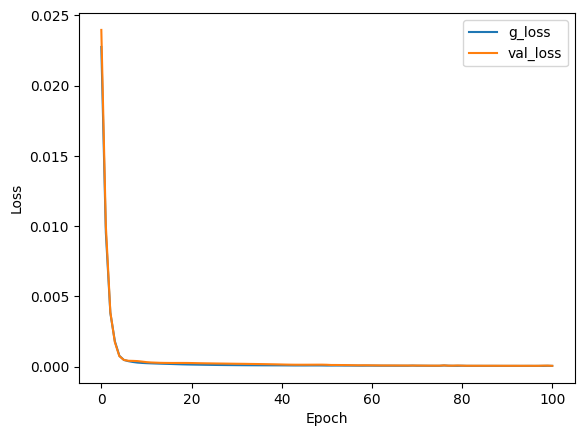

Epoch: 103, d_loss: 0.8105303198099136, d2_loss: 0.20587609708309174, g_loss: 4.707448533736169e-05, val_loss: 5.6068634876282886e-05


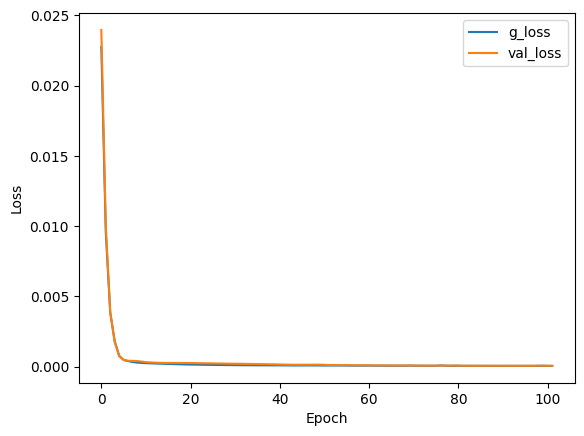

Epoch: 104, d_loss: 0.805648684501648, d2_loss: 0.20997688174247742, g_loss: 4.683565566665493e-05, val_loss: 5.7915978686651215e-05


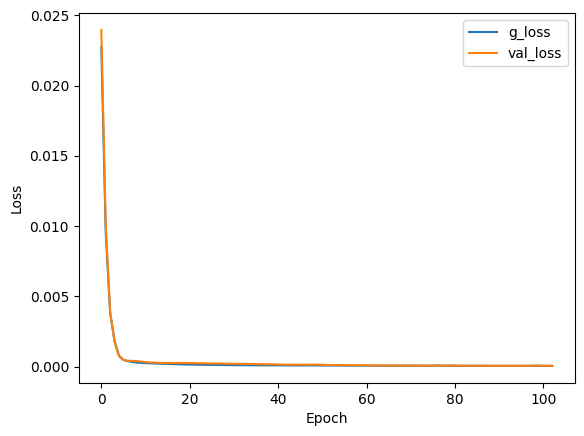

Epoch: 105, d_loss: 0.8010849356651306, d2_loss: 0.2094760537147522, g_loss: 4.6684464905411005e-05, val_loss: 5.7341127103427425e-05


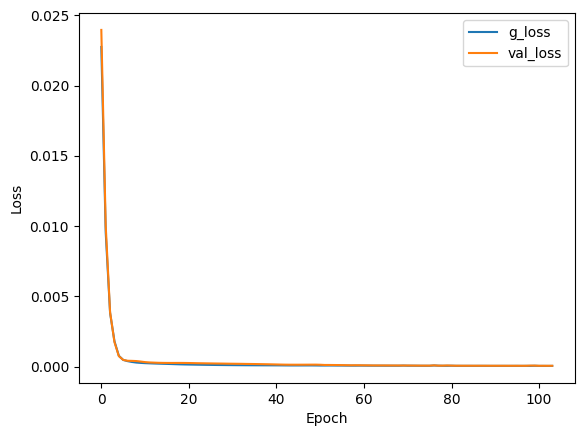

Epoch: 106, d_loss: 0.7968031615018845, d2_loss: 0.21060386300086975, g_loss: 4.694369272328913e-05, val_loss: 5.771203723270446e-05


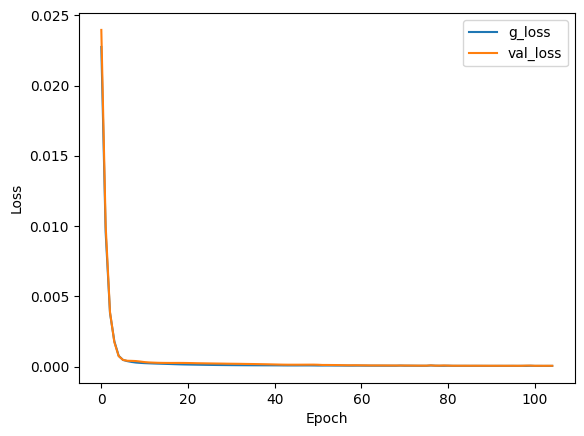

Epoch: 107, d_loss: 0.7927737087011337, d2_loss: 0.21044395864009857, g_loss: 4.704642196884379e-05, val_loss: 5.838934157509357e-05


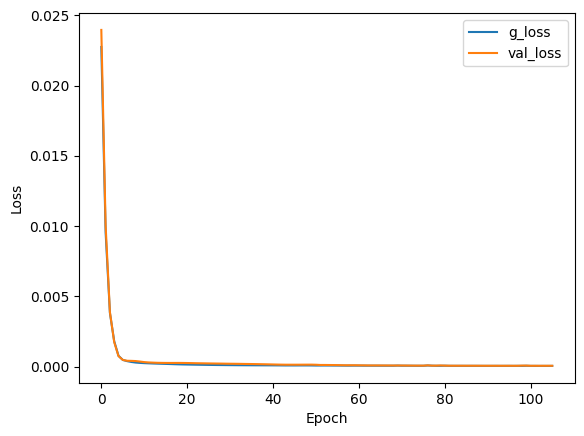

Epoch: 108, d_loss: 0.7889715135097504, d2_loss: 0.21016797423362732, g_loss: 4.721420555142686e-05, val_loss: 5.779777347925119e-05


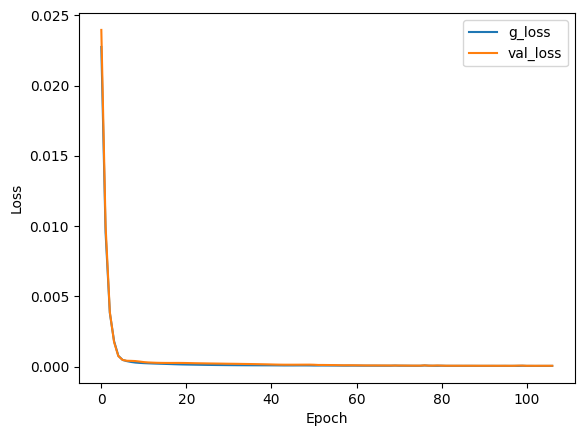

Epoch: 109, d_loss: 0.7853755205869675, d2_loss: 0.21042007207870483, g_loss: 4.802575858775526e-05, val_loss: 5.799354039481841e-05


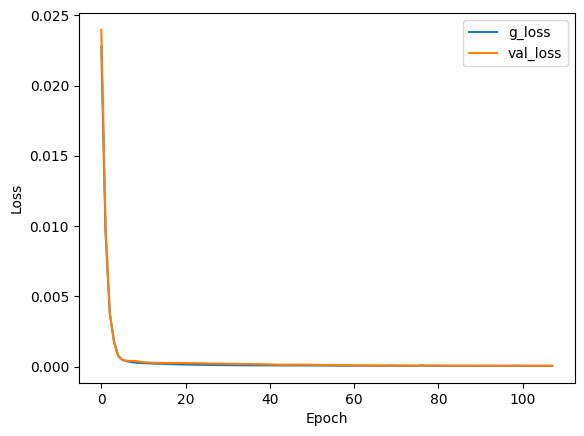

Epoch: 110, d_loss: 0.7819673866033554, d2_loss: 0.21122601628303528, g_loss: 5.0509355787653476e-05, val_loss: 5.8835466916207224e-05


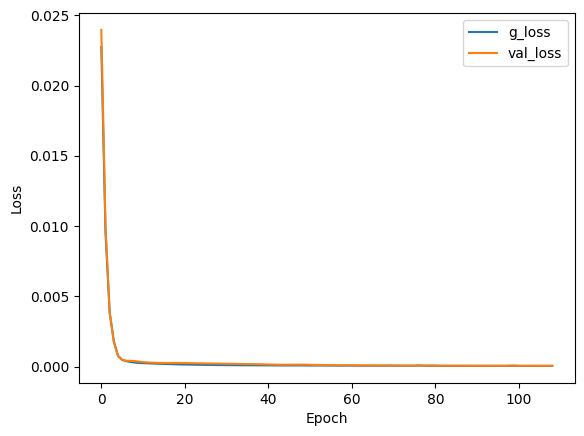

Epoch: 111, d_loss: 0.778731495141983, d2_loss: 0.20950578153133392, g_loss: 5.1531667850213125e-05, val_loss: 5.512301504495554e-05


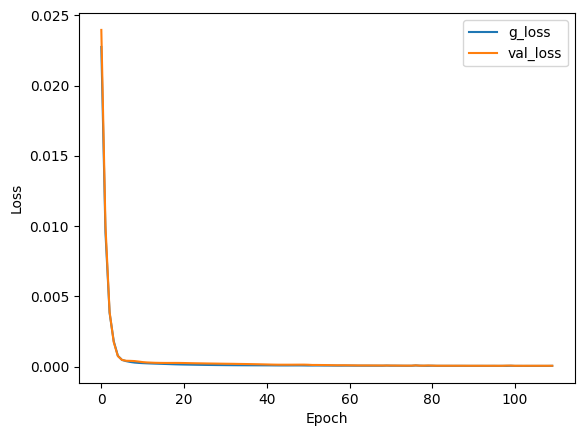

Epoch: 112, d_loss: 0.7756540924310684, d2_loss: 0.2014336884021759, g_loss: 4.6378419938264415e-05, val_loss: 5.271192640066147e-05


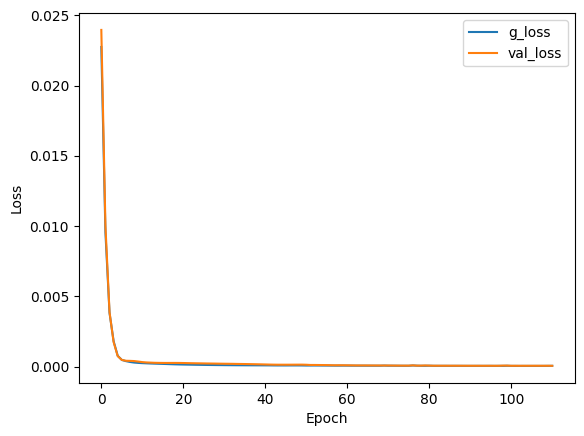

Epoch: 113, d_loss: 0.7727230042219162, d2_loss: 0.192014679312706, g_loss: 4.8199544835370034e-05, val_loss: 5.333121953299269e-05


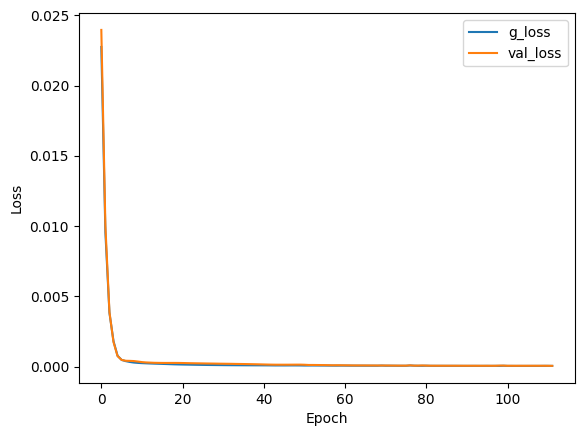

Epoch: 114, d_loss: 0.7699276208877563, d2_loss: 0.19902247190475464, g_loss: 4.488915510592051e-05, val_loss: 5.279096876620315e-05


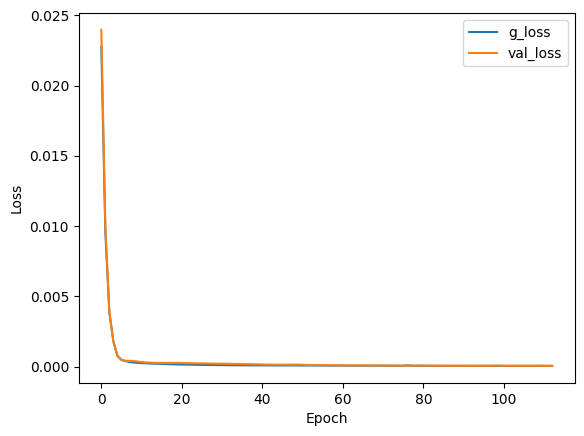

Epoch: 115, d_loss: 0.7672584354877472, d2_loss: 0.20156197249889374, g_loss: 4.449809421203099e-05, val_loss: 5.134080856805667e-05


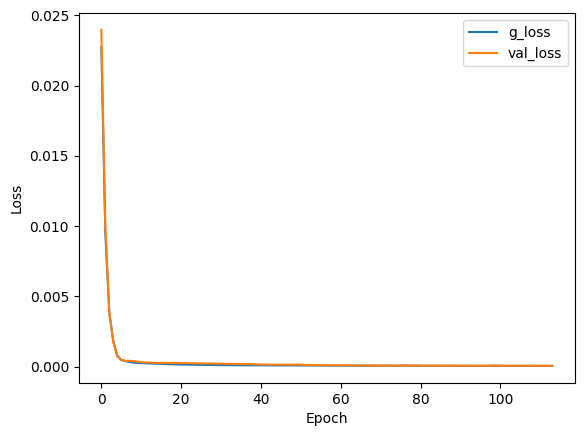

Epoch: 116, d_loss: 0.7647068500518799, d2_loss: 0.2076166272163391, g_loss: 4.599120074999519e-05, val_loss: 5.2885254262946546e-05


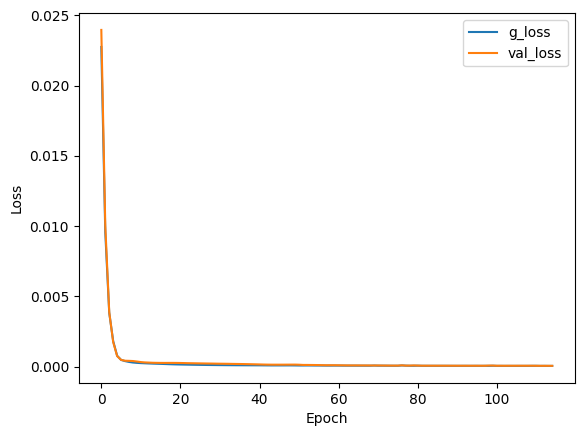

Epoch: 117, d_loss: 0.7622653841972351, d2_loss: 0.20681464672088623, g_loss: 4.554195038508624e-05, val_loss: 5.1940438424935564e-05


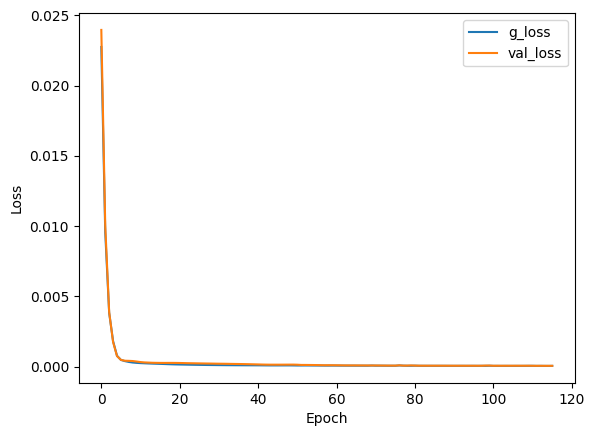

Epoch: 118, d_loss: 0.759927049279213, d2_loss: 0.20734913647174835, g_loss: 4.589436866808683e-05, val_loss: 5.2155392040731385e-05


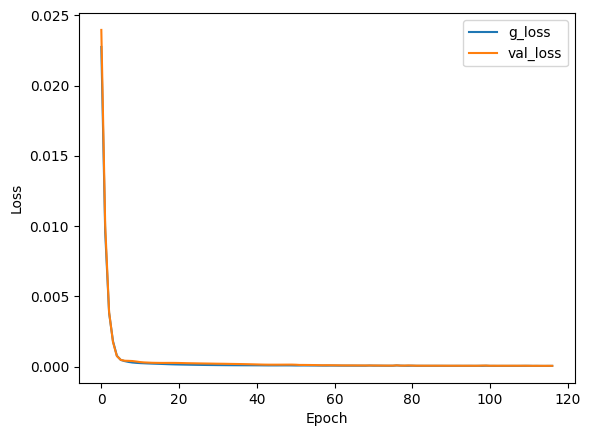

Epoch: 119, d_loss: 0.757685512304306, d2_loss: 0.20754823088645935, g_loss: 4.667253597290255e-05, val_loss: 5.1726172387134284e-05


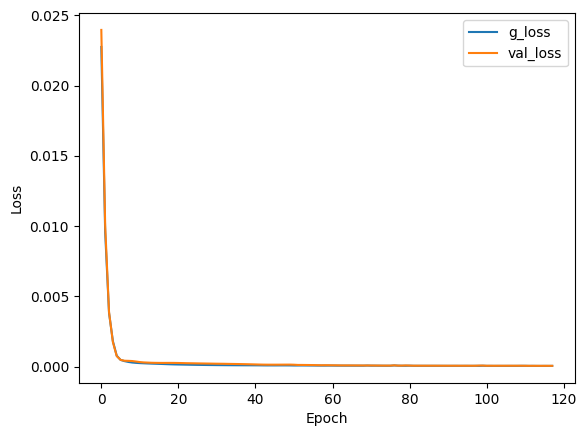

Epoch: 120, d_loss: 0.7555352002382278, d2_loss: 0.20694611966609955, g_loss: 4.764073673868552e-05, val_loss: 5.1174534746678546e-05


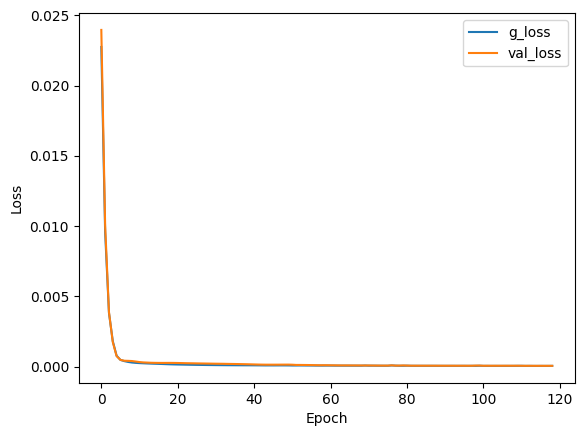

Epoch: 121, d_loss: 0.7534708827733994, d2_loss: 0.20345675945281982, g_loss: 4.6608060074504465e-05, val_loss: 4.994005576008931e-05


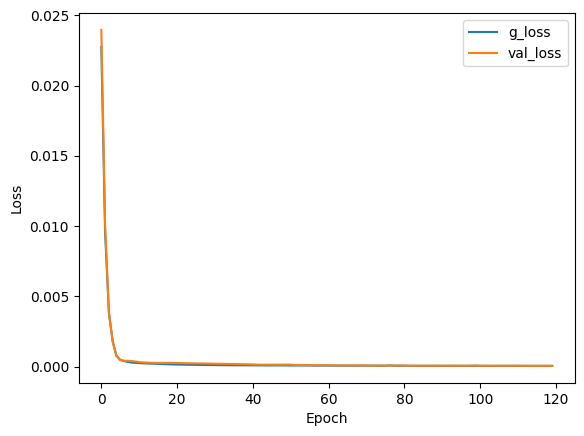

Epoch: 122, d_loss: 0.7514878809452057, d2_loss: 0.19384734332561493, g_loss: 4.3738094973377883e-05, val_loss: 5.2330095059005544e-05


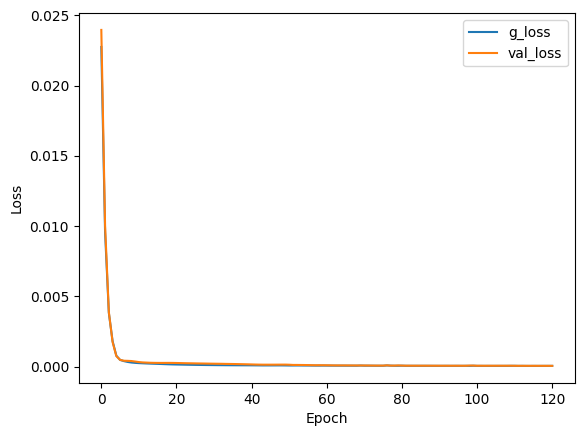

Epoch: 123, d_loss: 0.7495817095041275, d2_loss: 0.19013825058937073, g_loss: 4.784432894666679e-05, val_loss: 5.071510895504616e-05


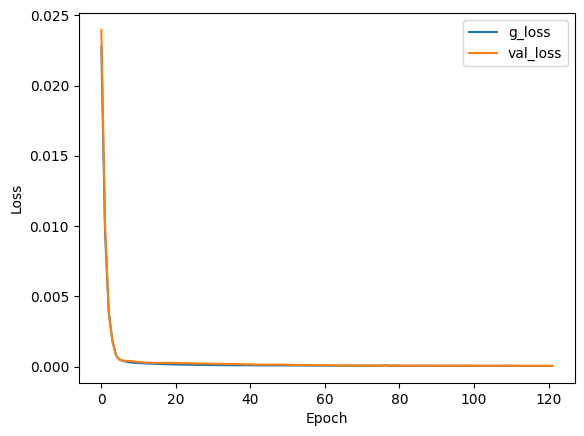

Epoch: 124, d_loss: 0.7477484047412872, d2_loss: 0.19764995574951172, g_loss: 4.3057676521129906e-05, val_loss: 5.327045073499903e-05


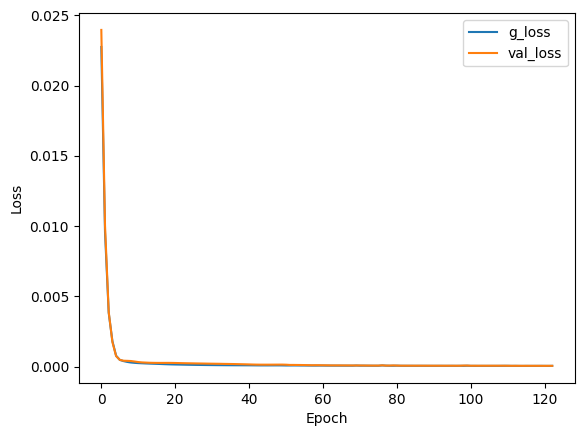

Epoch: 125, d_loss: 0.7459842264652252, d2_loss: 0.1980796456336975, g_loss: 4.302476008888334e-05, val_loss: 4.9435282562626526e-05


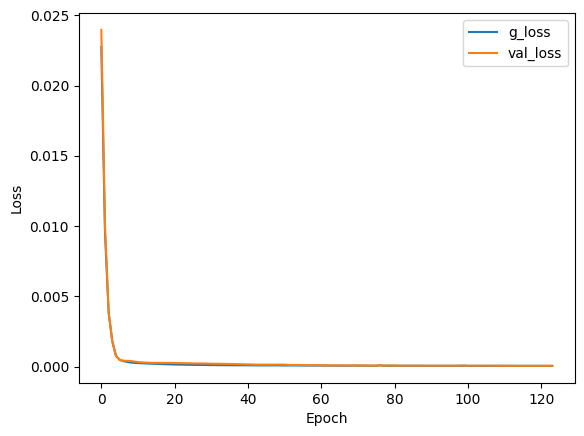

Epoch: 126, d_loss: 0.7442857325077057, d2_loss: 0.20127496123313904, g_loss: 4.3496133002918214e-05, val_loss: 4.913925295113586e-05


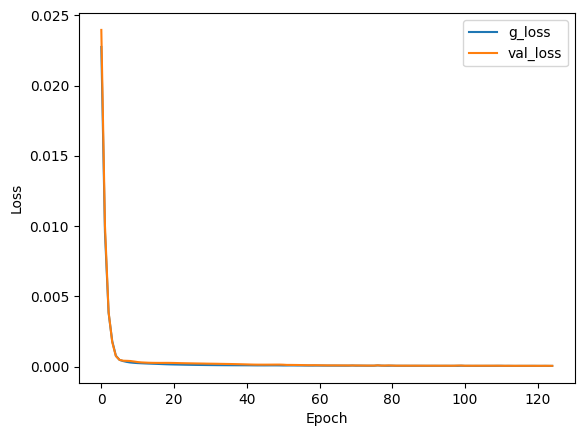

Epoch: 127, d_loss: 0.7426496595144272, d2_loss: 0.19929660856723785, g_loss: 4.287415504222736e-05, val_loss: 4.906598769593984e-05


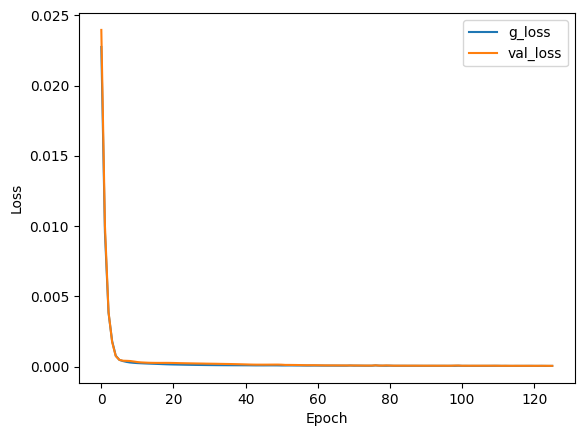

Epoch: 128, d_loss: 0.7410730868577957, d2_loss: 0.19758561253547668, g_loss: 4.242494105710648e-05, val_loss: 4.936541517963633e-05


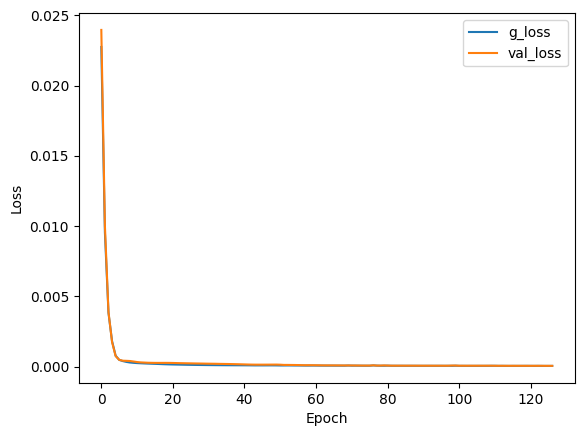

Epoch: 129, d_loss: 0.7395532876253128, d2_loss: 0.19520384073257446, g_loss: 4.317086495575495e-05, val_loss: 5.06121214129962e-05


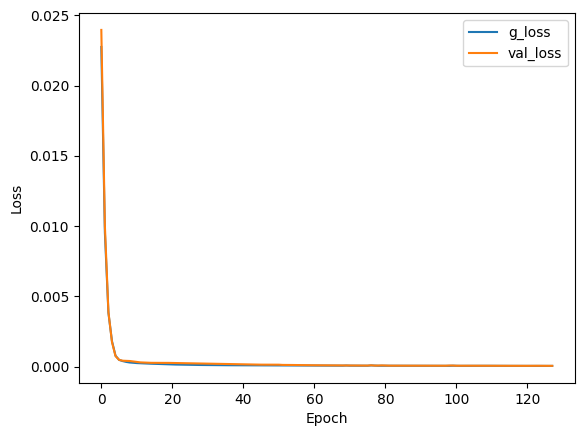

Epoch: 130, d_loss: 0.7380875200033188, d2_loss: 0.1935366988182068, g_loss: 4.521805385593325e-05, val_loss: 4.9850783398142084e-05


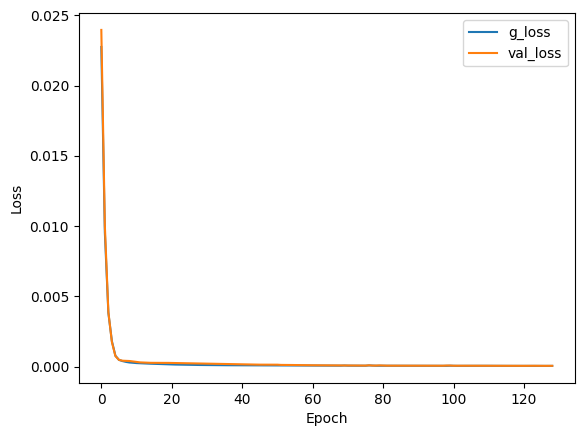

Epoch: 131, d_loss: 0.7366734892129898, d2_loss: 0.19377495348453522, g_loss: 4.52778949693311e-05, val_loss: 4.849773540627211e-05


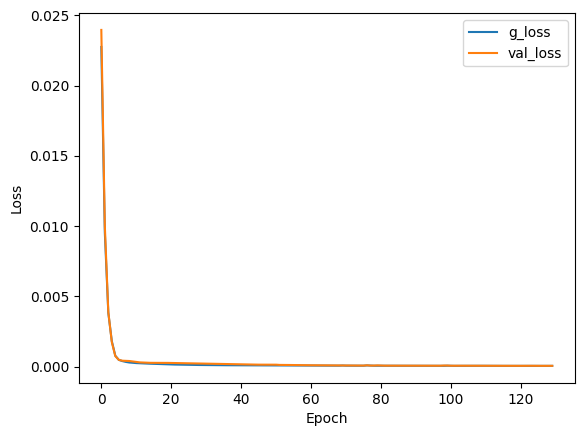

Epoch: 132, d_loss: 0.7353089302778244, d2_loss: 0.1940574198961258, g_loss: 4.413184797158465e-05, val_loss: 4.84892116219271e-05


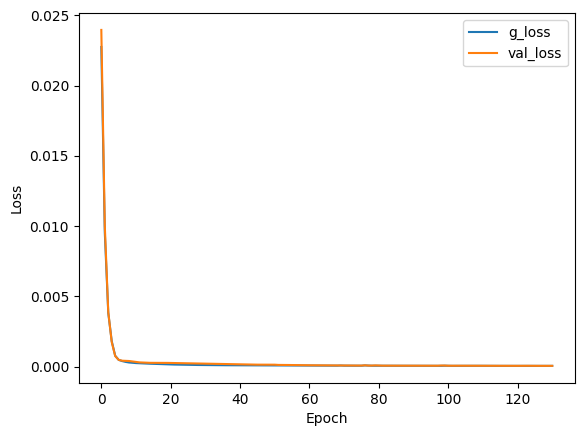

Epoch: 133, d_loss: 0.7339916527271271, d2_loss: 0.19693078100681305, g_loss: 4.219684342388064e-05, val_loss: 4.853729114984162e-05


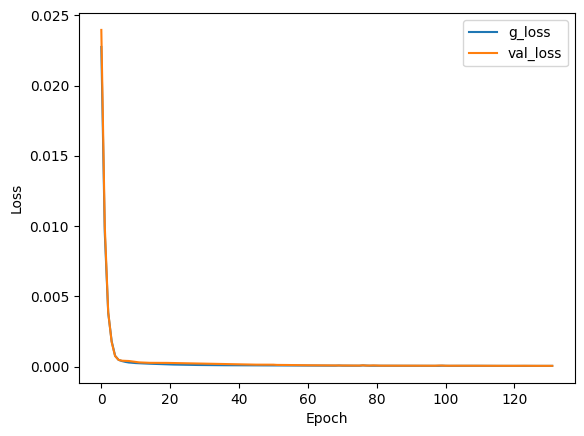

Epoch: 134, d_loss: 0.7327195852994919, d2_loss: 0.1984477937221527, g_loss: 4.1653704101918265e-05, val_loss: 4.811146209249273e-05


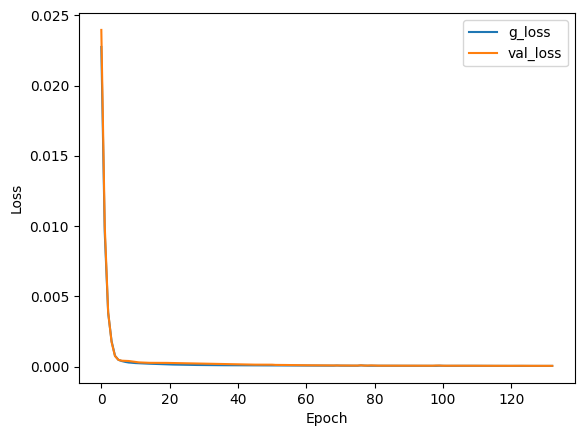

Epoch: 135, d_loss: 0.7314908802509308, d2_loss: 0.19997745752334595, g_loss: 4.145321508985944e-05, val_loss: 4.855400766246021e-05


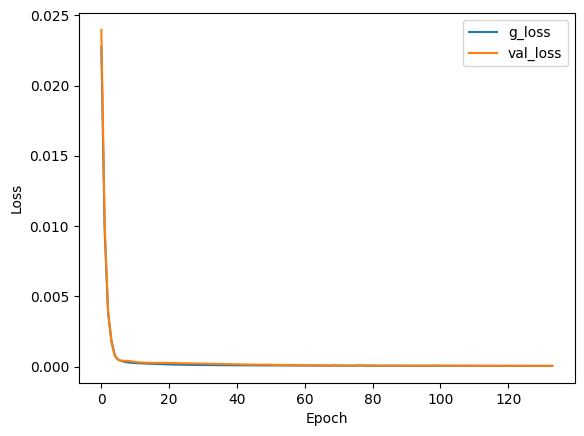

Epoch: 136, d_loss: 0.7303037047386169, d2_loss: 0.20164428651332855, g_loss: 4.151243047090247e-05, val_loss: 4.816258660866879e-05


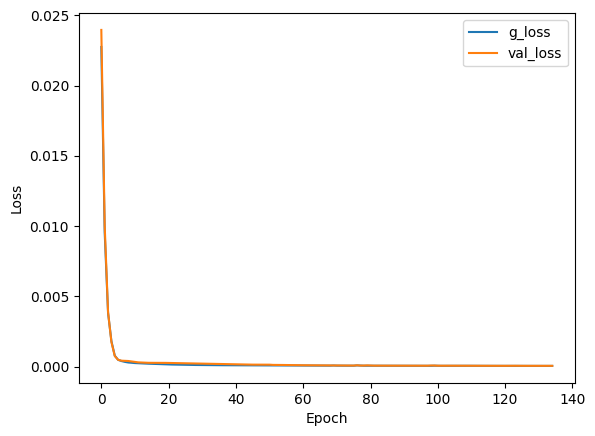

Epoch: 137, d_loss: 0.729156494140625, d2_loss: 0.19792720675468445, g_loss: 4.2146282794419676e-05, val_loss: 4.7649034968344495e-05


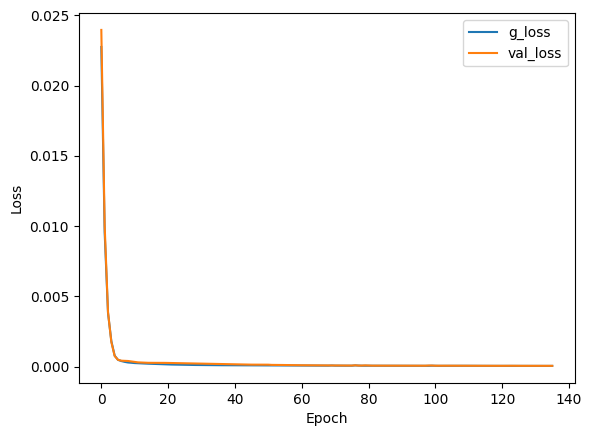

Epoch: 138, d_loss: 0.7280475795269012, d2_loss: 0.2046871781349182, g_loss: 4.21728182118386e-05, val_loss: 5.1698763854801655e-05


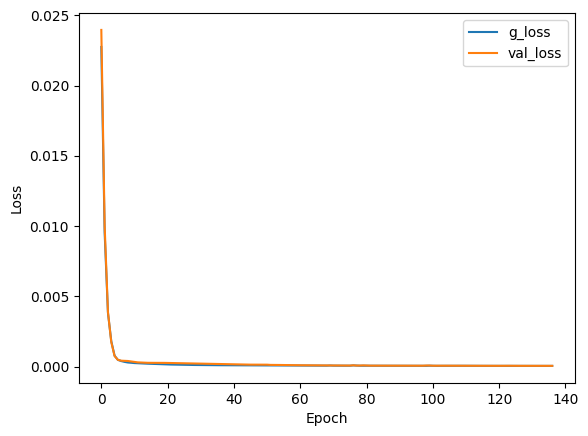

Epoch: 139, d_loss: 0.7269754111766815, d2_loss: 0.19179555773735046, g_loss: 4.317113052820787e-05, val_loss: 4.918842751067132e-05


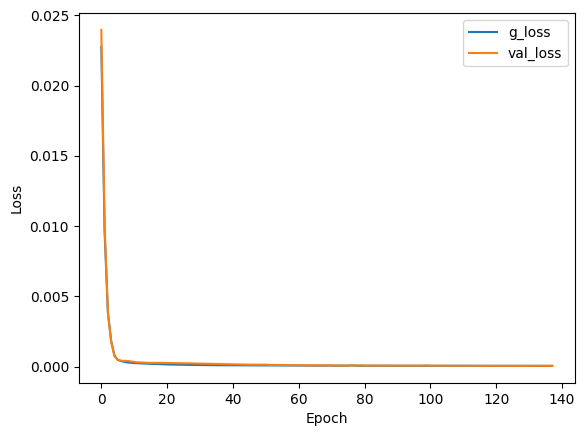

Epoch: 140, d_loss: 0.7259385883808136, d2_loss: 0.18697649240493774, g_loss: 4.585744682117365e-05, val_loss: 4.823191920877434e-05


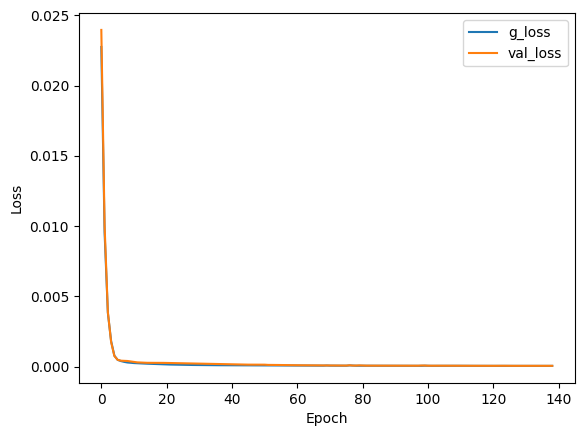

Epoch: 141, d_loss: 0.724935844540596, d2_loss: 0.19134269654750824, g_loss: 4.1184790461556986e-05, val_loss: 4.779783921549097e-05


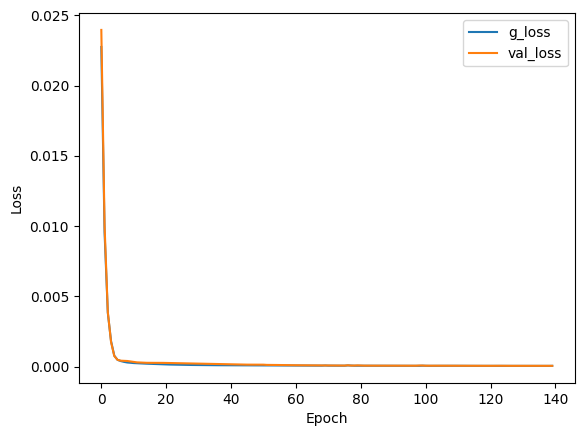

Epoch: 142, d_loss: 0.7239657193422318, d2_loss: 0.19360199570655823, g_loss: 4.0728224121266976e-05, val_loss: 4.7299708967329934e-05


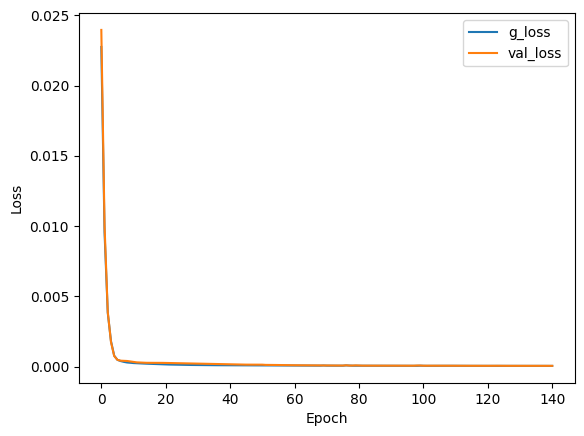

Epoch: 143, d_loss: 0.7230271100997925, d2_loss: 0.19100569188594818, g_loss: 4.2615320126060396e-05, val_loss: 4.842833004659042e-05


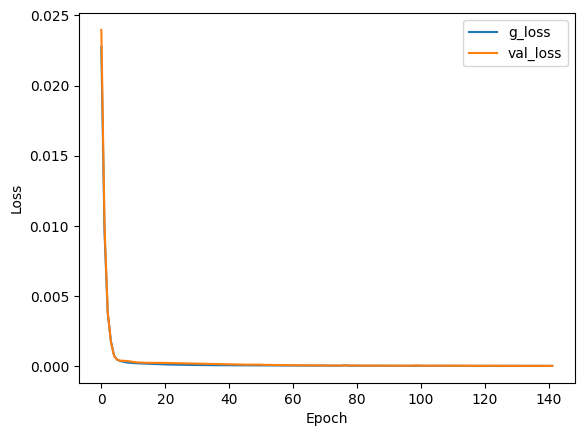

Epoch: 144, d_loss: 0.7221187204122543, d2_loss: 0.1973414123058319, g_loss: 4.05157552449964e-05, val_loss: 5.187685019336641e-05


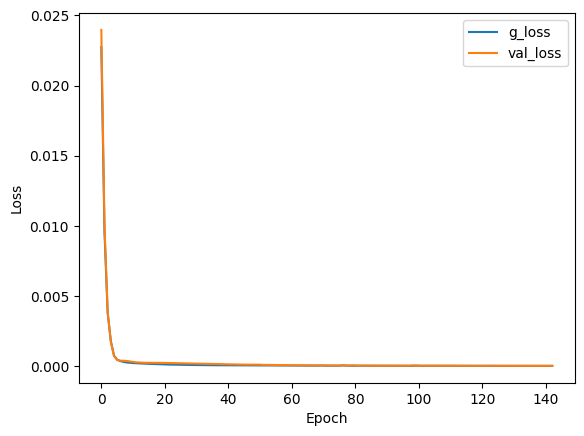

Epoch: 145, d_loss: 0.7212395966053009, d2_loss: 0.18490327894687653, g_loss: 4.401329351821914e-05, val_loss: 4.919389175483957e-05


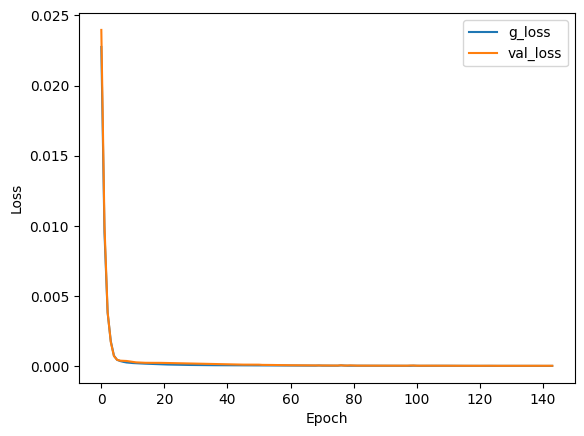

Epoch: 146, d_loss: 0.7203885465860367, d2_loss: 0.18579411506652832, g_loss: 4.038446786580607e-05, val_loss: 5.099222107673995e-05


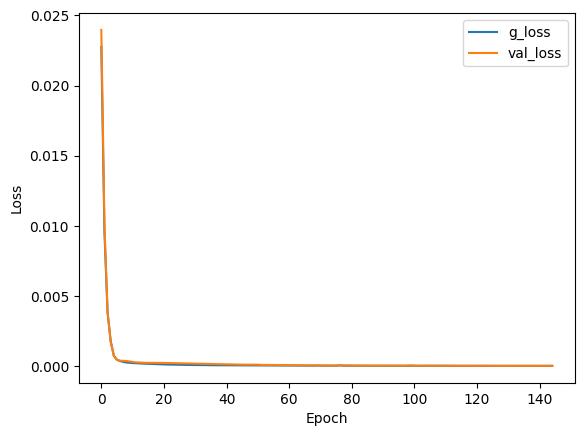

Epoch: 147, d_loss: 0.7195645868778229, d2_loss: 0.1913091242313385, g_loss: 4.319421714171767e-05, val_loss: 5.517169847735204e-05


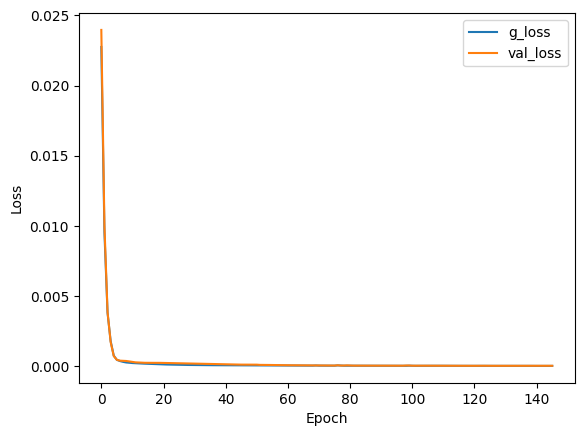

Epoch: 148, d_loss: 0.7187668085098267, d2_loss: 0.19287580251693726, g_loss: 5.023358971811831e-05, val_loss: 6.581819616258144e-05


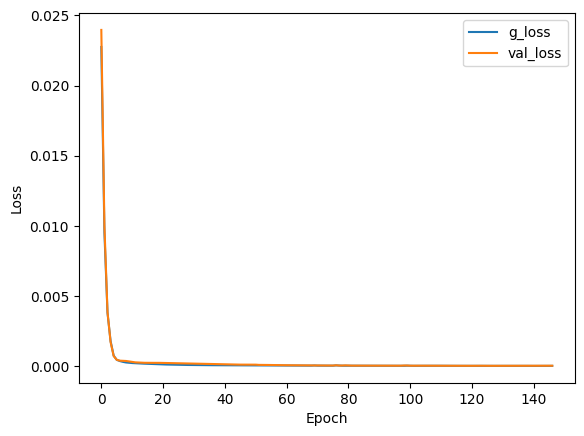

Epoch: 149, d_loss: 0.7179942280054092, d2_loss: 0.1798345446586609, g_loss: 4.145877028349787e-05, val_loss: 4.6876954002073035e-05


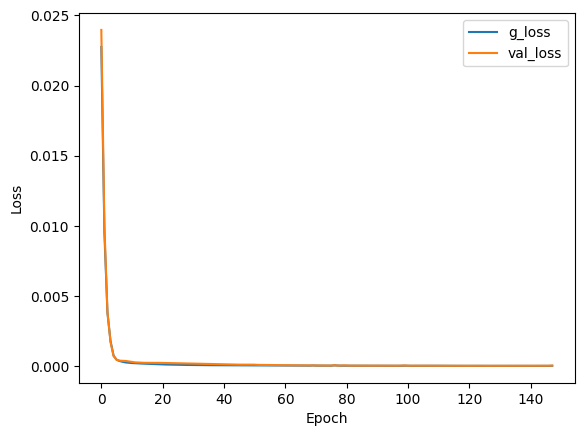

Epoch: 150, d_loss: 0.7172459363937378, d2_loss: 0.17029452323913574, g_loss: 4.4835331209469587e-05, val_loss: 4.6530953113688156e-05


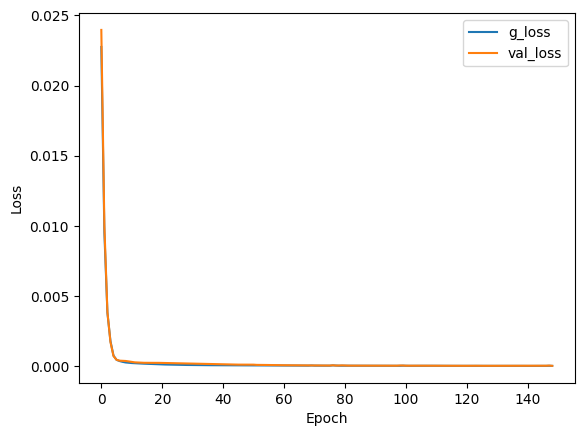

Epoch: 151, d_loss: 0.7165211290121078, d2_loss: 0.17880238592624664, g_loss: 3.9855884097050875e-05, val_loss: 4.757092392537743e-05


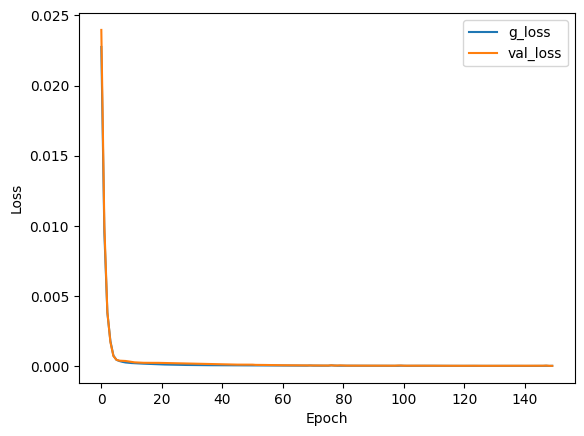

Epoch: 152, d_loss: 0.7158190011978149, d2_loss: 0.18090152740478516, g_loss: 3.983730130130425e-05, val_loss: 4.6208948333514854e-05


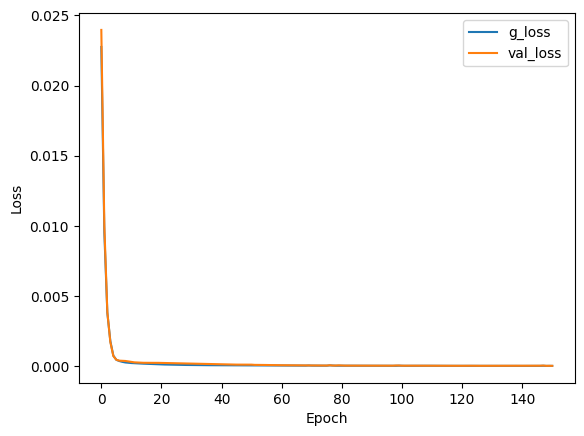

Epoch: 153, d_loss: 0.7151387333869934, d2_loss: 0.17992383241653442, g_loss: 3.962337359553203e-05, val_loss: 4.586997602018528e-05


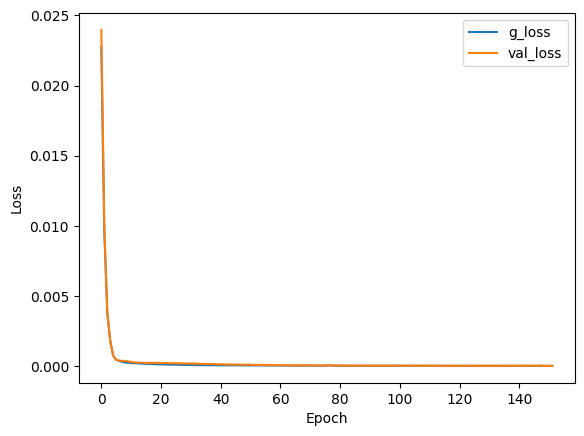

Epoch: 154, d_loss: 0.7144796550273895, d2_loss: 0.17764197289943695, g_loss: 4.021696076961234e-05, val_loss: 4.605795402312651e-05


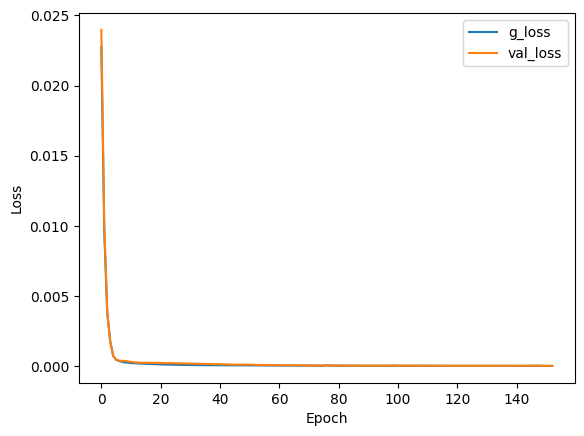

Epoch: 155, d_loss: 0.7138409614562988, d2_loss: 0.1786147803068161, g_loss: 4.038079350721091e-05, val_loss: 4.568344957078807e-05


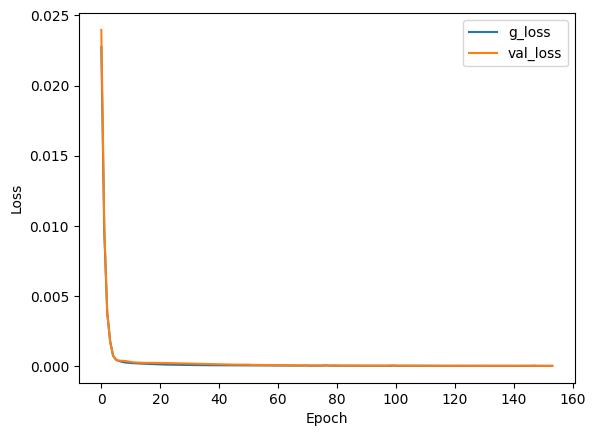

Epoch: 156, d_loss: 0.713222086429596, d2_loss: 0.18158909678459167, g_loss: 3.932505933335051e-05, val_loss: 4.569295924738981e-05


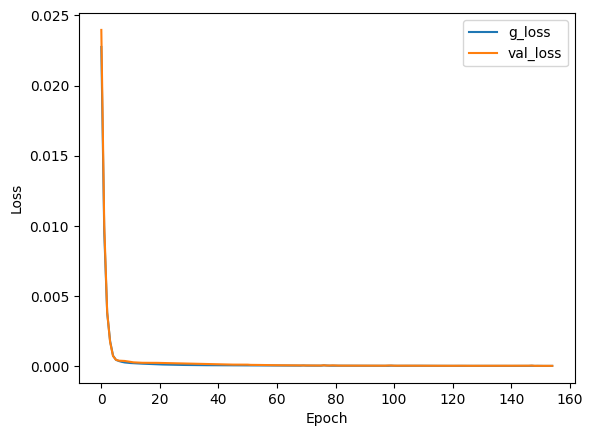

Epoch: 157, d_loss: 0.7126221656799316, d2_loss: 0.1839824914932251, g_loss: 3.912316606147215e-05, val_loss: 4.587602961692028e-05


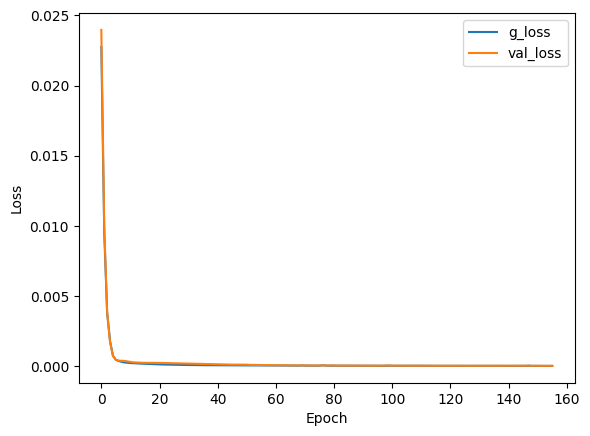

Epoch: 158, d_loss: 0.7120407521724701, d2_loss: 0.18588627874851227, g_loss: 3.97439107473474e-05, val_loss: 4.725894541479647e-05


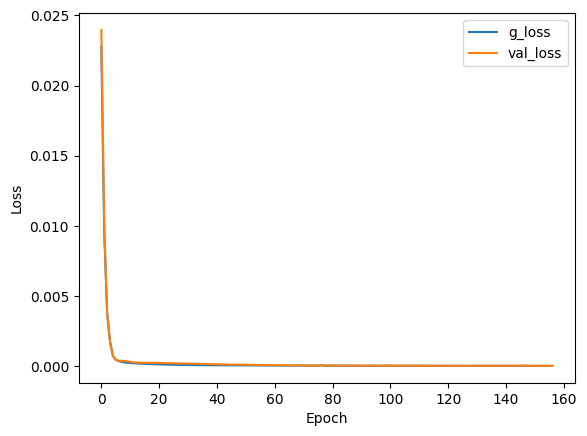

Epoch: 159, d_loss: 0.7114772200584412, d2_loss: 0.18497076630592346, g_loss: 3.9280672353925183e-05, val_loss: 4.646521483664401e-05


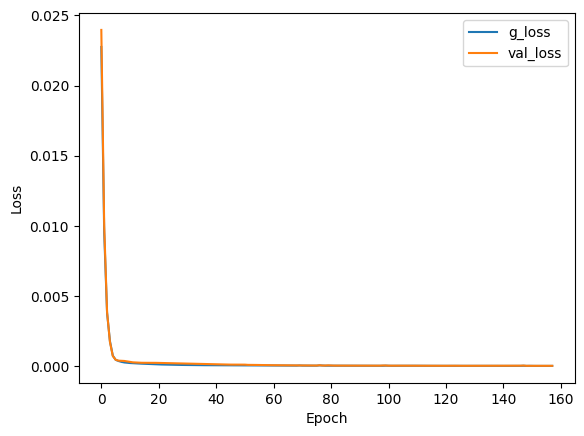

Epoch: 160, d_loss: 0.7109308838844299, d2_loss: 0.1857810914516449, g_loss: 3.9870847103884444e-05, val_loss: 4.762965181726031e-05


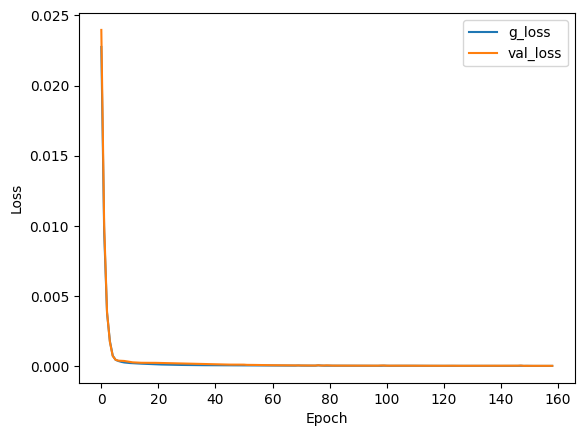

Epoch: 161, d_loss: 0.7104012668132782, d2_loss: 0.18490740656852722, g_loss: 3.961960464948788e-05, val_loss: 4.702515070675872e-05


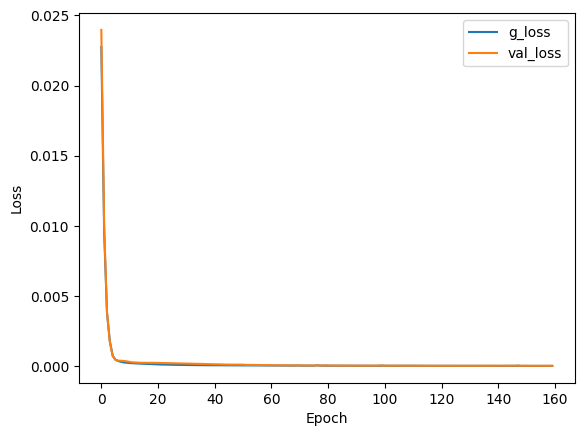

Epoch: 162, d_loss: 0.7098877727985382, d2_loss: 0.18485742807388306, g_loss: 4.0058330341707915e-05, val_loss: 4.759590592584573e-05


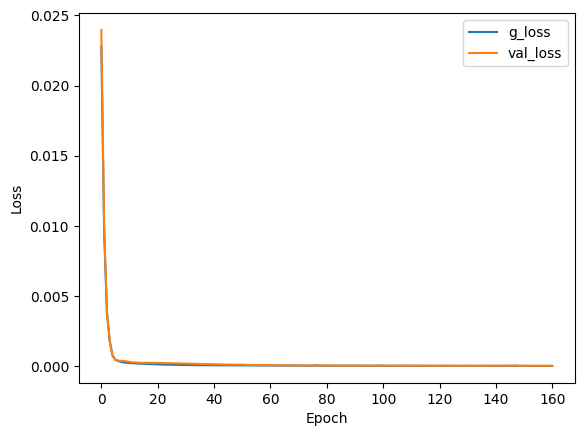

Epoch: 163, d_loss: 0.7093899250030518, d2_loss: 0.18449220061302185, g_loss: 4.06462095270399e-05, val_loss: 4.779642404173501e-05


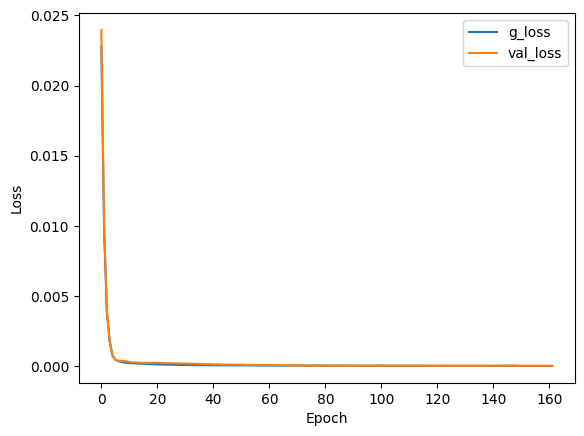

Epoch: 164, d_loss: 0.7089071869850159, d2_loss: 0.1837155967950821, g_loss: 4.138612712267786e-05, val_loss: 4.753465691464953e-05


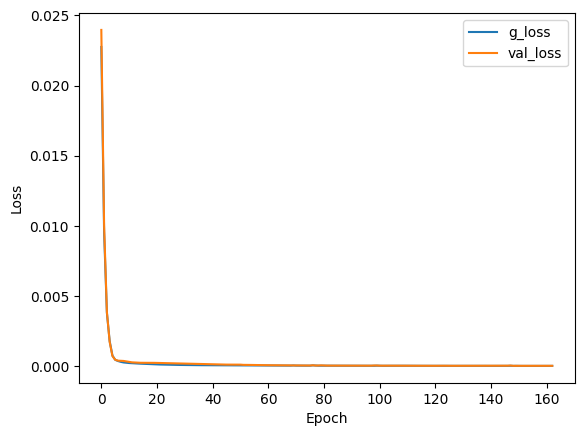

Epoch: 165, d_loss: 0.7084390819072723, d2_loss: 0.18270772695541382, g_loss: 4.3650969018926844e-05, val_loss: 4.736926348414272e-05


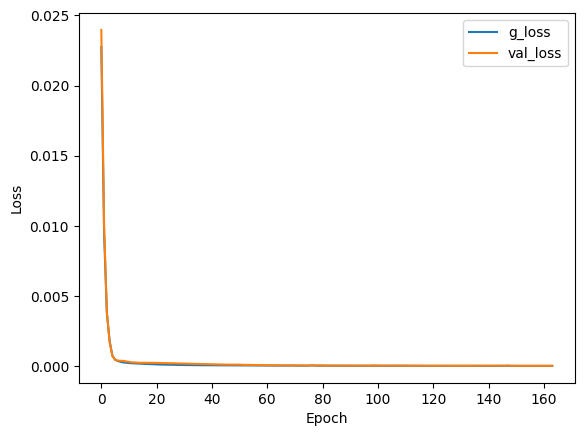

Epoch: 166, d_loss: 0.7079851925373077, d2_loss: 0.17609834671020508, g_loss: 4.060981154907495e-05, val_loss: 4.506964614847675e-05


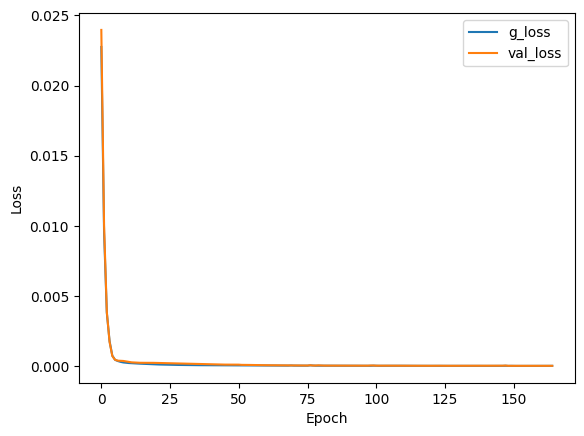

Epoch: 167, d_loss: 0.7075450122356415, d2_loss: 0.1607760488986969, g_loss: 4.674947922467254e-05, val_loss: 4.5610828237840906e-05


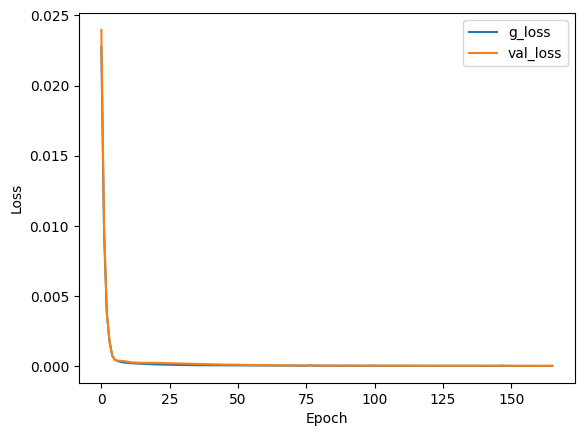

Epoch: 168, d_loss: 0.7071180939674377, d2_loss: 0.16550219058990479, g_loss: 3.931734318030067e-05, val_loss: 4.4735385017702356e-05


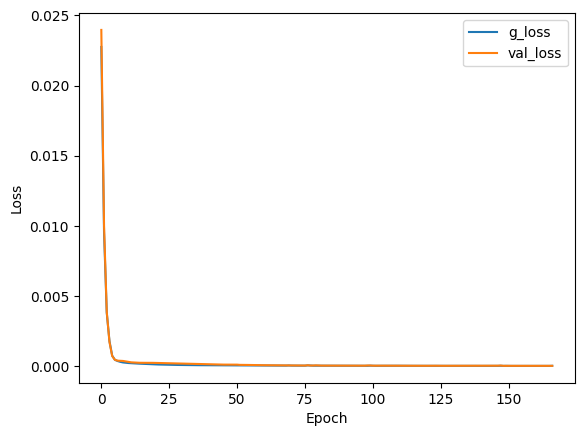

Epoch: 169, d_loss: 0.7067040503025055, d2_loss: 0.16581761837005615, g_loss: 3.972779450123198e-05, val_loss: 4.499006172409281e-05


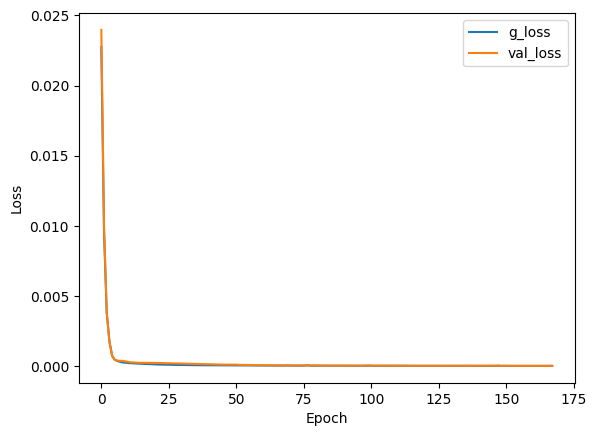

Epoch: 170, d_loss: 0.7063024640083313, d2_loss: 0.16687777638435364, g_loss: 4.062861262355e-05, val_loss: 4.479438575799577e-05


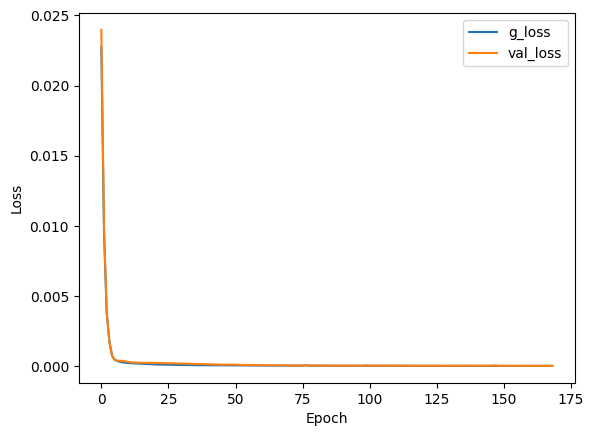

Epoch: 171, d_loss: 0.7059129178524017, d2_loss: 0.16906771063804626, g_loss: 3.9457947423215955e-05, val_loss: 4.433479261933826e-05


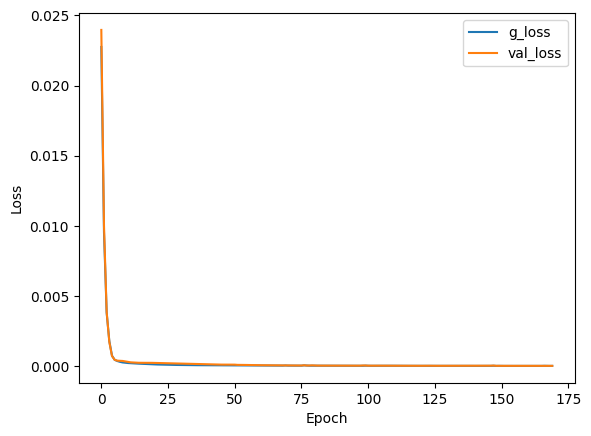

Epoch: 172, d_loss: 0.7055351138114929, d2_loss: 0.1709422618150711, g_loss: 3.828123590210453e-05, val_loss: 4.420588811626658e-05


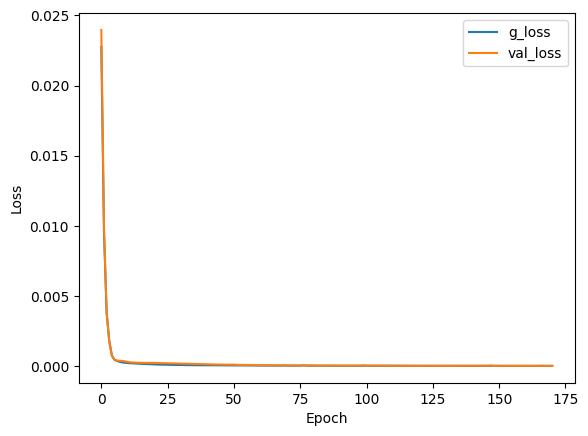

Epoch: 173, d_loss: 0.7051685750484467, d2_loss: 0.17312002182006836, g_loss: 3.758384264074266e-05, val_loss: 4.428973261383362e-05


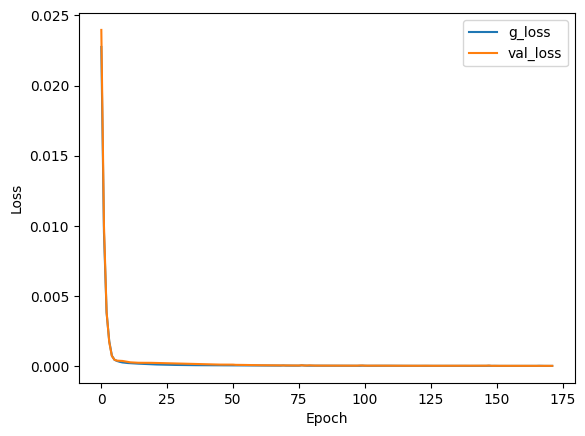

Epoch: 174, d_loss: 0.7048131227493286, d2_loss: 0.1738792359828949, g_loss: 3.7674202758353204e-05, val_loss: 4.418705066200346e-05


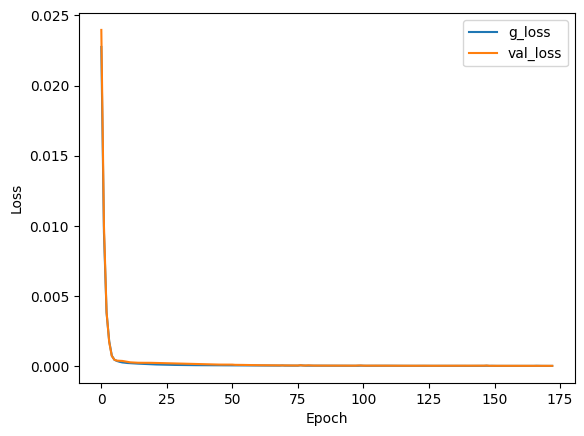

Epoch: 175, d_loss: 0.7044682204723358, d2_loss: 0.17391778528690338, g_loss: 3.781964915106073e-05, val_loss: 4.413486021803692e-05


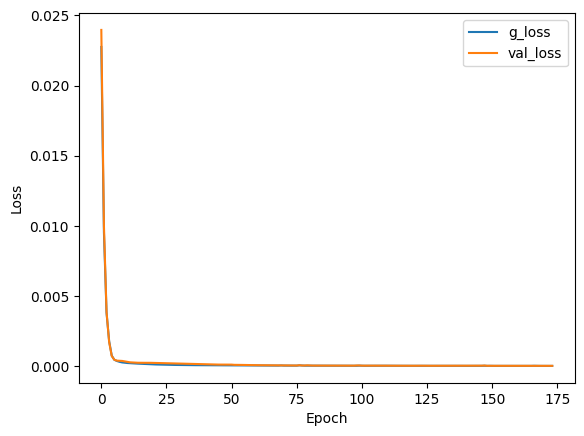

Epoch: 176, d_loss: 0.7041336894035339, d2_loss: 0.17153997719287872, g_loss: 3.739646126632579e-05, val_loss: 4.403819912113249e-05


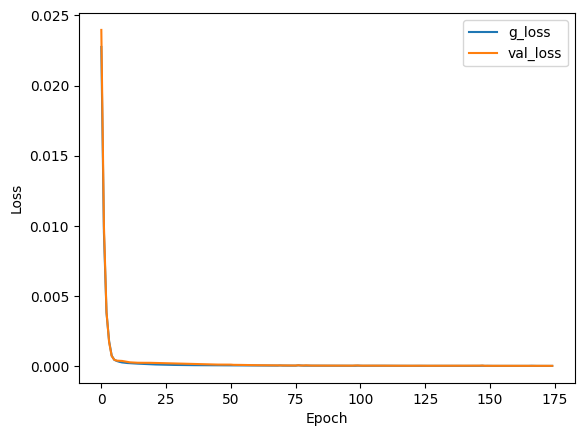

Epoch: 177, d_loss: 0.7038091123104095, d2_loss: 0.1680971384048462, g_loss: 3.805422966252081e-05, val_loss: 4.469091436476447e-05


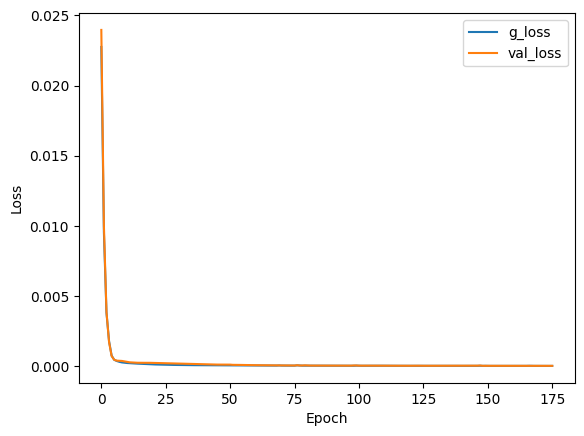

Epoch: 178, d_loss: 0.7034942507743835, d2_loss: 0.16467955708503723, g_loss: 4.2214771383441985e-05, val_loss: 4.4816606532549486e-05


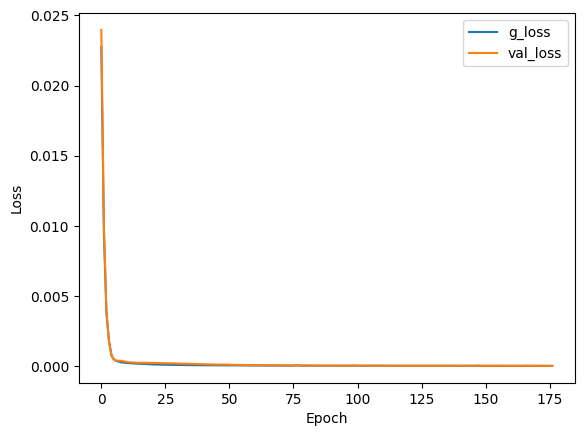

Epoch: 179, d_loss: 0.7031887769699097, d2_loss: 0.16784599423408508, g_loss: 3.944061973015778e-05, val_loss: 4.527950659394264e-05


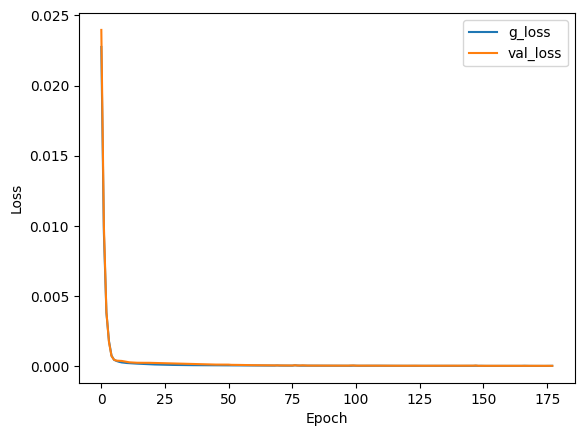

Epoch: 180, d_loss: 0.7028924226760864, d2_loss: 0.16830673813819885, g_loss: 3.750620817299932e-05, val_loss: 4.439915210241452e-05


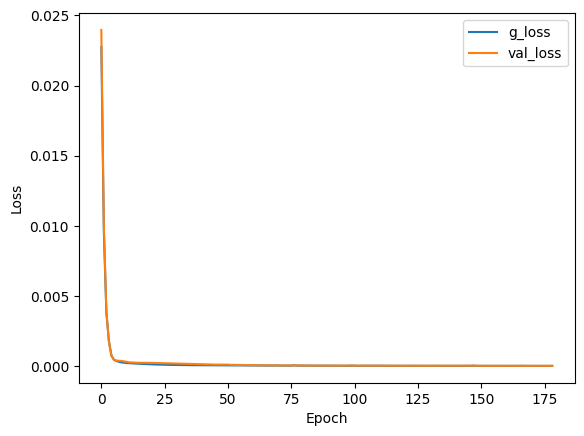

Epoch: 181, d_loss: 0.7026048004627228, d2_loss: 0.17087194323539734, g_loss: 3.6930428905179724e-05, val_loss: 4.460368290892802e-05


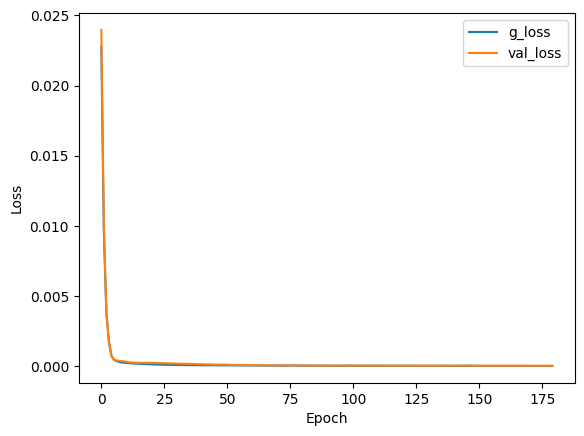

Epoch: 182, d_loss: 0.702325850725174, d2_loss: 0.17158350348472595, g_loss: 3.708620715769939e-05, val_loss: 4.45530895376578e-05


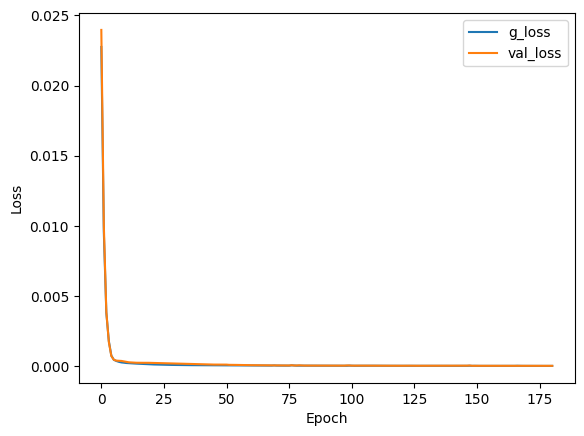

Epoch: 183, d_loss: 0.7020551264286041, d2_loss: 0.17186212539672852, g_loss: 3.7124642403796315e-05, val_loss: 4.448304753168486e-05


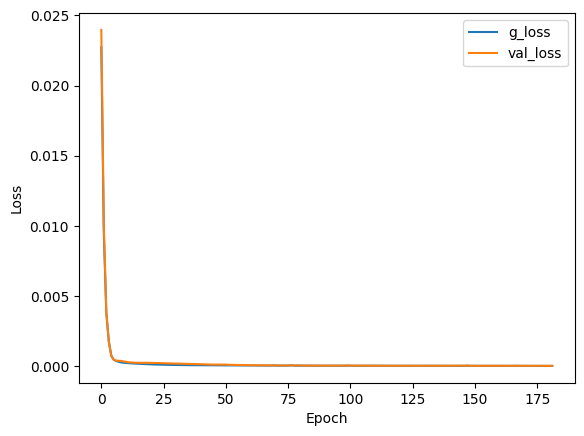

Epoch: 184, d_loss: 0.7017924189567566, d2_loss: 0.17222493886947632, g_loss: 3.743731576832943e-05, val_loss: 4.438376345206052e-05


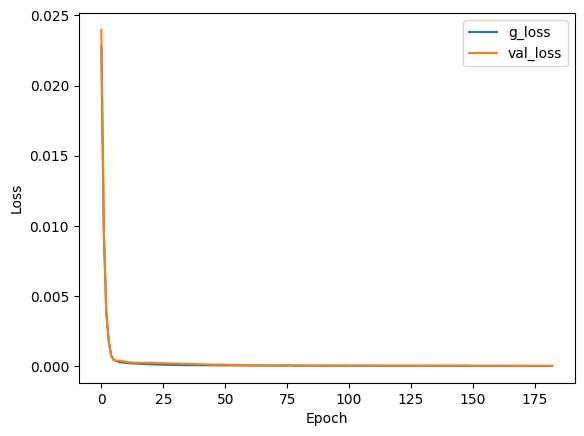

Epoch: 185, d_loss: 0.7015375792980194, d2_loss: 0.1718849539756775, g_loss: 3.780114639084786e-05, val_loss: 4.4518066715681925e-05


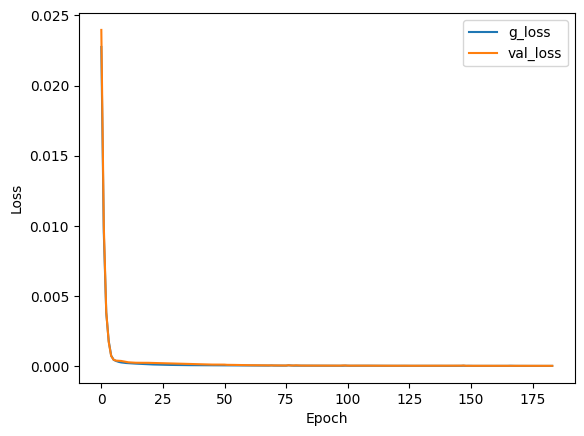

Epoch: 186, d_loss: 0.7012902498245239, d2_loss: 0.1707409918308258, g_loss: 3.769998511415906e-05, val_loss: 4.378528319648467e-05


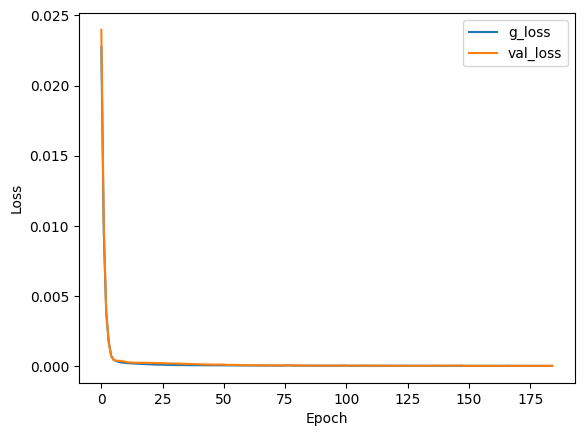

Epoch: 187, d_loss: 0.701050341129303, d2_loss: 0.16849882900714874, g_loss: 3.7685407733079046e-05, val_loss: 4.328582508605905e-05


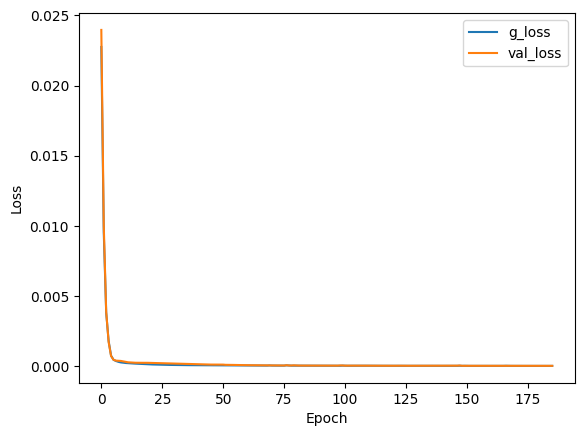

Epoch: 188, d_loss: 0.7008175253868103, d2_loss: 0.16075661778450012, g_loss: 3.728884621523321e-05, val_loss: 4.4670738134300336e-05


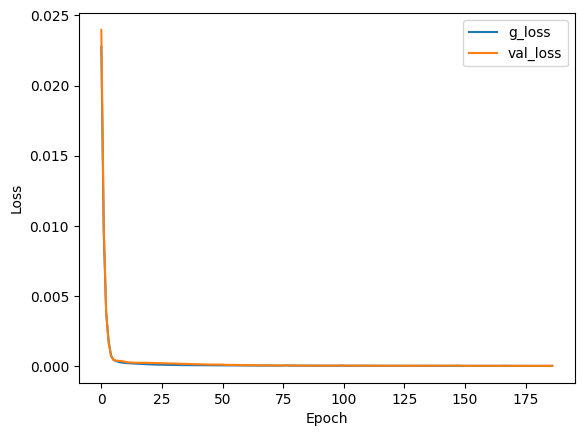

Epoch: 189, d_loss: 0.700591504573822, d2_loss: 0.15555329620838165, g_loss: 4.390678077470511e-05, val_loss: 4.378767334856093e-05


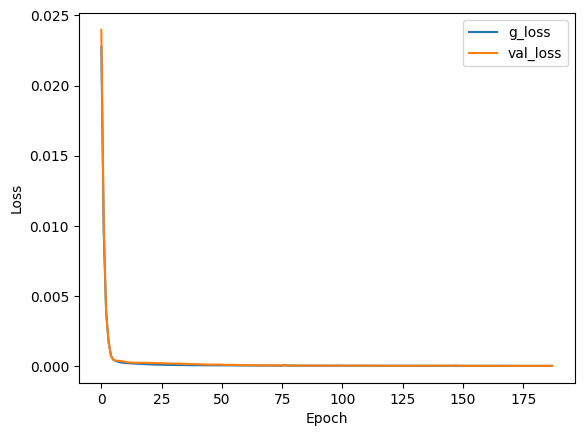

Epoch: 190, d_loss: 0.7003722786903381, d2_loss: 0.16031810641288757, g_loss: 3.818050754489377e-05, val_loss: 4.4898530177306384e-05


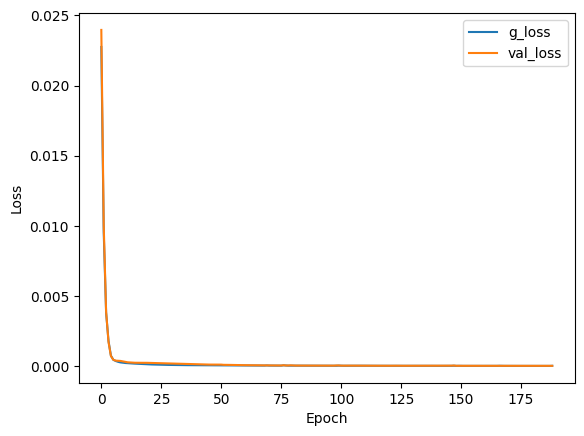

Epoch: 191, d_loss: 0.7001595497131348, d2_loss: 0.15981723368167877, g_loss: 3.756068690563552e-05, val_loss: 4.3036536226281896e-05


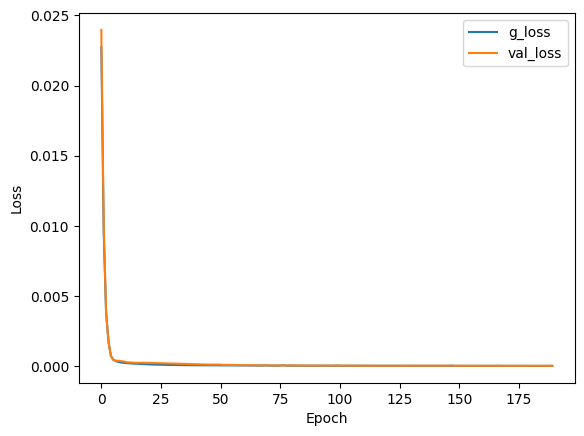

Epoch: 192, d_loss: 0.6999530792236328, d2_loss: 0.1598168909549713, g_loss: 3.722247129189782e-05, val_loss: 4.3101110350107774e-05


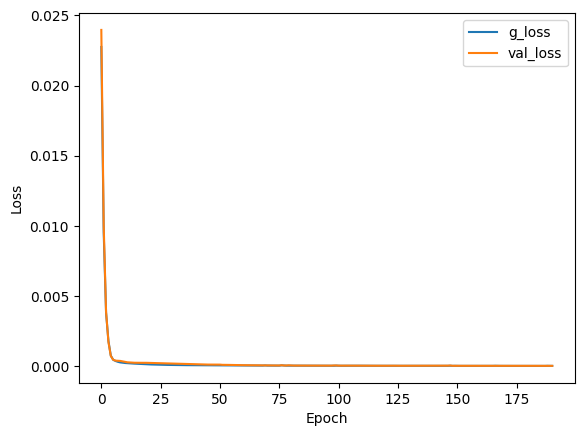

Epoch: 193, d_loss: 0.6997527480125427, d2_loss: 0.15882030129432678, g_loss: 3.8255595427472144e-05, val_loss: 4.284615715732798e-05


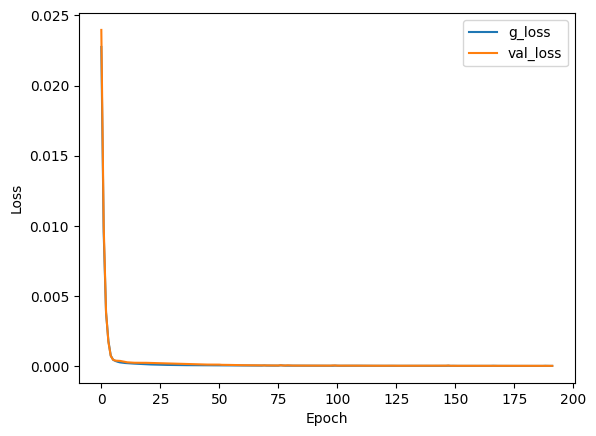

Epoch: 194, d_loss: 0.6995583474636078, d2_loss: 0.15947043895721436, g_loss: 3.8106838474050164e-05, val_loss: 4.28344719693996e-05


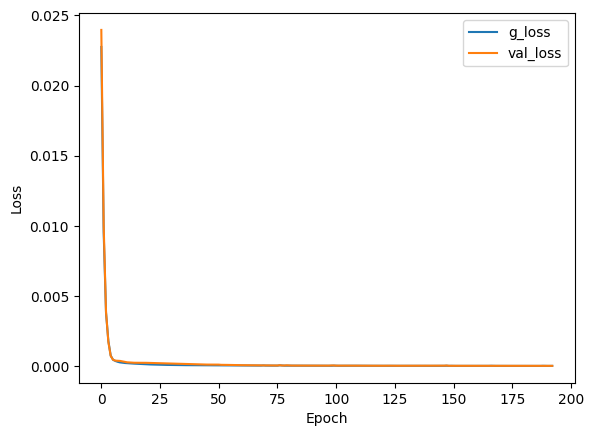

Epoch: 195, d_loss: 0.6993696391582489, d2_loss: 0.15972860157489777, g_loss: 3.772831041715108e-05, val_loss: 4.292878293199465e-05


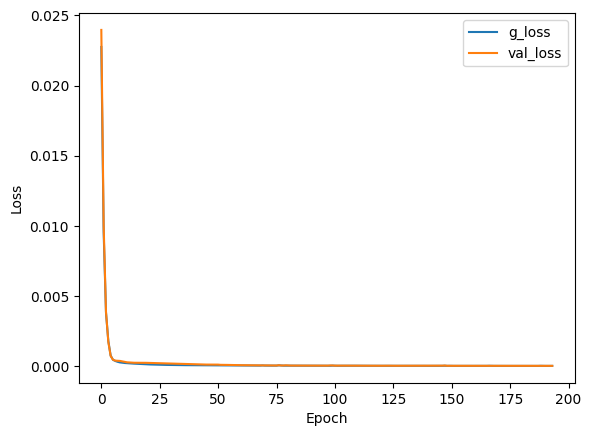

Epoch: 196, d_loss: 0.6991865634918213, d2_loss: 0.16034018993377686, g_loss: 3.6691453715320677e-05, val_loss: 4.3493168050190434e-05


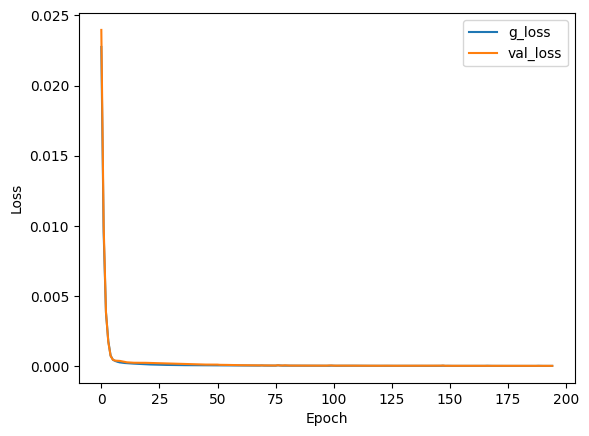

Epoch: 197, d_loss: 0.6990088522434235, d2_loss: 0.1602020114660263, g_loss: 3.6186880606692284e-05, val_loss: 4.371367322164588e-05


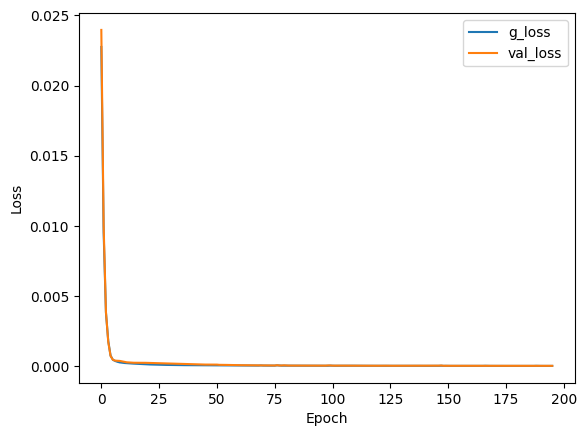

Epoch: 198, d_loss: 0.6988364160060883, d2_loss: 0.15964967012405396, g_loss: 3.596251553972252e-05, val_loss: 4.395486757857725e-05


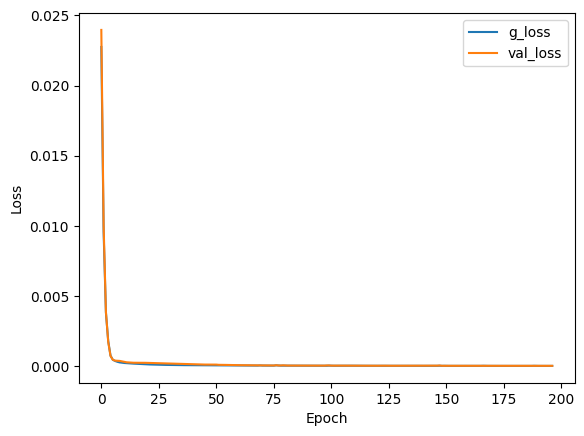

Epoch: 199, d_loss: 0.6986691355705261, d2_loss: 0.1585610806941986, g_loss: 3.603659934015013e-05, val_loss: 4.382378392620012e-05


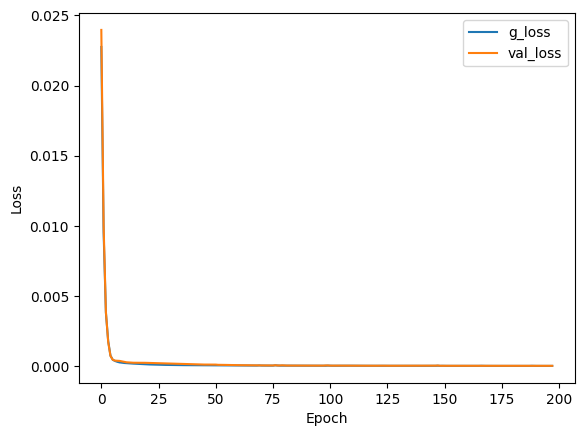

Epoch: 200, d_loss: 0.6985067129135132, d2_loss: 0.1567980945110321, g_loss: 3.636024484876543e-05, val_loss: 4.3765314330812544e-05


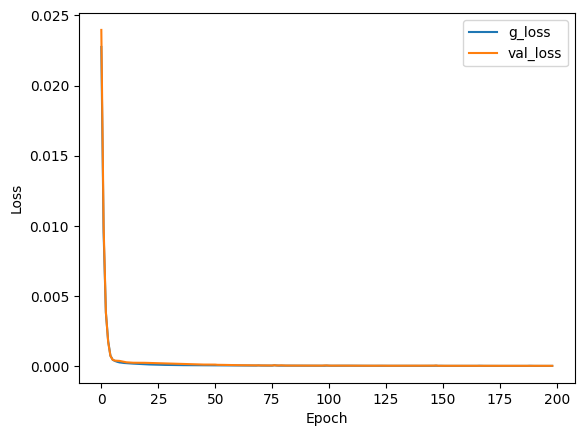

In [19]:
import matplotlib.pyplot as plt
from keras.callbacks import EarlyStopping, ModelCheckpoint

d_loss_list = []
d2_loss_list = []
g_loss_list = []
val_loss_list = []

fig, ax = plt.subplots()
ax.set_xlabel('Epoch')
ax.set_ylabel('Loss')


g_loss_list.append(0)
val_loss_list.append(0)

for epoch in range(200):
    fig, ax = plt.subplots()
    ax.set_xlabel('Epoch')
    ax.set_ylabel('Loss')
    for i in range(0, len(train_x), 32):
        real_imgs = train_x[i:i+32]
        fake_imgs = autoencoder.predict(train_x[i:i+32])
        d_loss_real = discriminator_1.train_on_batch(real_imgs, valid[i:i+32])
        d_loss_fake = discriminator_1.train_on_batch(fake_imgs, fake[i:i+32])
        d_loss = 0.5 * np.add(d_loss_real, d_loss_fake)
        d2_loss = discriminator_2.train_on_batch(fake_imgs, encoder.predict(real_imgs))
        g_loss = autoencoder.train_on_batch(real_imgs, real_imgs)
    
    d_loss_list.append(d_loss)
    d2_loss_list.append(d2_loss)
    g_loss_list.append(g_loss)
    val_loss = autoencoder.evaluate(val_x, val_x, verbose=0)
    val_loss_metric = val_loss
    val_loss_list.append(val_loss_metric)
    print(f'Epoch: {epoch+1}, d_loss: {d_loss}, d2_loss: {d2_loss}, g_loss: {g_loss}, val_loss: {val_loss_metric}')
    ax.plot(range(epoch), g_loss_list[1:epoch+1], label='g_loss')
    ax.plot(range(epoch), val_loss_list[1:epoch+1], label='val_loss')
    ax.legend()
    plt.pause(0.05)

plt.show()


In [12]:
from keras.callbacks import EarlyStopping, ModelCheckpoint

d_loss_list = []
d2_loss_list = []
g_loss_list = []
val_loss_list = []


for epoch in range(200):
    for i in range(0, len(train_x), 32):
        real_imgs = train_x[i:i+32]
        fake_imgs = autoencoder.predict(train_x[i:i+32])
        d_loss_real = discriminator_1.train_on_batch(real_imgs, valid[i:i+32])
        d_loss_fake = discriminator_1.train_on_batch(fake_imgs, fake[i:i+32])
        d_loss = 0.5 * np.add(d_loss_real, d_loss_fake)
        d2_loss = discriminator_2.train_on_batch(fake_imgs, encoder.predict(real_imgs))
        g_loss = autoencoder.train_on_batch(real_imgs, real_imgs)
    
    d_loss_list.append(d_loss)
    d2_loss_list.append(d2_loss)
    g_loss_list.append(g_loss)
    val_loss = autoencoder.evaluate(val_x, val_x, verbose=0)
    val_loss_metric = val_loss  # Extract the specific loss metric (e.g., mean squared error)
    val_loss_list.append(val_loss_metric)
    print(f'Epoch: {epoch+1}, d_loss: {d_loss}, d2_loss: {d2_loss}, g_loss: {g_loss[0]}, val_loss: {val_loss_metric}')



TypeError: 'float' object is not subscriptable

In [115]:
d_loss_list = []
d2_loss_list = []
g_loss_list = []
for epoch in range(200):
    for i in range(0, len(train_x), 32):
        real_imgs = train_x[i:i+32]
        fake_imgs = autoencoder.predict(train_x[i:i+32])
        d_loss_real = discriminator_1.train_on_batch(real_imgs, valid[i:i+32])
        d_loss_fake = discriminator_1.train_on_batch(fake_imgs, fake[i:i+32])
        d_loss = 0.5 * np.add(d_loss_real, d_loss_fake)
        d2_loss = discriminator_2.train_on_batch(fake_imgs, encoder.predict(real_imgs))
        g_loss = autoencoder.train_on_batch(real_imgs, real_imgs)
    d_loss_list.append(d_loss)
    d2_loss_list.append(d2_loss)
    g_loss_list.append(g_loss)
    print(f'epoch: {epoch+1}, d_loss: {d_loss}, d2_loss: {d2_loss}, g_loss: {g_loss}')
    

epoch: 1, d_loss: 1.346178302992345e-13, d2_loss: 0.017129644751548767, g_loss: 0.013417884707450867
epoch: 2, d_loss: 5.570173116284821e-17, d2_loss: 0.03000742197036743, g_loss: 0.011022167280316353
epoch: 3, d_loss: 1.6491617377611629e-15, d2_loss: 0.055536121129989624, g_loss: 0.009332200512290001
epoch: 4, d_loss: 8.381964463841681e-12, d2_loss: 0.06163203343749046, g_loss: 0.0077509209513664246
epoch: 5, d_loss: 1.620992861723386e-06, d2_loss: 0.0748792290687561, g_loss: 0.0063206227496266365
epoch: 6, d_loss: 0.0006683512480744565, d2_loss: 0.08228068053722382, g_loss: 0.004839437082409859
epoch: 7, d_loss: 0.0007347917536524307, d2_loss: 0.09734150022268295, g_loss: 0.003890105988830328
epoch: 8, d_loss: 0.00018249792401547893, d2_loss: 0.11808184534311295, g_loss: 0.003197593381628394
epoch: 9, d_loss: 0.00013611093163490295, d2_loss: 0.1323135495185852, g_loss: 0.0026612323708832264
epoch: 10, d_loss: 0.0004221288545522839, d2_loss: 0.14261476695537567, g_loss: 0.002300234045

epoch: 82, d_loss: 0.0031020025489851832, d2_loss: 0.22044534981250763, g_loss: 0.00015243895177263767
epoch: 83, d_loss: 0.0030242499196901917, d2_loss: 0.22038494050502777, g_loss: 0.00015130205429159105
epoch: 84, d_loss: 0.002968801069073379, d2_loss: 0.22030925750732422, g_loss: 0.00015020673163235188
epoch: 85, d_loss: 0.002920710132457316, d2_loss: 0.2203022688627243, g_loss: 0.00014912158076185733
epoch: 86, d_loss: 0.0028750604251399636, d2_loss: 0.22029119729995728, g_loss: 0.0001480987702962011
epoch: 87, d_loss: 0.0028273287462070584, d2_loss: 0.2202909141778946, g_loss: 0.00014710688265040517
epoch: 88, d_loss: 0.002775570610538125, d2_loss: 0.2202763855457306, g_loss: 0.0001461563224438578
epoch: 89, d_loss: 0.00271839601919055, d2_loss: 0.22026468813419342, g_loss: 0.0001452238648198545
epoch: 90, d_loss: 0.002659352496266365, d2_loss: 0.22023150324821472, g_loss: 0.0001443316286895424
epoch: 91, d_loss: 0.0025843961630016565, d2_loss: 0.22018903493881226, g_loss: 0.0001

epoch: 162, d_loss: 0.00031269244209397584, d2_loss: 0.24145734310150146, g_loss: 0.00010545333498157561
epoch: 163, d_loss: 0.00025671425100881606, d2_loss: 0.24447721242904663, g_loss: 0.00010491270950296894
epoch: 164, d_loss: 0.00024208283866755664, d2_loss: 0.24540625512599945, g_loss: 0.00010532256419537589
epoch: 165, d_loss: 0.00025287296739406884, d2_loss: 0.2449868619441986, g_loss: 0.00010380219464423135
epoch: 166, d_loss: 0.000306610505504068, d2_loss: 0.24234691262245178, g_loss: 0.00010642508277669549
epoch: 167, d_loss: 0.000276213697361527, d2_loss: 0.24398432672023773, g_loss: 0.00010375893907621503
epoch: 168, d_loss: 0.0002339817292522639, d2_loss: 0.24649196863174438, g_loss: 0.00010320291039533913
epoch: 169, d_loss: 0.0002122327423421666, d2_loss: 0.24790383875370026, g_loss: 0.00010436706361360848
epoch: 170, d_loss: 0.00022828090004622936, d2_loss: 0.24709179997444153, g_loss: 0.00010227078746538609
epoch: 171, d_loss: 0.00025665494831628166, d2_loss: 0.2456528

In [32]:
d_loss_list = []
d2_loss_list = []
g_loss_list = []

for epoch in range(200):
    for i in range(0, len(train_x), 32):
        real_imgs = train_x[i:i+32]
        fake_imgs = autoencoder.predict(train_x[i:i+32])
        d_loss_real = discriminator_1.train_on_batch(real_imgs, valid[i:i+32])
        d_loss_fake = discriminator_1.train_on_batch(fake_imgs, fake[i:i+32])
        d_loss = 0.5 * np.add(d_loss_real, d_loss_fake)
        d2_loss = discriminator_2.train_on_batch(fake_imgs, encoder.predict(real_imgs))
        g_loss = autoencoder.train_on_batch(real_imgs, real_imgs)
        autoencoder.train_on_batch(real_imgs, real_imgs, total_loss)
    vall = autoencoder.evaluate(val_x,val_x)
    d_loss_list.append(d_loss)
    d2_loss_list.append(d2_loss)
    g_loss_list.append(g_loss)
    print(f'epoch: {epoch+1}, d_loss: {d_loss}, d2_loss: {d2_loss}, g_loss: {g_loss}')
    

2/2 [==============================] - 0s 13ms/step - loss: 0.0157
epoch: 1, d_loss: 1.3060250648433396, d2_loss: 0.71305251121521, g_loss: 0.010529808700084686
2/2 [==============================] - 0s 12ms/step - loss: 0.0030
epoch: 2, d_loss: 0.9805779010057449, d2_loss: 1.078013300895691, g_loss: 0.003208148293197155
2/2 [==============================] - 0s 12ms/step - loss: 8.2643e-04
epoch: 3, d_loss: 0.1630948670208454, d2_loss: 0.5604592561721802, g_loss: 0.0008224857738241553
2/2 [==============================] - 0s 12ms/step - loss: 5.3102e-04
epoch: 4, d_loss: 0.0012576999142765999, d2_loss: 0.5096608996391296, g_loss: 0.0005023799603804946
2/2 [==============================] - 0s 12ms/step - loss: 3.9092e-04
epoch: 5, d_loss: 0.011430046986788511, d2_loss: 0.5182195901870728, g_loss: 0.0003748277376871556


KeyboardInterrupt: 

In [33]:
X_test_recon = autoencoder.predict(bad_dataset)

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


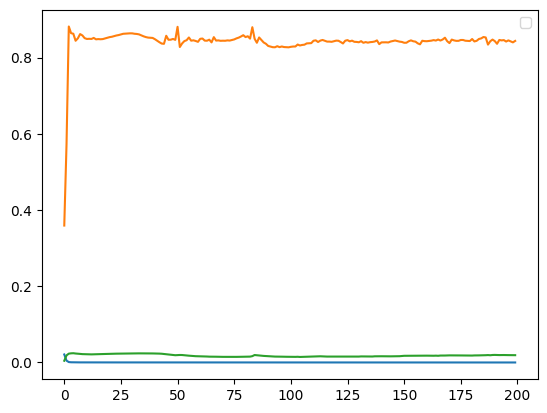

In [15]:
plt.plot(g_loss_list)
plt.plot(val_loss_list)
plt.legend()
plt.show()

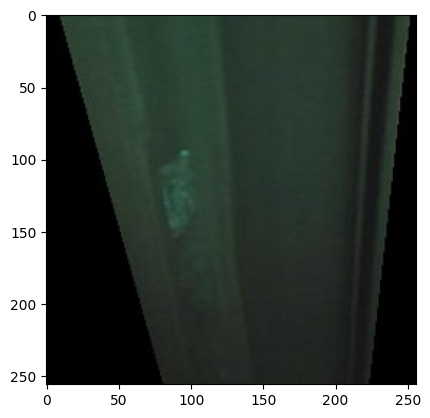

In [35]:
plt.imshow(bad_dataset[5])

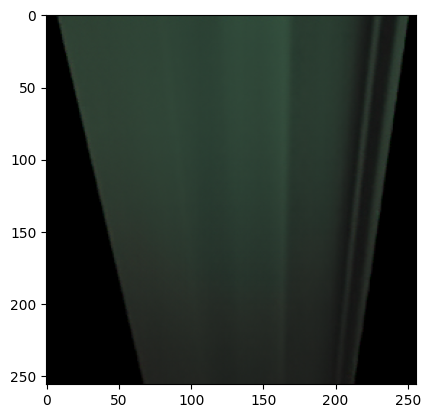

In [36]:
plt.imshow(X_test_recon[5])

In [30]:
X_good_recon = autoencoder.predict(test_good_x)

In [36]:
val_recon =  autoencoder.predict(val_x)

In [32]:
def anomaly_map_val(inp, outp):
    inp_gray = np.mean(inp, axis=2)
    outp_gray = np.mean(outp, axis=2)
    re = np.abs(inp - outp)
    re = np.mean(re, axis=-1, keepdims=True)
    re.shape
    inp_blurred = cv2.GaussianBlur(inp_gray, (3, 3), 0)
    thresh = filters.threshold_otsu(inp_blurred - 0.035)
    binary_image = (inp_blurred > thresh).astype(np.uint8) * 255
    contours, hierarchy = cv2.findContours(binary_image, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    black = np.zeros_like(inp_gray)
    contour = cv2.drawContours(binary_image, contours, -1, (0, 0, 0), 2)
    contour_array = np.asarray(contour)
    for i in range (re.shape[0]):
        for j in range (re.shape[0]):
            if contour_array[i,j] == 0:
                re[i,j] = 0 
    return re

In [34]:
from skimage import measure, filters
def anomaly_map_val(inp, outp):
    inp_gray = np.mean(inp, axis=2)
    outp_gray = np.mean(outp, axis=2)
    re = np.abs(inp - outp)
    re = np.mean(re, axis=-1, keepdims=True)
    re.shape
    inp_blurred = cv2.GaussianBlur(inp_gray, (3, 3), 0)
    thresh = filters.threshold_otsu(inp_blurred - 0.03)
    binary_image = (inp_blurred > thresh).astype(np.uint8) * 255
    contours, hierarchy = cv2.findContours(binary_image, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    black = np.zeros_like(inp_gray)
    contour = cv2.drawContours(black, contours, -1, (255, 255, 255), 2)
    contour_array = np.asarray(contour)
    for i in range (re.shape[0]):
        for j in range (re.shape[0]):
            if contour_array[i,j] == 255:
                re[i,j] = 0 
    return re

In [37]:
val_recon_error = []
for i in range (val_x.shape[0]):
    val_recon_error.append(anomaly_map_val(val_x[i], val_recon[i]))
val_recon_error = np.array(val_recon_error)


In [38]:
maxvalues = [np.max(val_recon_error[i].flatten()) for i in range(val_recon_error.shape[0])]
maxvalues = np.array(maxvalues)

In [39]:
import numpy as np
from scipy import stats

# Calculate the mean and standard deviation of the dataset
mean = np.mean(maxvalues)
std = np.std(maxvalues)

# Define the threshold for anomalies
threshold = mean + 3 * std  # Adjust the multiplier as needed

# Perform Z-test for each value in the dataset
z_scores = (maxvalues - mean) / std

# Identify anomalies based on the threshold
anomalies = maxvalues[z_scores > threshold]

# Print the anomalies
print("Anomalies:", anomalies)
maxvalues = maxvalues[z_scores <= threshold]

# Print the non-anomalous values
print("Non-anomalous values:", maxvalues)

Anomalies: [0.11903318 0.1296643  0.10315087 0.14152274 0.14431588 0.13550116
 0.09875766 0.198317   0.28857365 0.14190453 0.09915053 0.10350937]
Non-anomalous values: [0.0608368  0.06745529 0.05542941 0.06966005 0.08007    0.07624131
 0.06563511 0.09374384 0.07626385 0.06028548 0.07464326 0.05602609
 0.07624394 0.08272466 0.06640913 0.08267512 0.09055845 0.06196331
 0.0649946  0.08602039 0.06508043 0.0913677  0.07182559 0.07293407
 0.05756803 0.07828396 0.08308288 0.09735709 0.06918209 0.08049175
 0.0621042  0.061894   0.06728693 0.06669237 0.06139432 0.08093942
 0.09816692 0.07604573]


In [40]:
from scipy import stats
maxvalues = np.array(maxvalues)
def get_best_distribution(data):
    dist_names = ['gamma', 'expon', 'lognorm', 'weibull_max', 'weibull_min', 'pareto', 'norm']
    dist_results = []
    params = {}

    for dist_name in dist_names:
        dist = getattr(stats, dist_name)
        param = dist.fit(data)

        params[dist_name] = param
        # Applying the Kolmogorov-Smirnov test
        D, p = stats.kstest(data, dist_name, args=param)
        dist_results.append((dist_name, p))

    best_dist, best_p = max(dist_results, key=lambda x: x[1])

    return best_dist, params[best_dist]

best_dist, best_params = get_best_distribution(maxvalues)
print("Best distribution:", best_dist)
print("Best distribution parameters:", best_params)




Best distribution: lognorm
Best distribution parameters: (0.32695380202359425, 0.03779160344760828, 0.03379702383533986)


/home/aaslan/venv-jupyter-310/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:2407: RuntimeWarning: invalid value encountered in double_scalars
  Lhat = muhat - Shat*mu


In [41]:
def get_threshold_from_distribution(distribution, percentile):
    dist = getattr(stats, distribution)
    threshold = dist.ppf(percentile/100, *best_params)
    return threshold


best_dist = best_dist # Replace with the best-fitting distribution
best_params = (best_params[0], best_params[1], best_params[2])  # Replace with the best-fitting distribution parameters
percentile = 90  # Specify the desired percentile

threshold = get_threshold_from_distribution(best_dist, percentile) 
print("Threshold at {}th percentile: {}".format(percentile, threshold))

Threshold at 90th percentile: 0.08917838151089294


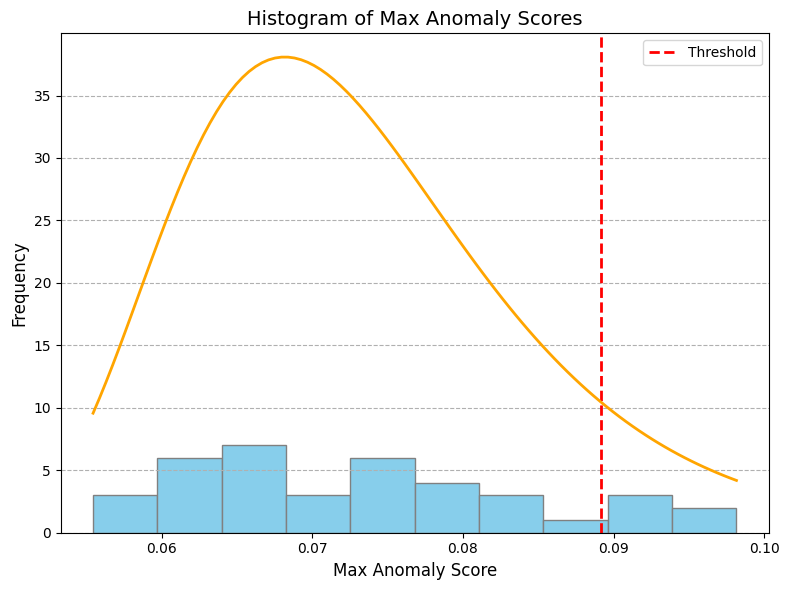

In [42]:
import numpy as np
import matplotlib.pyplot as plt
from scipy import stats


# Calculate the lognormal distribution parameters (replace with your values)
shape_param = best_params[0]
loc_param = best_params[1]
scale_param = best_params[2]

# Plot the histogram
plt.figure(figsize=(8, 6))
plt.hist(maxvalues, bins=10, color='skyblue', edgecolor='gray')
plt.axvline(x=threshold, color='r', linestyle='--', linewidth=2)
plt.xlabel('Max Anomaly Score', fontsize=12)
plt.ylabel('Frequency', fontsize=12)
plt.title('Histogram of Max Anomaly Scores', fontsize=14)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)
plt.grid(axis='y', linestyle='--')
plt.legend(['Threshold'], fontsize=10)

# Plot the lognormal distribution PDF
x = np.linspace(min(maxvalues), max(maxvalues), 100)
pdf = stats.lognorm.pdf(x, shape_param, loc=loc_param, scale=scale_param)
plt.plot(x, pdf, color='orange', linewidth=2)

plt.tight_layout()
plt.show()


In [30]:
from skimage import filters
def anomaly_map_with_contours(inp, outp):
    inp_gray = np.mean(inp, axis=2)
    outp_gray = np.mean(outp, axis=2)
    re = np.abs(inp - outp)
    re = np.mean(re, axis=-1, keepdims=True)
    inp_blurred = cv2.GaussianBlur(inp_gray, (3, 3), 0)
    thresh = filters.threshold_otsu(inp_blurred - 0.03)
    binary_image = (inp_blurred > thresh).astype(np.uint8) * 255
    contours, hierarchy = cv2.findContours(binary_image, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    black = np.zeros_like(inp_gray)
    contour = cv2.drawContours(binary_image, contours, -1, (0, 0, 0), 2)
    contour_array = np.asarray(contour)
    
    # Calculate the anomaly map excluding the contours
    anomaly_map = np.zeros_like(inp_gray)
    contour = contour.astype(np.int8)
    for i in range(anomaly_map.shape[0]):
        for j in range(anomaly_map.shape[1]):
            if contour_array[i,j] == 0:
                anomaly_map[i, j] = 0

            else:
                if re[i, j] >= threshold:
                    anomaly_map[i, j] = 1

    return anomaly_map


In [30]:
def anomaly_map_with_contours(inp, outp):
    inp_gray = np.mean(inp, axis=2)
    outp_gray = np.mean(outp, axis=2)
    re = np.abs(inp - outp)
    re = np.mean(re, axis=-1, keepdims=True)
    inp_blurred = cv2.GaussianBlur(inp_gray, (3, 3), 0)
    thresh = filters.threshold_otsu(inp_blurred - 0.03)
    binary_image = (inp_blurred > thresh).astype(np.uint8) * 255
    contours, hierarchy = cv2.findContours(binary_image, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    black = np.zeros_like(inp_gray)
    contour = cv2.drawContours(black, contours, -1, (255, 255, 255), 2)
    contour_array = np.asarray(contour)
    
    # Calculate the anomaly map excluding the contours
    anomaly_map = np.zeros_like(inp_gray)
    contour = contour.astype(np.int8)
    for i in range(anomaly_map.shape[0]):
        for j in range(anomaly_map.shape[1]):
            if contour_array[i,j] == 255:
                anomaly_map[i, j] = 0

            else:
                if re[i, j] >= threshold:
                    anomaly_map[i, j] = 1

    return anomaly_map


In [35]:
def anomaly_map_roc(inp, outp):
    inp_gray = np.mean(inp, axis=2)
    outp_gray = np.mean(outp, axis=2)
    re = np.abs(inp - outp)**2
    re = np.mean(re, axis=-1, keepdims=True)
    inp_blurred = cv2.GaussianBlur(inp_gray, (3, 3), 0)
    thresh = filters.threshold_otsu(inp_blurred - 0.035)
    binary_image = (inp_blurred > thresh).astype(np.uint8) * 255
    contours, hierarchy = cv2.findContours(binary_image, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    black = np.zeros_like(inp_gray)
    contour = cv2.drawContours(binary_image, contours, -1, (0, 0, 0), 2)
    contour_array = np.asarray(contour)
    for i in range (re.shape[0]):
        for j in range (re.shape[0]):
            if contour_array[i,j] == 0:
                re[i,j] = 0
    min_value = np.min(re)  
    max_value = np.max(re) 
    recon_error = re 
    normalized_x = (recon_error - min_value) / (max_value - min_value)
    anomaly_map = (recon_error - np.min(recon_error)) / (np.max(recon_error) - np.min(recon_error))
    return anomaly_map

In [36]:
result = []
for i in range(bad_dataset.shape[0]):
    result.append(anomaly_map_roc(bad_dataset[i], X_test_recon[i]))
result = np.array(result)

In [50]:
result = []
for i in range(bad_dataset.shape[0]):
    result.append(anomaly_map_with_contours(bad_dataset[i], X_test_recon[i]))
result = np.array(result)

NameError: name 'anomaly_map_with_contours' is not defined

In [38]:
import os
import cv2

output_dir = 'outauto'
o_2 = 'org'

for i in range (result.shape[0]):
    file_name = f"{i}.png"
    n_2 = f"{i}.png"

    file_path = os.path.join(output_dir, file_name)  # Combine directory path and file name
    file_path_2 = os.path.join(o_2, n_2)

    cv2.imwrite(file_path, result[i]*255)

In [39]:
import shutil

def zip_file(file_path, zip_path):
    shutil.make_archive(zip_path, 'zip', file_path)

# Specify the file path and the desired zip file path
file_path = 'outauto'
zip_path = 'auto'

# Call the function to create the zip file
zip_file(file_path, zip_path)


In [29]:
def anomaly_map_1(inp, outp):
    re = np.abs(inp - outp)
    min_value = np.min(re)  # Calculate min_value based on inp array
    max_value = np.max(re)  # Calculate max_value based on inp array
    m = np.zeros_like(re)
    for i in range(re.shape[0]):
        for j in range(re.shape[1]):
            m[i, j] = (re[i, j] - min_value) / (max_value - min_value)
    
    new = np.zeros_like(m)

    for i in range(m.shape[0]):
        for j in range(m.shape[1]):
            if np.any(m[i, j] >= 0.4):
                new[i, j] = 1
            else:
                new[i, j] = 0


    return new 



In [62]:
import os
import cv2

output_dir = 'outGANO'
o_2 = 'org'

for i in range(gr.shape[0]):
    result = anomaly_map_1(gr[i], X_test_recon[i])

    file_name = f"{i}.png"
    n_2 = f"{i}.png"

    file_path = os.path.join(output_dir, file_name)  # Combine directory path and file name
    file_path_2 = os.path.join(o_2, n_2)

    cv2.imwrite(file_path, result*255)

In [ ]:
x = anomaly_map_1(bad_dataset[1], X_test_recon[1])
new = np.zeros_like(x)

for i in range(x.shape[0]):
    for j in range(x.shape[1]):
        if np.any(x[i, j] >= 0.2):
            new[i, j] = 1
        else:
            new[i, j] = 0

plt.imshow(new, cmap='gray')
plt.axis('off')
plt.show()

In [139]:
a = np.where(x >= 0.5)
np.array(a).shape

(3, 1315)

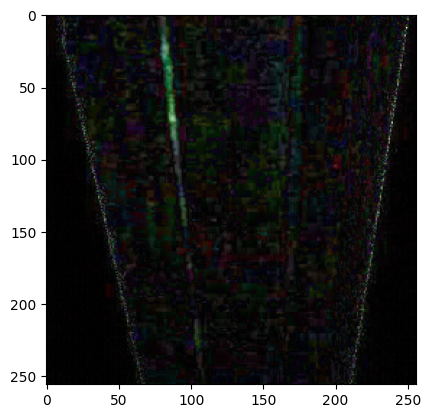

In [117]:
plt.imshow(x, cmap ='gray')

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


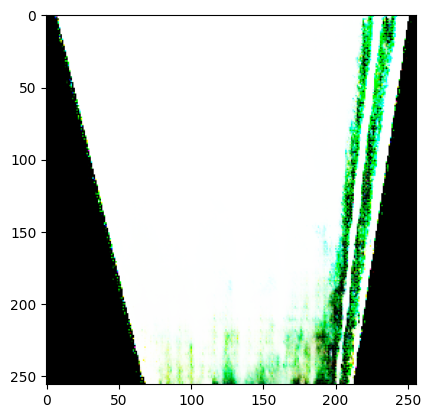

In [26]:
plt.imshow(X_test_recon[2])

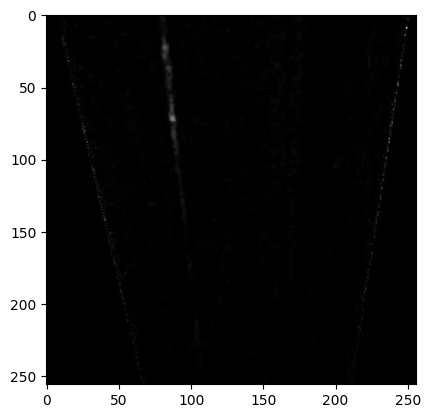

In [20]:
recon_error = np.sum((bad_dataset - X_test_recon)**2, axis=-1)
min_value = np.min(recon_error[recon_error > 0])  # Find the minimum value greater than 0
max_value = np.max(recon_error)  # Find the maximum value
normalized_x = (recon_error - min_value) / (max_value - min_value)
anomaly_map = (recon_error - np.min(recon_error)) / (np.max(recon_error) - np.min(recon_error))
plt.imshow(normalized_x[0],cmap='gray')


In [41]:
print(anomaly_map[0])

[[0.00455792 0.00697308 0.00137791 ... 0.00401898 0.00750466 0.03398532]
 [0.00286203 0.00758901 0.00115256 ... 0.00117505 0.01083492 0.06127665]
 [0.00589562 0.00095538 0.00206733 ... 0.00358448 0.00403226 0.03205442]
 ...
 [0.00125613 0.00101833 0.00034491 ... 0.00250479 0.00246193 0.01135121]
 [0.00039957 0.00273108 0.00111217 ... 0.00123185 0.00045663 0.0070865 ]
 [0.00313726 0.00820466 0.00302309 ... 0.00046302 0.00087635 0.01322074]]


In [38]:
import keras
autoencoder = keras.models.load_model('autoencoder_624.h5')

In [23]:
X_test_recon[0].shape

(256, 256, 3)

In [72]:
print(x)

None


In [112]:
def anomaly_map(image1, image2, mask):

  anomaly_map = np.zeros_like(image1)
  for i in range(image1.shape[0]):
    for j in range(image1.shape[1]):
      if mask[i, j] == 1:
        ssim_score = ssim(image1[i, j], image2[i, j])
        anomaly_map[i, j] = 1 - ssim_score

  return anomaly_map

def ssim(image1, image2):

  c1 = (0.015 * 255)**2
  c2 = (0.03 * 255)**2
  l1 = np.mean(image1)
  l2 = np.mean(image2)
  sigma1 = np.std(image1)
  sigma2 = np.std(image2)
  ssim_num = (2 * l1 * l2 + c1) * (2 * sigma1 * sigma2 + c2)
  ssim_den = (l1**2 + l2**2 + c1) * (sigma1**2 + sigma2**2 + c2)
  ssim_score = ssim_num / ssim_den

  return ssim_score


[[ 0.68691426  2.90263636  9.73321787 ... 91.99956925 50.25895262
  22.6227585 ]
 [ 0.67165219  2.84226534  9.54722897 ... 84.08401705 44.82072508
  19.71273822]
 [ 0.6350097   2.69728695  9.10044836 ... 75.06140946 38.62997723
  16.40340238]
 ...
 [ 0.          0.          0.         ...  0.          0.
   0.        ]
 [ 0.          0.          0.         ...  0.          0.
   0.        ]
 [ 0.          0.          0.         ...  0.          0.
   0.        ]]


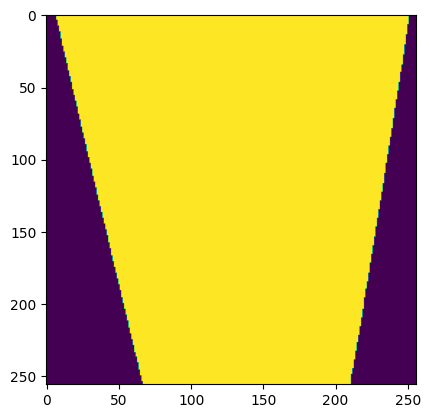

In [209]:
plt.imshow(binary_image)

In [225]:
print(x)

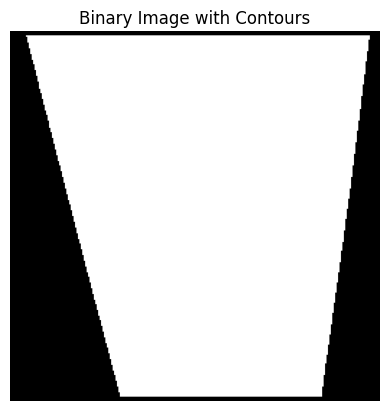

In [306]:
import matplotlib.pyplot as plt

# Assuming 'binary_image' is your binary image
binary_image_copy = binary_image.copy().astype(np.uint8)

# Find contours on the binary image
contours, _ = cv2.findContours(binary_image_copy, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

# Draw the contours on the copied binary image with black lines
cv2.drawContours(binary_image_copy, contours, -1, (0, 0, 0), thickness=3)

# Display the binary image with contours
plt.imshow(binary_image_copy, cmap='gray')
plt.axis('off')
plt.title('Binary Image with Contours')
plt.show()


In [307]:
x = anomaly_map(np.mean(bad_dataset[18], axis=2), np.mean(X_test_recon[18], axis=2), binary_image_copy)


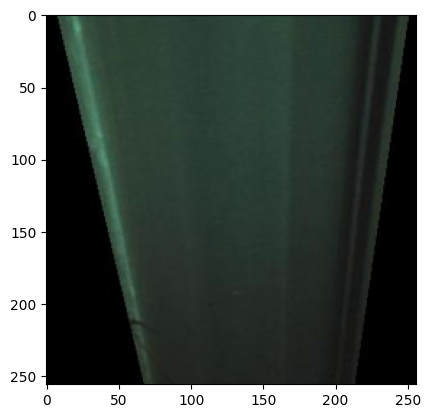

In [154]:
plt.imshow(bad_dataset[1])

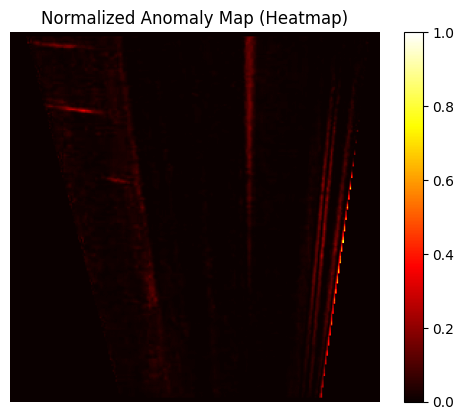

In [310]:
from sklearn.preprocessing import normalize
# Mask for non-zero values
min_value = np.min(x[x > 0])  # Find the minimum value greater than 0
max_value = np.max(x)  # Find the maximum value
normalized_x = (x - min_value) / (max_value - min_value)  # Perform min-max normalization

# Display the normalized anomaly map
plt.imshow(normalized_x, cmap='hot')
plt.axis('off')
plt.title('Normalized Anomaly Map (Heatmap)')
plt.colorbar()
plt.show()


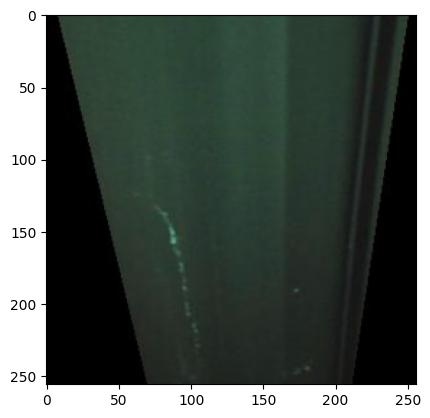

In [282]:
plt.imshow(bad_dataset[6])

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


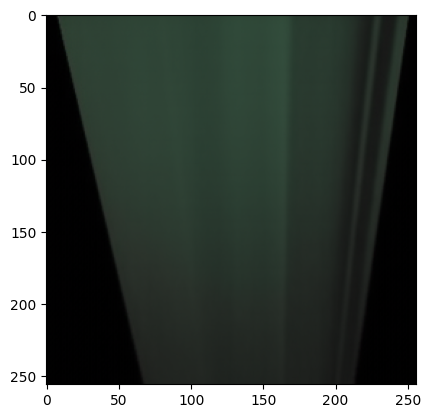

In [265]:
plt.imshow(X_test_recon[5])

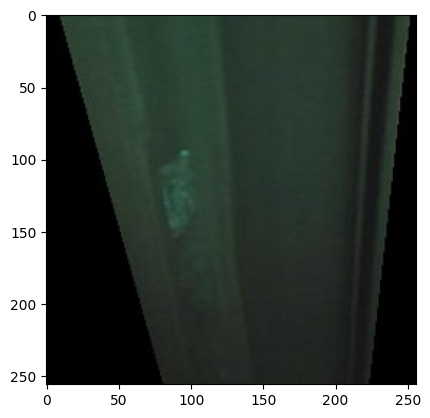

In [266]:
plt.imshow(bad_dataset[5])

In [ ]:
for i in range (binary_image.shape[0]):
    for j in range (binary_image.shape[1]):
        

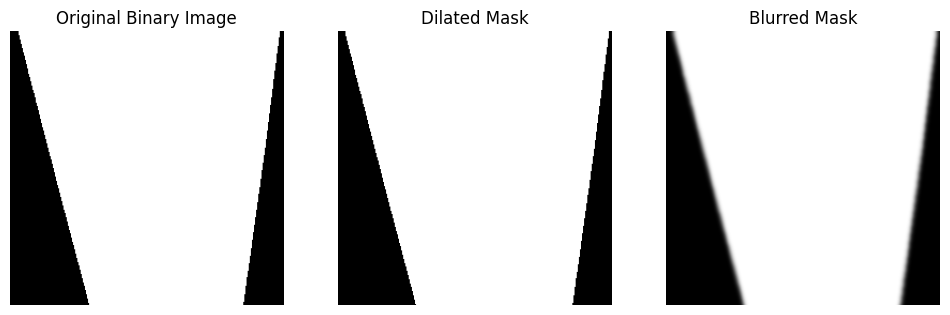

In [303]:
from skimage import io, filters, morphology
import numpy as np
import matplotlib.pyplot as plt

# Load the image
image = np.mean(bad_dataset[18], axis=2)

# Apply Gaussian blur
blurred_image = filters.gaussian(image, sigma=2)

# Apply Otsu's thresholding
thresh = filters.threshold_otsu(blurred_image) - 0.02
binary_image = blurred_image > thresh

# Perform morphological operations
dilated_mask = morphology.dilation(binary_image, morphology.square(3))
blurred_mask = filters.gaussian(dilated_mask, sigma=2)

# Display the original binary image, dilated mask, and blurred mask
fig, axes = plt.subplots(1, 3, figsize=(12, 4))
axes[0].imshow(binary_image, cmap='gray')
axes[0].set_title('Original Binary Image')
axes[0].axis('off')
axes[1].imshow(dilated_mask, cmap='gray')
axes[1].set_title('Dilated Mask')
axes[1].axis('off')
axes[2].imshow(blurred_mask, cmap='gray')
axes[2].set_title('Blurred Mask')
axes[2].axis('off')
plt.show()


In [134]:
fl = flatten_image(np.mean(bad_dataset[0], axis=2),binary_image)

[[  8   9]
 [ 10  11]
 [ 12  13]
 ...
 [205 206]
 [207 208]
 [209 210]]


error: OpenCV(4.7.0) :-1: error: (-5:Bad argument) in function 'getPerspectiveTransform'
> Overload resolution failed:
>  - dst is not a numpy array, neither a scalar
>  - Expected Ptr<cv::UMat> for argument 'dst'


In [334]:
import numpy as np
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import os

# Example usage
 # Your training images stored in a NumPy array
save_dir = "aug"  # Directory to save augmented images

# Create the save directory if it doesn't exist
os.makedirs(save_dir, exist_ok=True)

# Define the image data generator with desired augmentation parameters
datagen = ImageDataGenerator(rotation_range=5, width_shift_range=0.1, height_shift_range=0.1)

# Create augmented images and save them to the specified directory
for i, image in enumerate(dataset_s):
    augmented_images = datagen.flow(np.expand_dims(image, axis=0), batch_size=1, save_to_dir=save_dir, save_prefix='augmented_', save_format='jpg')
    for j, augmented_image in enumerate(augmented_images):
        if j >= 3:  # Save 3 augmented images per original image
            break
        if j == 0:  # Skip the original image
            continue


In [330]:
dataset_s = np.array(dataset_s)
type(dataset_s)

numpy.ndarray

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

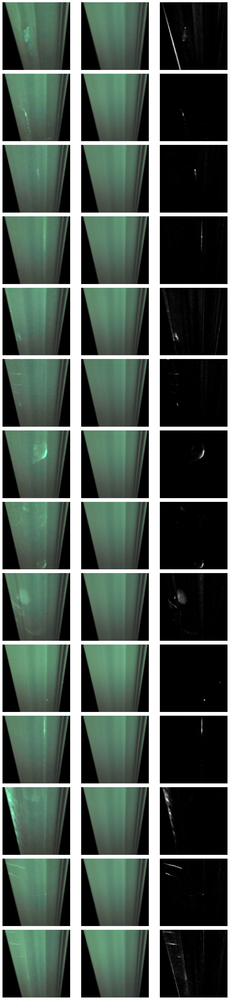

In [18]:
fig, axs = plt.subplots(14, 3 ,figsize=(10,40))
j = 0
for i in range(14):
        axs[i, j].imshow(bad_dataset[i+5])
        axs[i, j].axis('off')
        axs[i, j+1].imshow(X_test_recon[i+5])
        axs[i, j+1].axis('off')
        axs[i, j+2].imshow(anomaly_map[i+5], cmap='gray')
        axs[i, j+2].axis('off')
        j = 0

plt.tight_layout()
plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

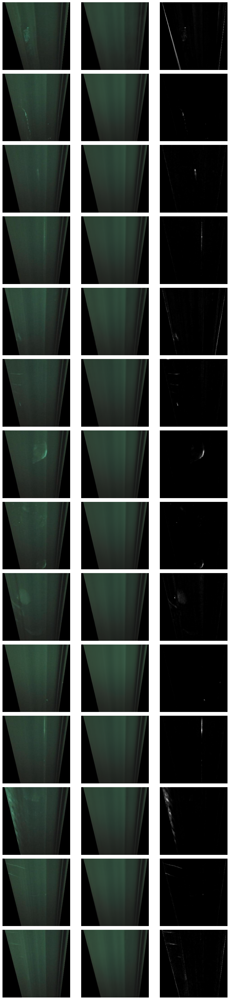

In [28]:
fig, axs = plt.subplots(14, 3 ,figsize=(10,40))
j = 0
for i in range(14):
        axs[i, j].imshow(bad_dataset[i+5])
        axs[i, j].axis('off')
        axs[i, j+1].imshow(X_test_recon[i+5])
        axs[i, j+1].axis('off')
        axs[i, j+2].imshow(anomaly_map[i+5], cmap='gray')
        axs[i, j+2].axis('off')
        j = 0

plt.tight_layout()
plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

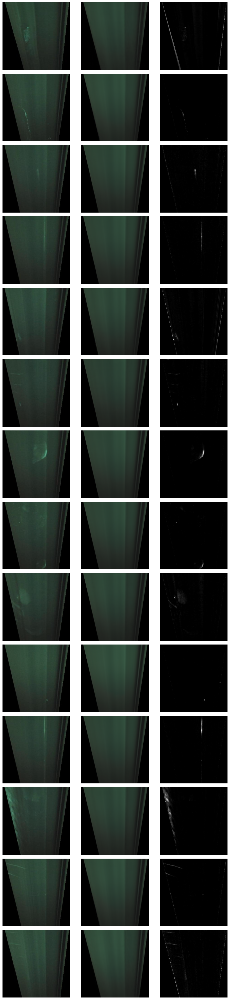

In [22]:
fig, axs = plt.subplots(14, 3 ,figsize=(10,40))
j = 0
for i in range(14):
        axs[i, j].imshow(bad_dataset[i+5])
        axs[i, j].axis('off')
        axs[i, j+1].imshow(X_test_recon[i+5])
        axs[i, j+1].axis('off')
        axs[i, j+2].imshow(anomaly_map[i+5], cmap='gray')
        axs[i, j+2].axis('off')
        j = 0

plt.tight_layout()
plt.show()